## Setup

In [1]:
import torch
from matplotlib import pyplot as plt
from sklearn.datasets import fetch_california_housing
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
from torch import nn, optim
from torch.utils.data import TensorDataset
from torcheval.metrics import functional as funcmetrics

from common import *

In [2]:
torch.manual_seed(2024)
torch.use_deterministic_algorithms(True)

In [3]:
california = fetch_california_housing(data_home="datasets")

X = california.data
y = california.target

In [4]:
california_scaler = StandardScaler()
california_dataset = TensorDataset(
    torch.tensor(california_scaler.fit_transform(X), dtype=torch.float),
    torch.tensor(y, dtype=torch.float)
)

california_datasets = shuffle_train_valid_test_split(california_dataset)
california_headers: list = california.feature_names

In [5]:
def optimizer_factory(model):
    return optim.Adam(model.parameters(), lr=0.001)


criterion = nn.MSELoss()

In [6]:
labels = ("mse")


def score_outputs(outputs, targets):
    return (
        funcmetrics.mean_squared_error(outputs, targets).item(),
    )

## Base model

In [7]:
class CaliforniaNN(nn.Module):
    def __init__(self, input_dim=8, hidden_dims=(64, 64)):
        super(CaliforniaNN, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Linear(input_dim, hidden_dims[0]),
            nn.ReLU()
        )
        self.layer2 = nn.Sequential(
            nn.Linear(hidden_dims[0], hidden_dims[1]),
            nn.ReLU(),
            nn.Dropout(0.3),
        )
        self.out = nn.Linear(hidden_dims[1], 1)

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.out(x)
        return x.flatten()

test: mse: (0.27178755402565,)


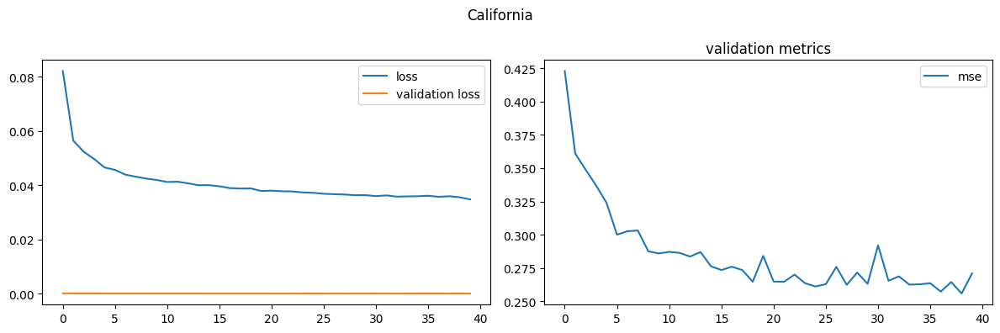

In [8]:
datasets = california_datasets

model = CaliforniaNN()
optimizer = optimizer_factory(model)

metrics = model_train(datasets, model, optimizer, criterion, score_outputs, 40)

with torch.no_grad():
    inputs, targets = datasets["test"][:]
    outputs = model(inputs)

    test_metrics = score_outputs(outputs, targets)

print(f"test: {labels}: {test_metrics}")
plot_metrics('California', metrics, labels)

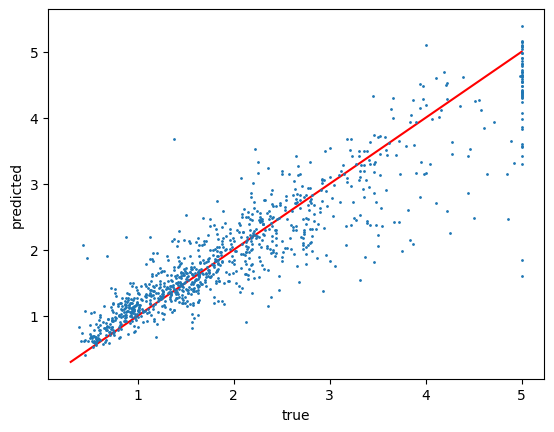

In [9]:
plt.plot([0.3, 5], [0.3, 5], c='r')
plt.plot(datasets["test"].tensors[1][:1000], outputs[:1000], '.', ms=2)
plt.xlabel("true")
plt.ylabel("predicted")
plt.show()

## DGSM

In [10]:
best_model = CaliforniaNN()

### input layer

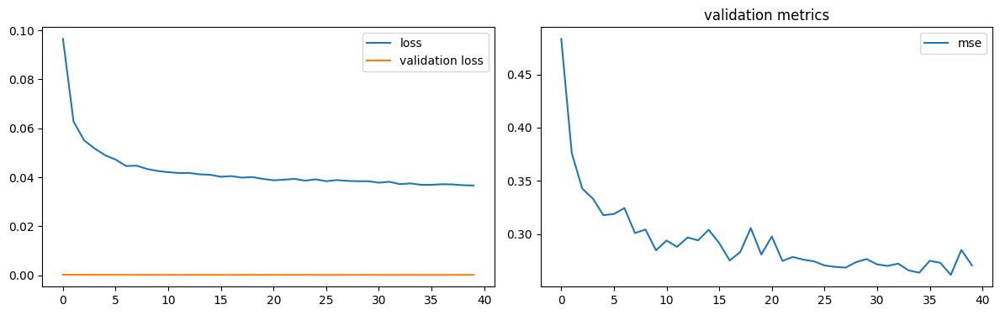

num of dropped: 0
Test: loss: 0.27314701676368713, avg metrics: (0.2725498199462891,)
dropping feature: (2, 'AveRooms')


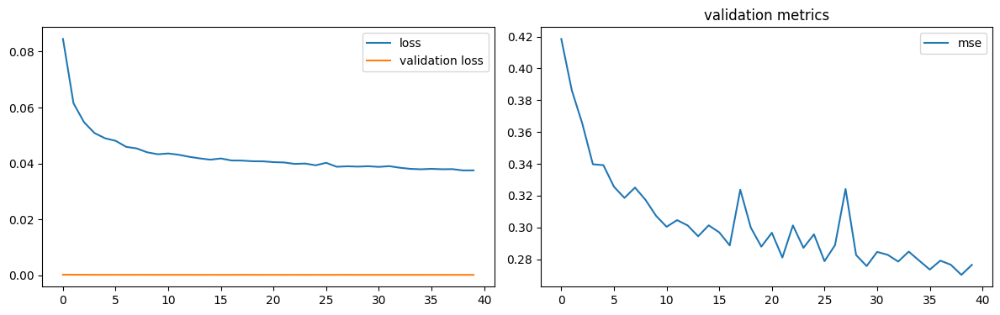

num of dropped: 1
Test: loss: 0.27632230520248413, avg metrics: (0.2762732982635498,)
dropping feature: (3, 'Population')


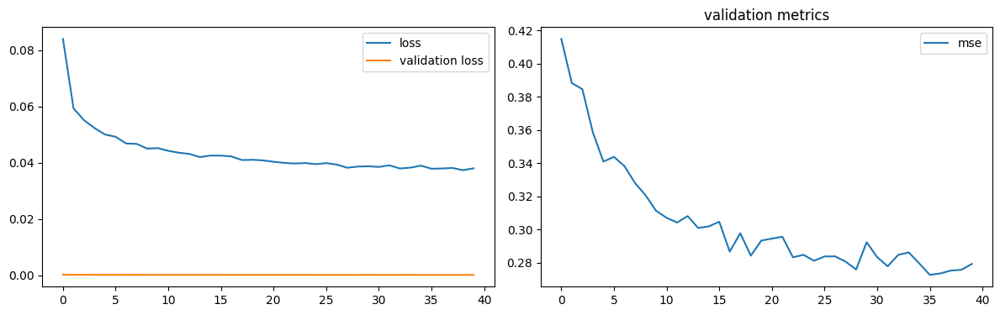

num of dropped: 2
Test: loss: 0.27964484691619873, avg metrics: (0.27689096331596375,)
dropping feature: (0, 'MedInc')


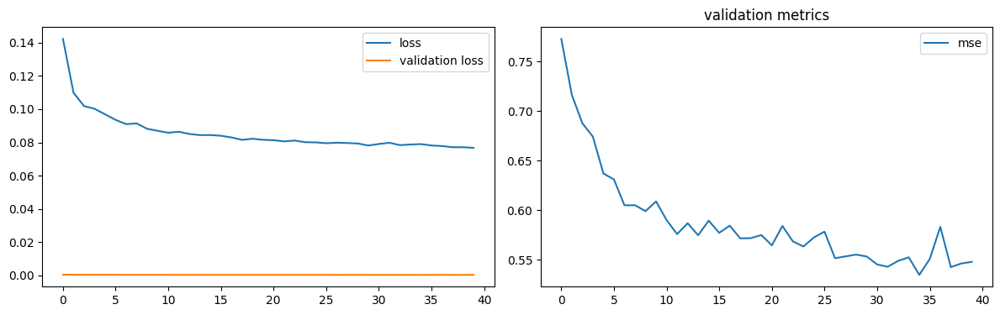

num of dropped: 3
Test: loss: 0.585381805896759, avg metrics: (0.5944822907447815,)
dropping feature: (0, 'HouseAge')


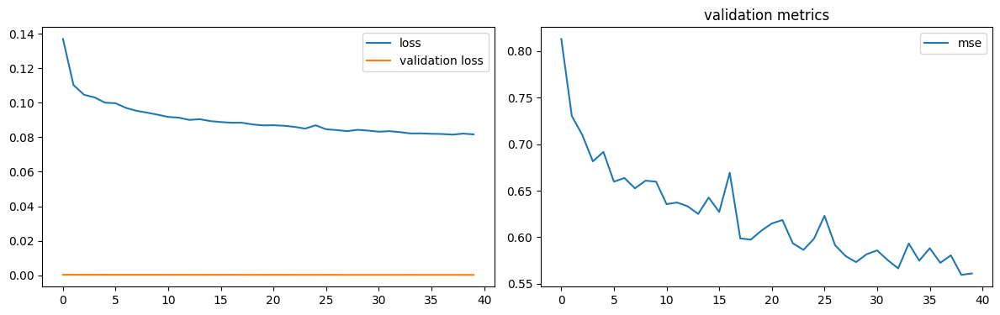

num of dropped: 4
Test: loss: 0.6088414788246155, avg metrics: (0.6250070929527283,)
dropping feature: (0, 'AveBedrms')


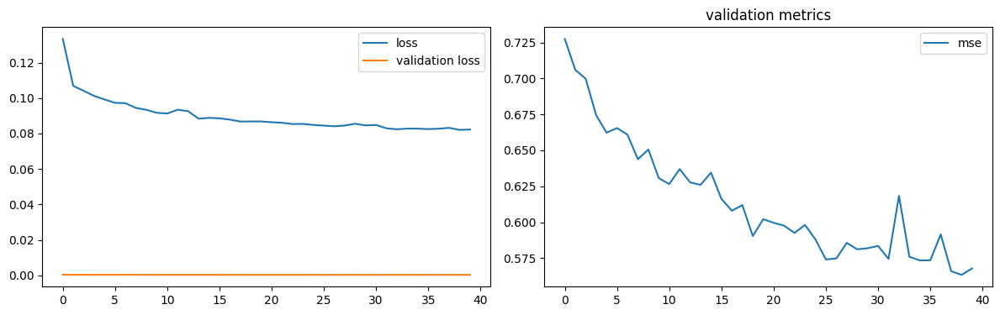

num of dropped: 5
Test: loss: 0.6086664199829102, avg metrics: (0.621917188167572,)
dropping feature: (2, 'Longitude')


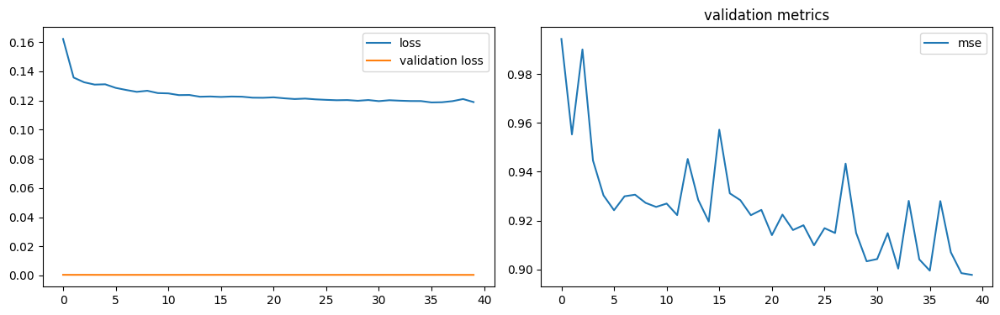

num of dropped: 6
Test: loss: 0.9693474769592285, avg metrics: (0.9389464616775512,)
dropping feature: (1, 'Latitude')


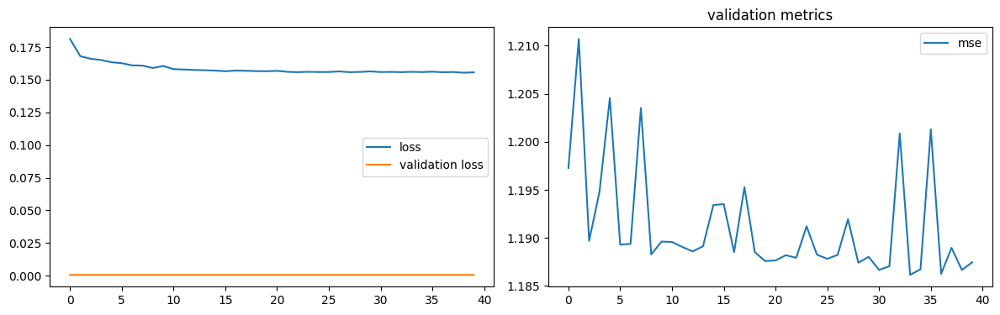

num of dropped: 7
Test: loss: 1.212074637413025, avg metrics: (1.2105799198150635,)


In [11]:
torch.manual_seed(2024)

datasets = california_datasets.copy()
headers = california_headers.copy()


def model_factory(size):
    return CaliforniaNN(size)


test_metrics, dropped, models = prune(
    datasets, headers, analyze_dgsm,
    model_factory, optimizer_factory, criterion, score_outputs, 40,
    labels, "", None
)

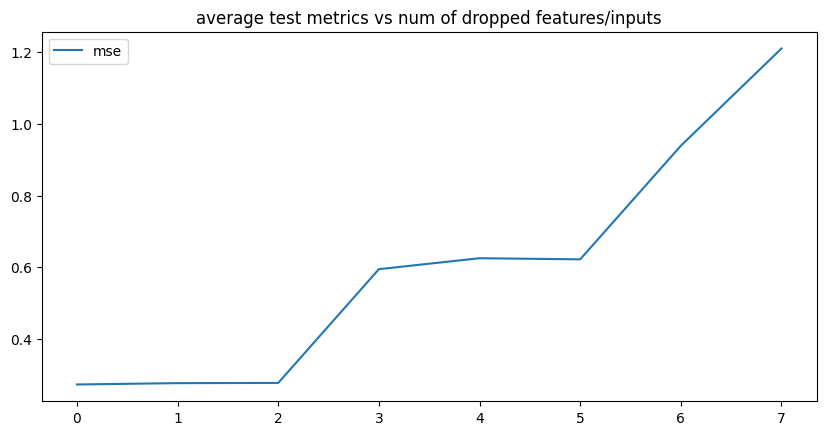

In [12]:
plot_dropping_metrics(test_metrics, labels)

In [13]:
num_drop_features = 2

save_models("california", "dgsm-layer1", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_features)
layer = models[num_drop_features].layer1

best_model.layer1 = layer

dgsm_datasets = reduced_datasets

features left [6]:  ['MedInc', 'HouseAge', 'AveBedrms', 'AveOccup', 'Latitude', 'Longitude']


### 1st hidden layer

In [14]:
layer.eval()

datasets = {
    key: TensorDataset(
        layer(dataset.tensors[0]).detach(),
        dataset.tensors[1]
    )
    for key, dataset in reduced_datasets.items()
}

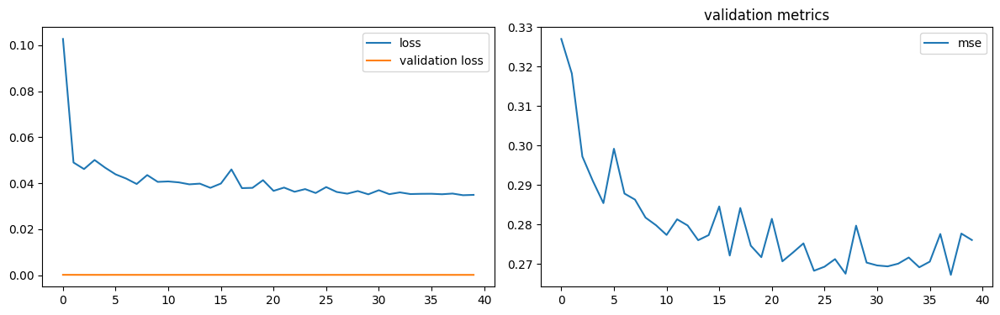

num of dropped: 0
Test: loss: 0.271645724773407, avg metrics: (0.26424819231033325,)
dropping feature: (22, 'neuron22')


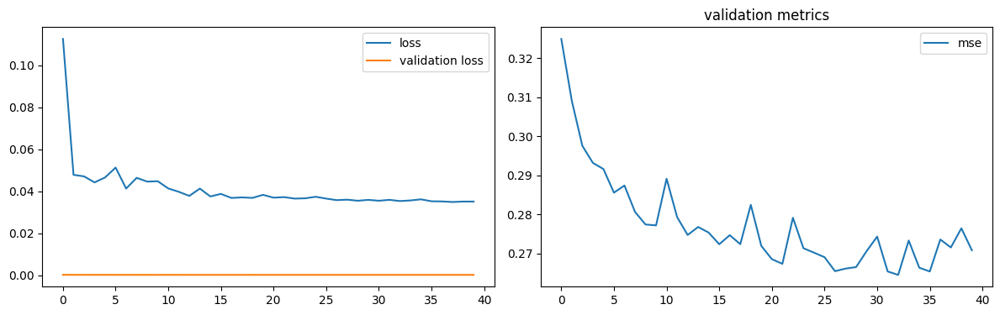

num of dropped: 1
Test: loss: 0.2648470103740692, avg metrics: (0.26616509556770324,)
dropping feature: (47, 'neuron48')


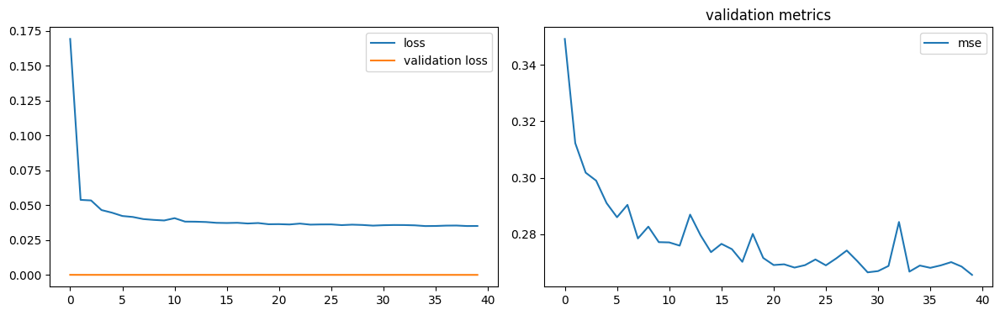

num of dropped: 2
Test: loss: 0.2625797986984253, avg metrics: (0.26623947620391847,)
dropping feature: (48, 'neuron50')


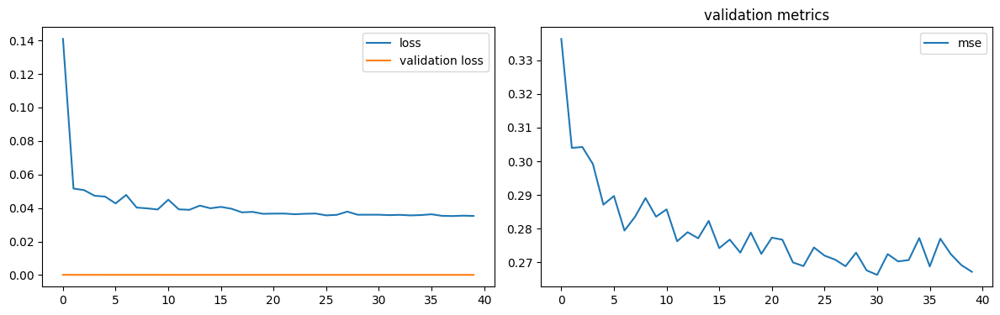

num of dropped: 3
Test: loss: 0.2614278197288513, avg metrics: (0.263320779800415,)
dropping feature: (48, 'neuron51')


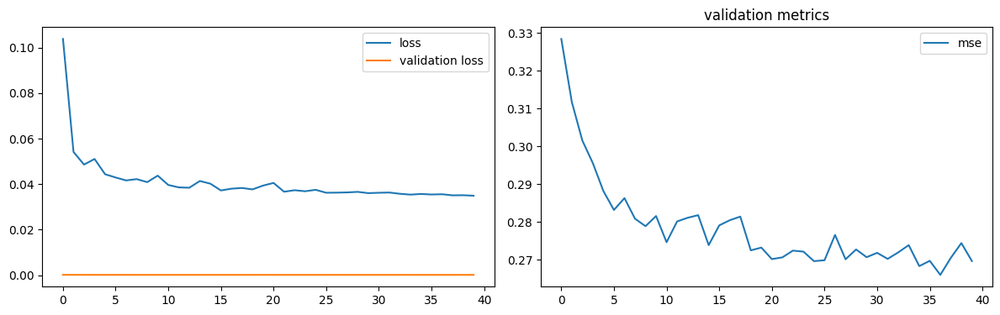

num of dropped: 4
Test: loss: 0.26633068919181824, avg metrics: (0.2636337220668793,)
dropping feature: (46, 'neuron47')


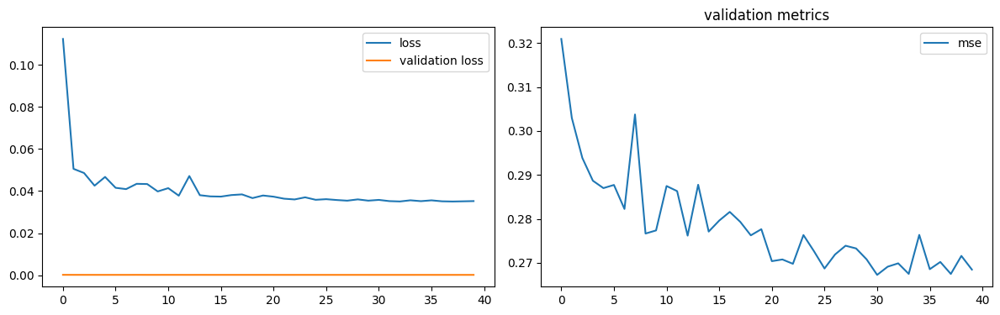

num of dropped: 5
Test: loss: 0.2620830237865448, avg metrics: (0.2645474374294281,)
dropping feature: (27, 'neuron28')


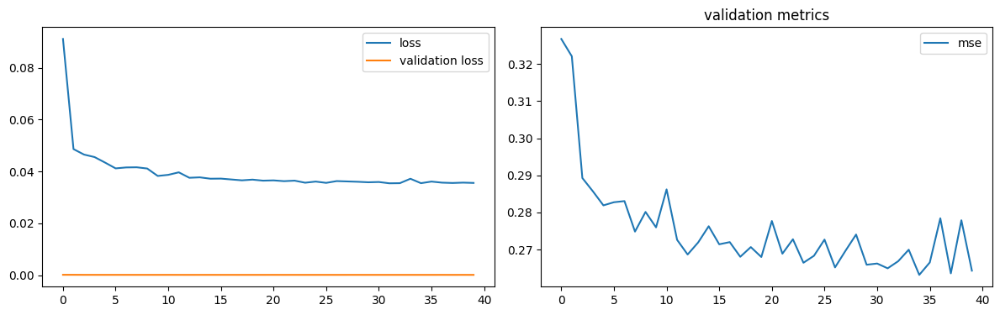

num of dropped: 6
Test: loss: 0.26180773973464966, avg metrics: (0.2629442512989044,)
dropping feature: (49, 'neuron55')


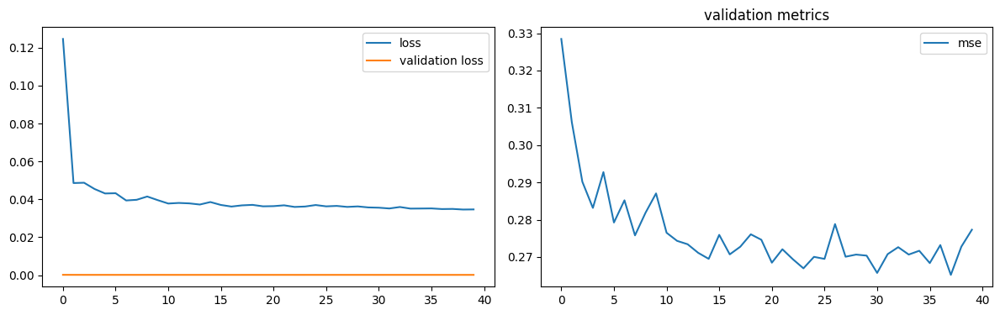

num of dropped: 7
Test: loss: 0.2718164026737213, avg metrics: (0.2649707496166229,)
dropping feature: (46, 'neuron52')


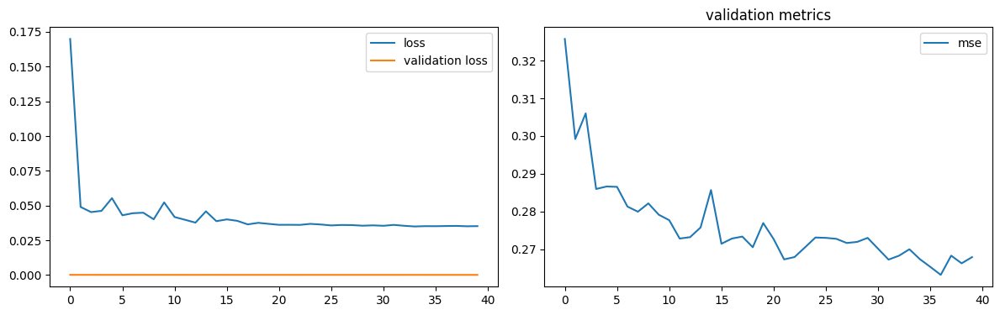

num of dropped: 8
Test: loss: 0.2620764970779419, avg metrics: (0.26561318039894105,)
dropping feature: (10, 'neuron10')


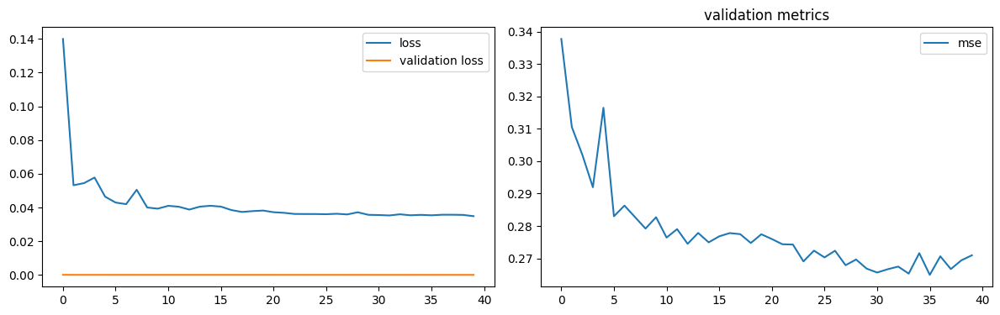

num of dropped: 9
Test: loss: 0.26390036940574646, avg metrics: (0.26297929883003235,)
dropping feature: (53, 'neuron62')


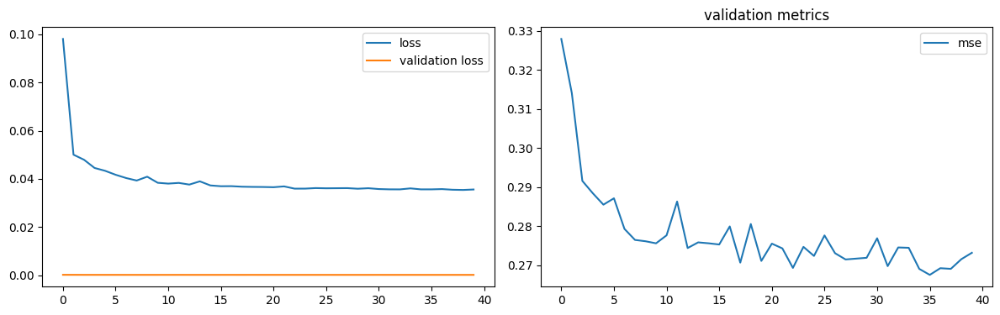

num of dropped: 10
Test: loss: 0.26657524704933167, avg metrics: (0.263127064704895,)
dropping feature: (2, 'neuron2')


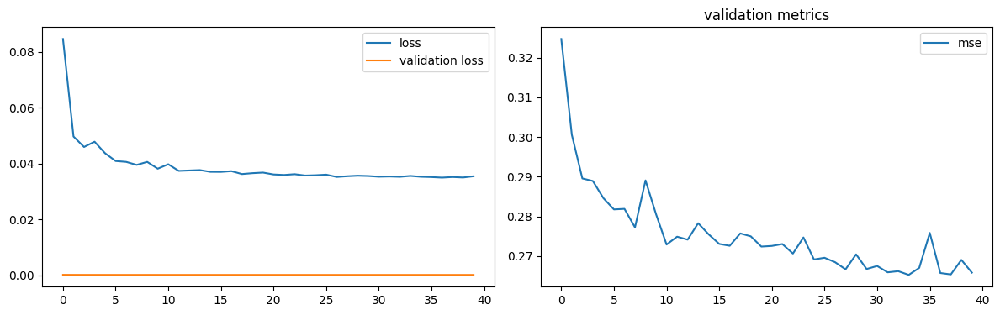

num of dropped: 11
Test: loss: 0.26017022132873535, avg metrics: (0.26298239827156067,)
dropping feature: (30, 'neuron34')


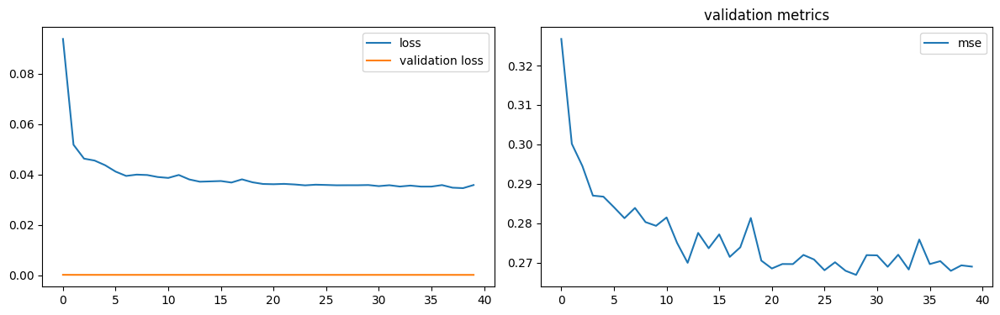

num of dropped: 12
Test: loss: 0.2906513214111328, avg metrics: (0.2685506522655487,)
dropping feature: (49, 'neuron60')


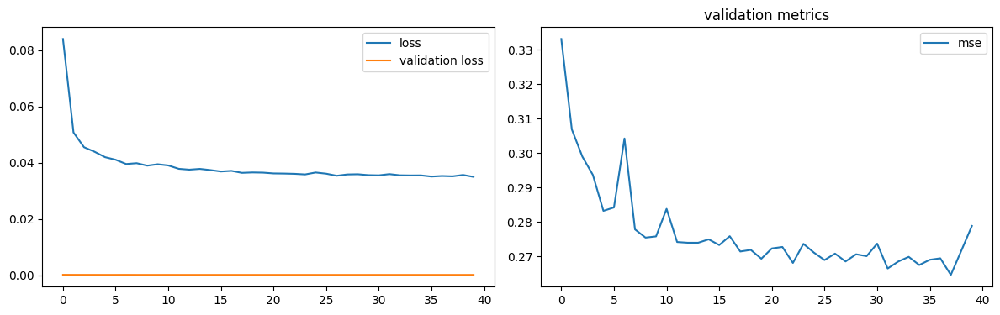

num of dropped: 13
Test: loss: 0.2819892466068268, avg metrics: (0.2671118438243866,)
dropping feature: (34, 'neuron39')


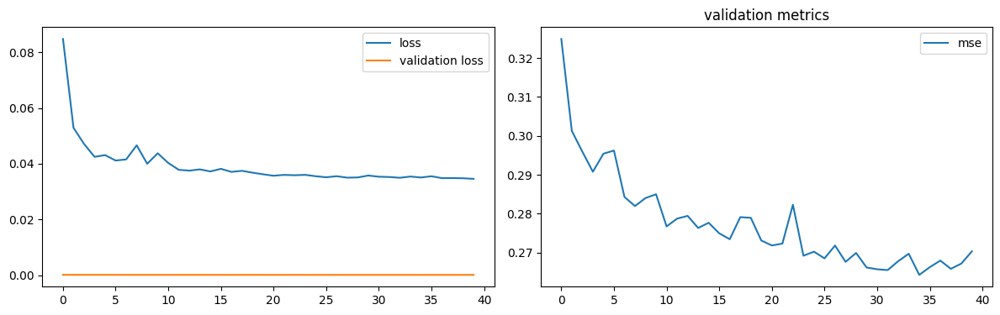

num of dropped: 14
Test: loss: 0.2676406800746918, avg metrics: (0.26598615646362306,)
dropping feature: (42, 'neuron53')


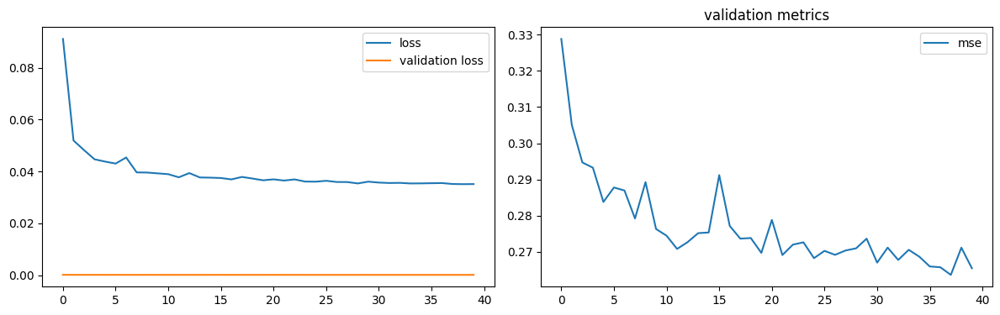

num of dropped: 15
Test: loss: 0.26235583424568176, avg metrics: (0.2652763307094574,)
dropping feature: (39, 'neuron45')


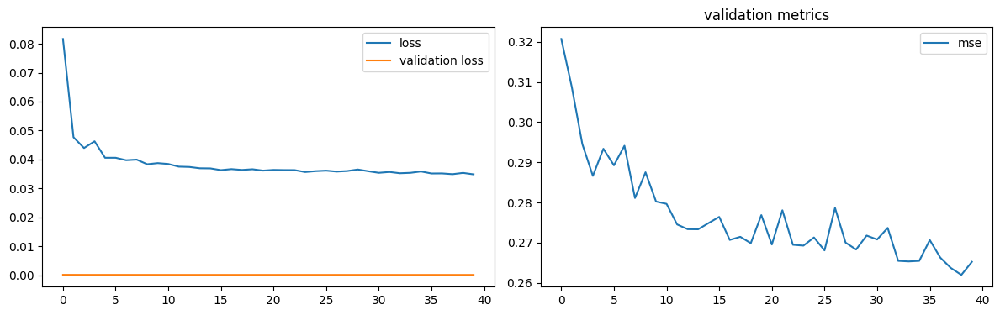

num of dropped: 16
Test: loss: 0.2620376944541931, avg metrics: (0.2624242424964905,)
dropping feature: (45, 'neuron59')


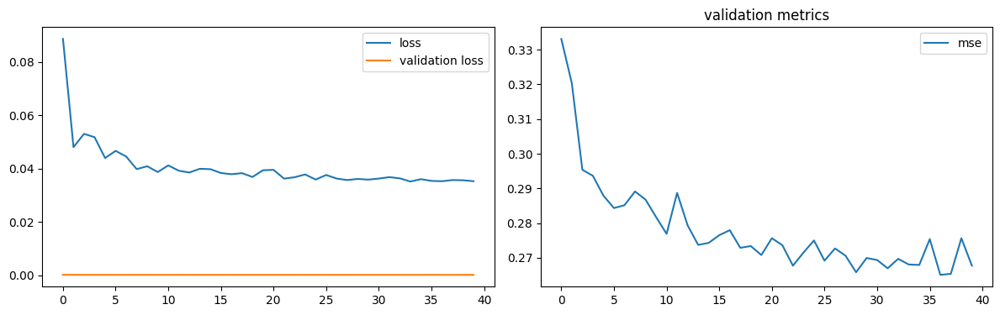

num of dropped: 17
Test: loss: 0.2736179828643799, avg metrics: (0.2645947277545929,)
dropping feature: (38, 'neuron44')


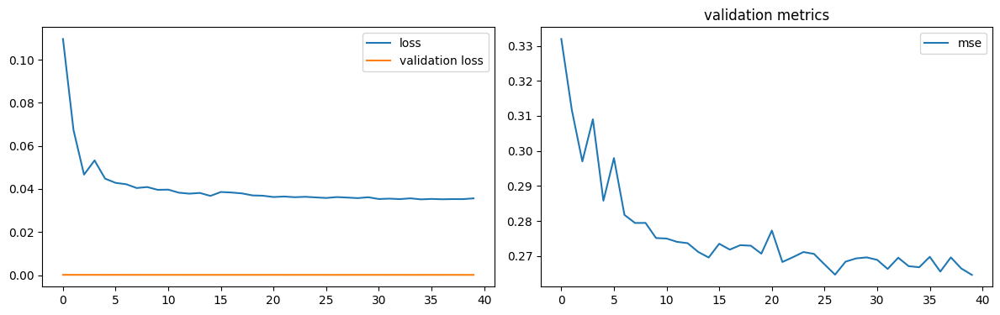

num of dropped: 18
Test: loss: 0.2609563171863556, avg metrics: (0.26561208367347716,)
dropping feature: (28, 'neuron32')


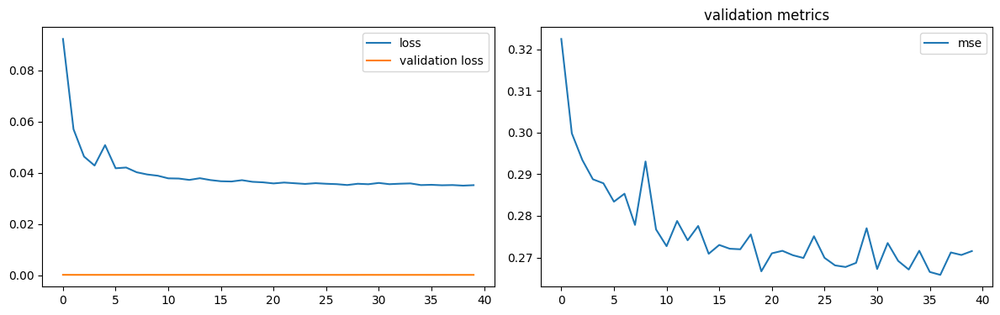

num of dropped: 19
Test: loss: 0.2621159851551056, avg metrics: (0.26399351954460143,)
dropping feature: (26, 'neuron30')


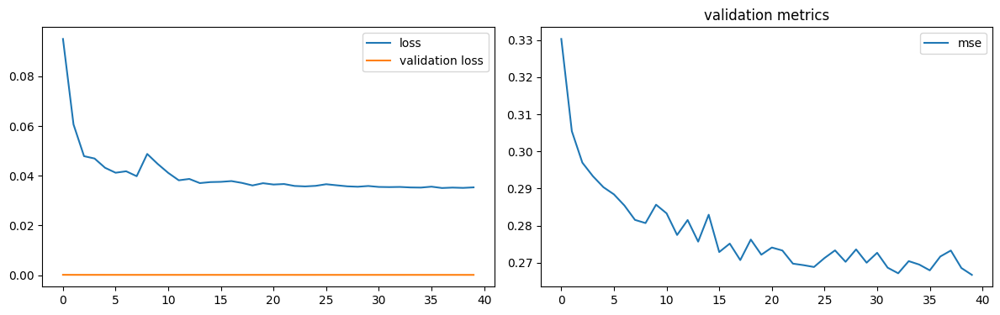

num of dropped: 20
Test: loss: 0.26212266087532043, avg metrics: (0.2699053347110748,)
dropping feature: (35, 'neuron43')


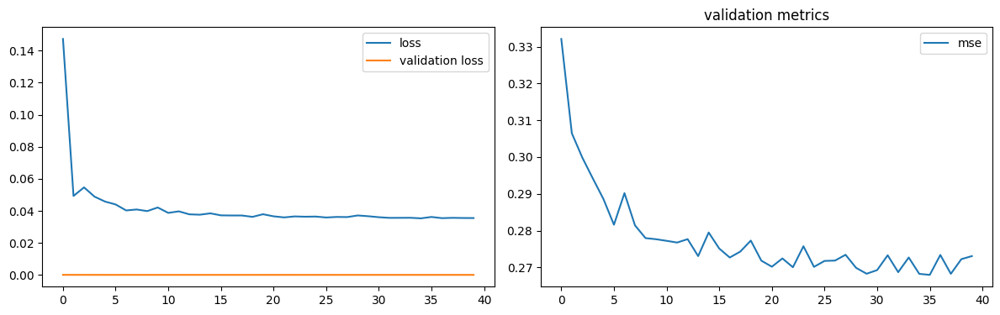

num of dropped: 21
Test: loss: 0.26629239320755005, avg metrics: (0.26583127975463866,)
dropping feature: (33, 'neuron41')


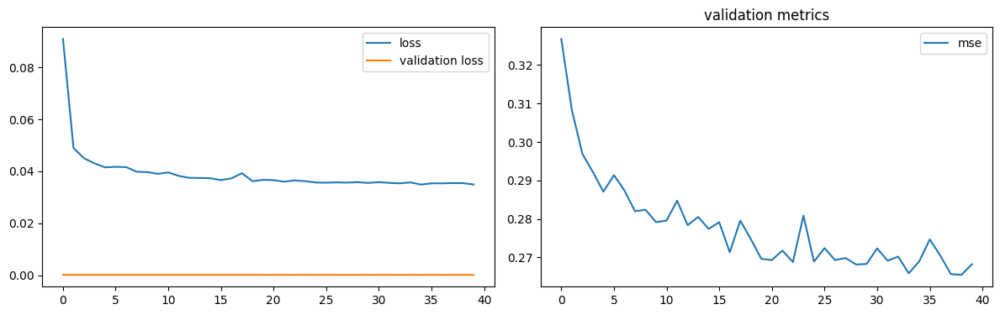

num of dropped: 22
Test: loss: 0.26533767580986023, avg metrics: (0.2659085512161255,)
dropping feature: (35, 'neuron49')


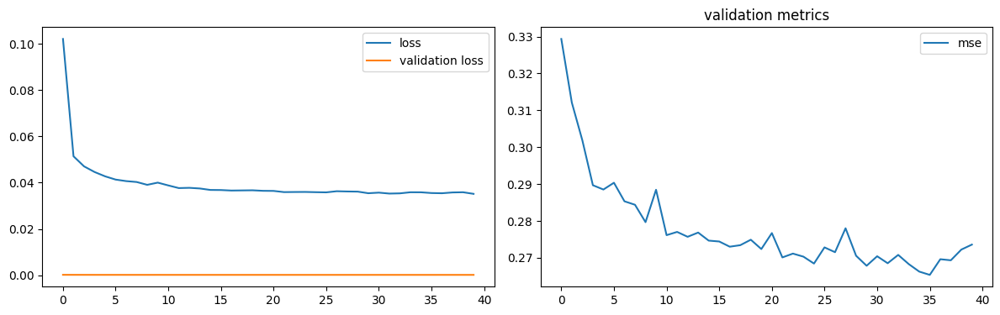

num of dropped: 23
Test: loss: 0.2688133418560028, avg metrics: (0.2669210433959961,)
dropping feature: (2, 'neuron3')


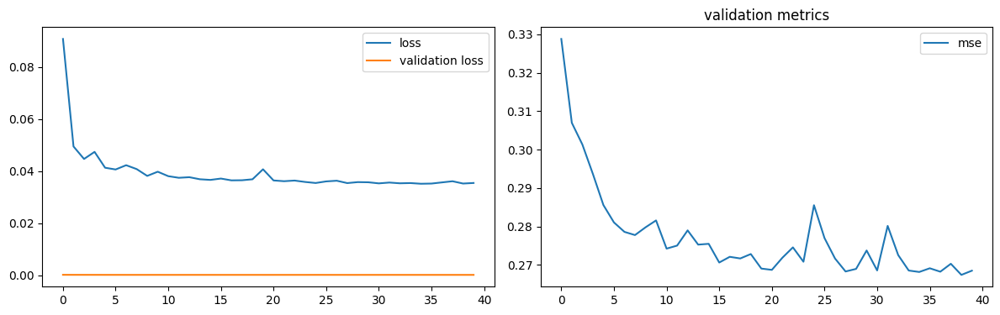

num of dropped: 24
Test: loss: 0.2825102210044861, avg metrics: (0.26915833353996277,)
dropping feature: (8, 'neuron11')


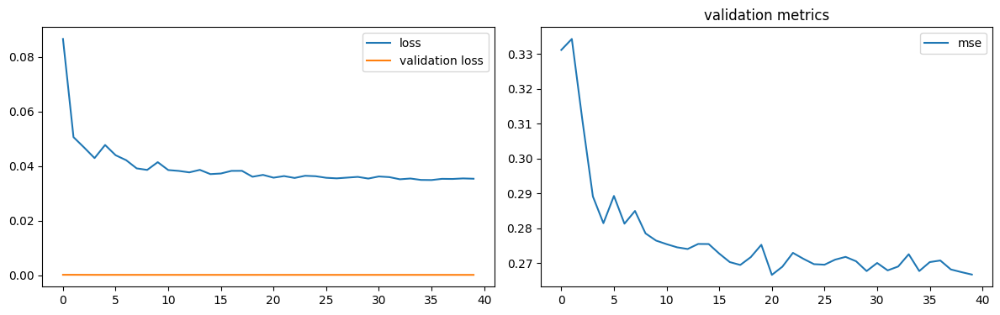

num of dropped: 25
Test: loss: 0.26073068380355835, avg metrics: (0.26496182680130004,)
dropping feature: (30, 'neuron40')


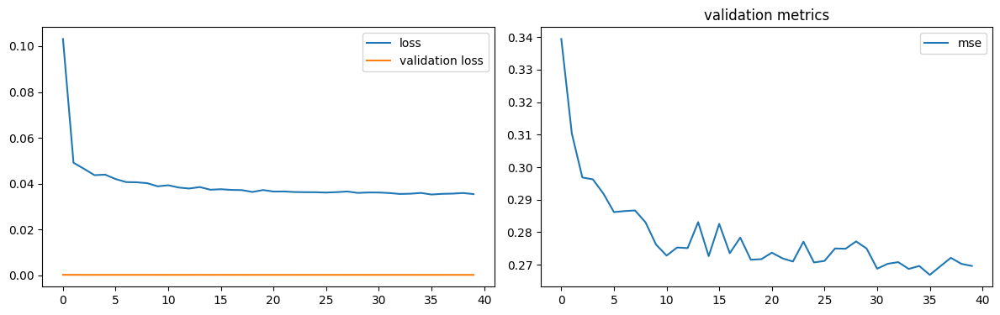

num of dropped: 26
Test: loss: 0.26692748069763184, avg metrics: (0.267703914642334,)
dropping feature: (35, 'neuron58')


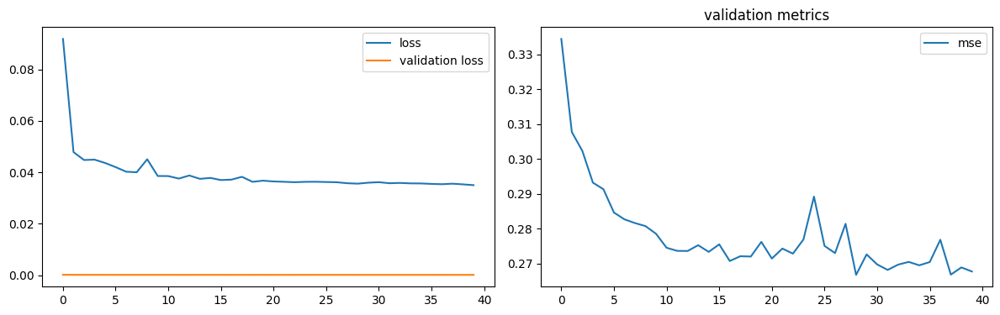

num of dropped: 27
Test: loss: 0.2641810476779938, avg metrics: (0.2657216310501099,)
dropping feature: (16, 'neuron20')


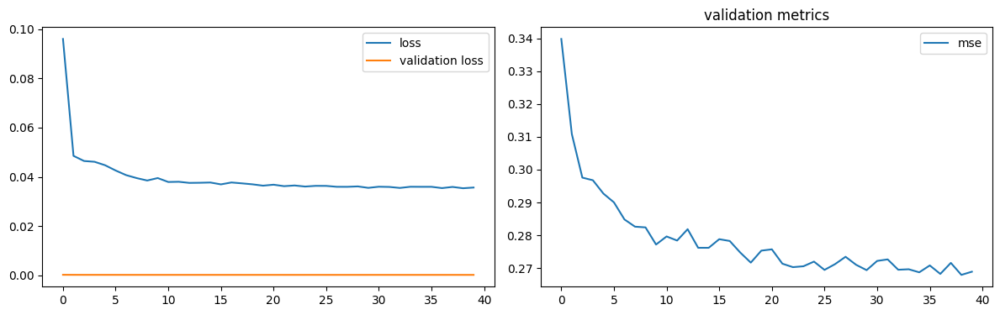

num of dropped: 28
Test: loss: 0.2651338577270508, avg metrics: (0.26706780195236207,)
dropping feature: (12, 'neuron16')


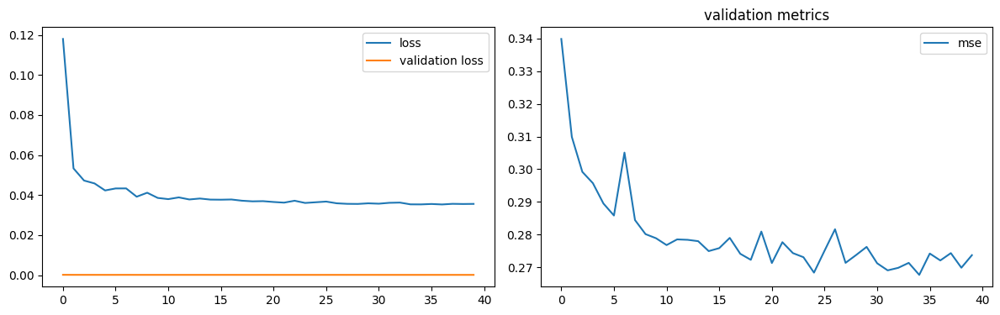

num of dropped: 29
Test: loss: 0.27109071612358093, avg metrics: (0.26825191974639895,)
dropping feature: (33, 'neuron61')


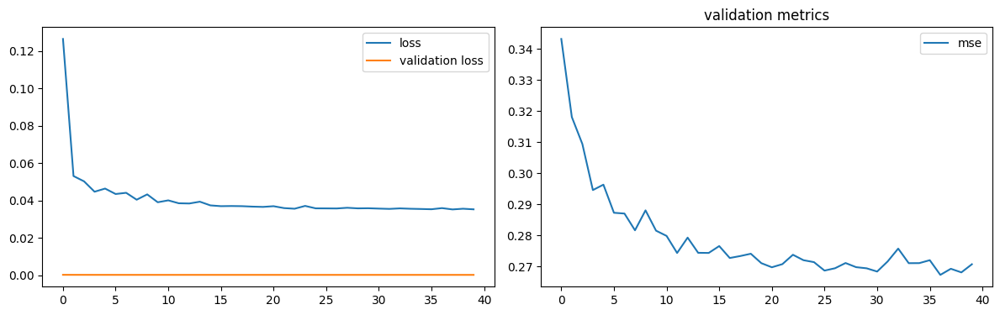

num of dropped: 30
Test: loss: 0.2701666057109833, avg metrics: (0.2702414631843567,)
dropping feature: (7, 'neuron9')


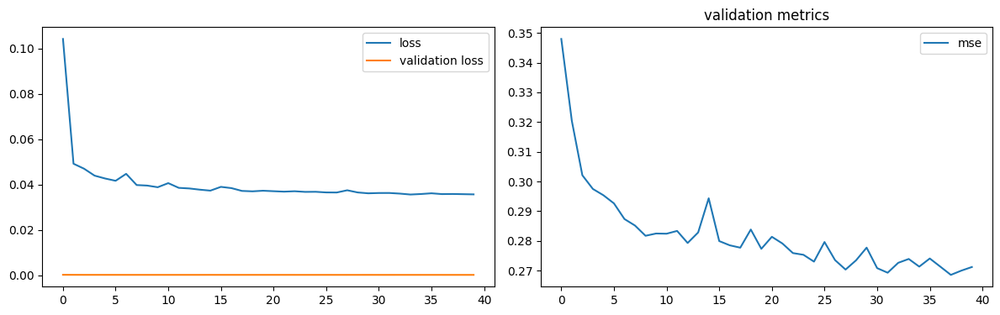

num of dropped: 31
Test: loss: 0.2754575312137604, avg metrics: (0.2693441390991211,)
dropping feature: (2, 'neuron4')


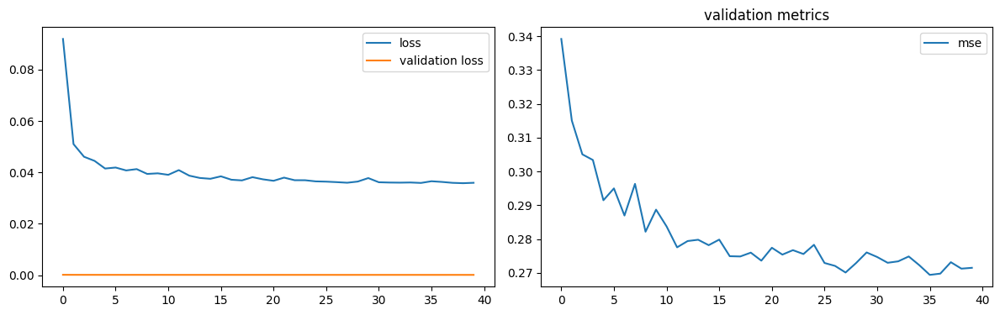

num of dropped: 32
Test: loss: 0.27683934569358826, avg metrics: (0.2802977919578552,)
dropping feature: (30, 'neuron57')


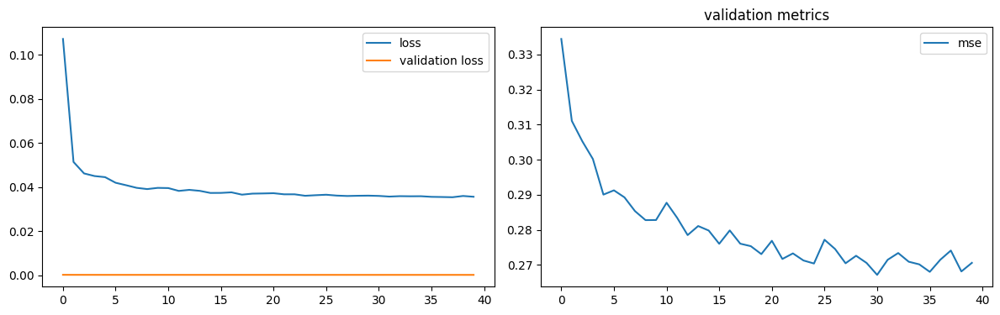

num of dropped: 33
Test: loss: 0.2668403685092926, avg metrics: (0.2754080593585968,)
dropping feature: (28, 'neuron54')


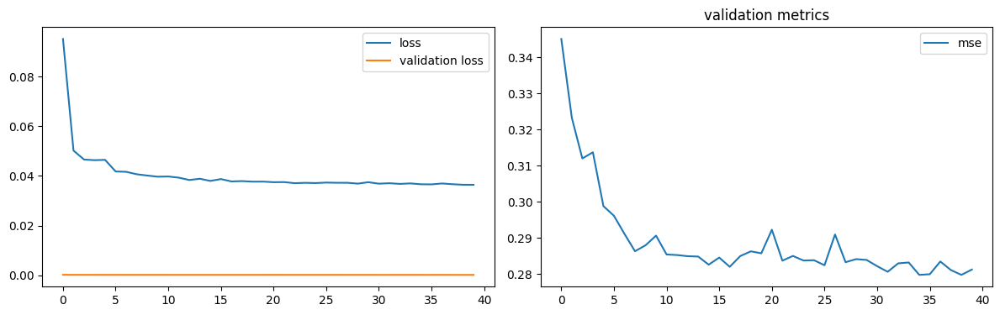

num of dropped: 34
Test: loss: 0.2687775790691376, avg metrics: (0.2719552218914032,)
dropping feature: (24, 'neuron37')


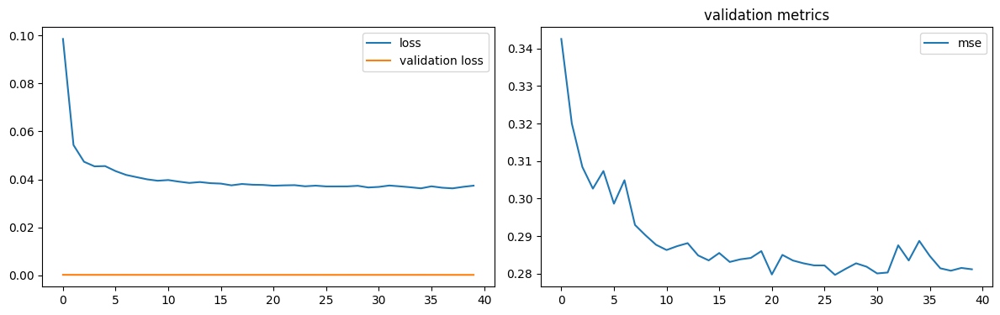

num of dropped: 35
Test: loss: 0.27124130725860596, avg metrics: (0.2774195849895477,)
dropping feature: (25, 'neuron42')


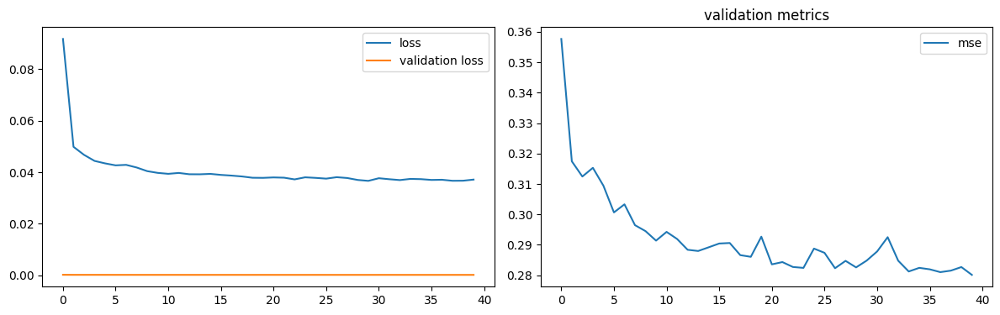

num of dropped: 36
Test: loss: 0.271001935005188, avg metrics: (0.2756766974925995,)
dropping feature: (8, 'neuron14')


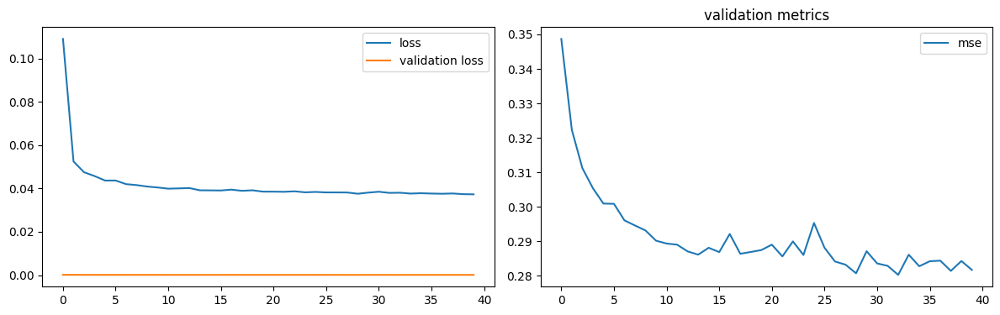

num of dropped: 37
Test: loss: 0.27318912744522095, avg metrics: (0.27630348801612853,)
dropping feature: (15, 'neuron25')


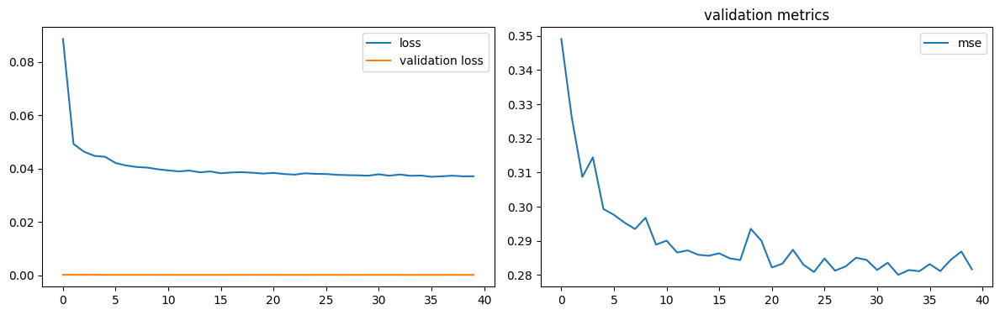

num of dropped: 38
Test: loss: 0.2831847667694092, avg metrics: (0.2759935915470123,)
dropping feature: (15, 'neuron26')


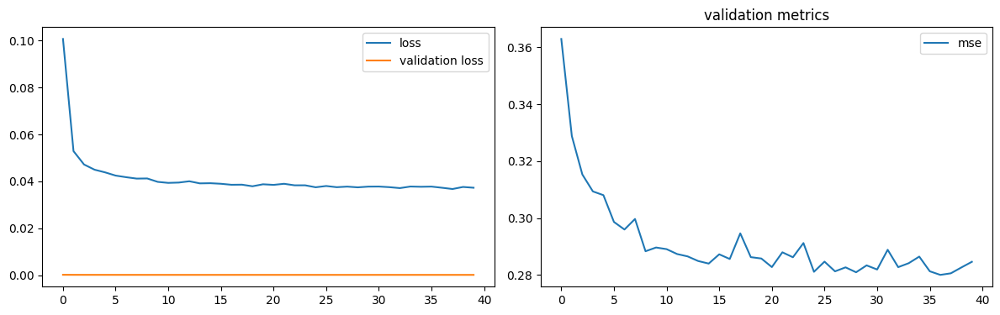

num of dropped: 39
Test: loss: 0.2774348556995392, avg metrics: (0.2799610435962677,)
dropping feature: (24, 'neuron63')


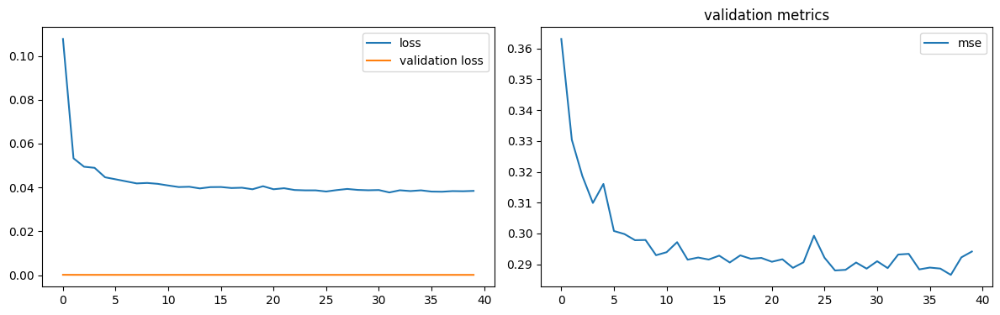

num of dropped: 40
Test: loss: 0.28843599557876587, avg metrics: (0.2864090144634247,)
dropping feature: (2, 'neuron5')


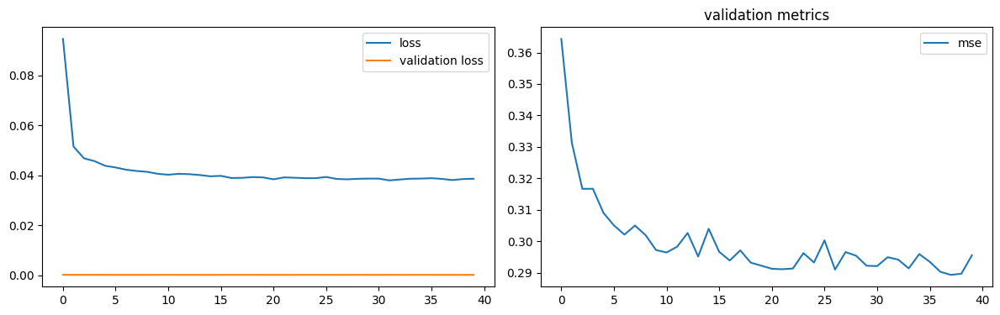

num of dropped: 41
Test: loss: 0.291703999042511, avg metrics: (0.2857526779174805,)
dropping feature: (15, 'neuron29')


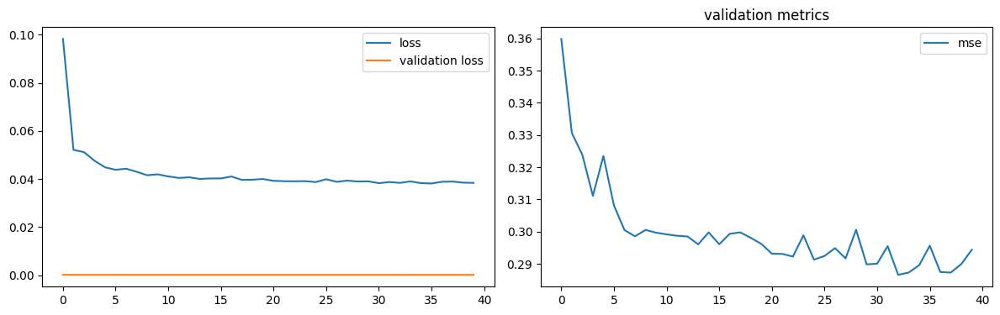

num of dropped: 42
Test: loss: 0.2852395474910736, avg metrics: (0.28536555767059324,)
dropping feature: (4, 'neuron8')


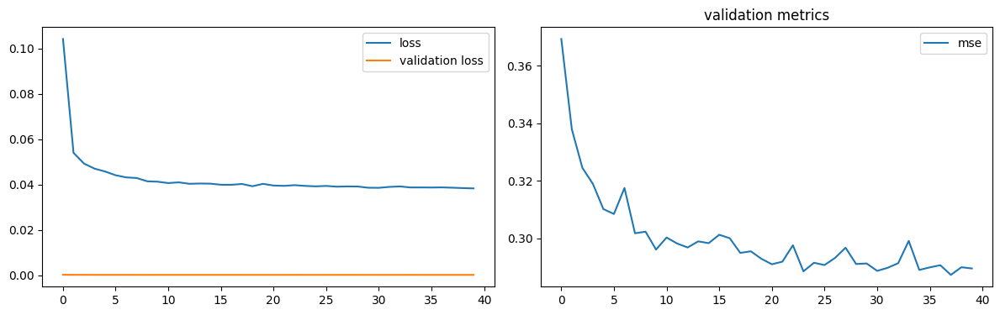

num of dropped: 43
Test: loss: 0.28306862711906433, avg metrics: (0.28989662528038024,)
dropping feature: (19, 'neuron46')


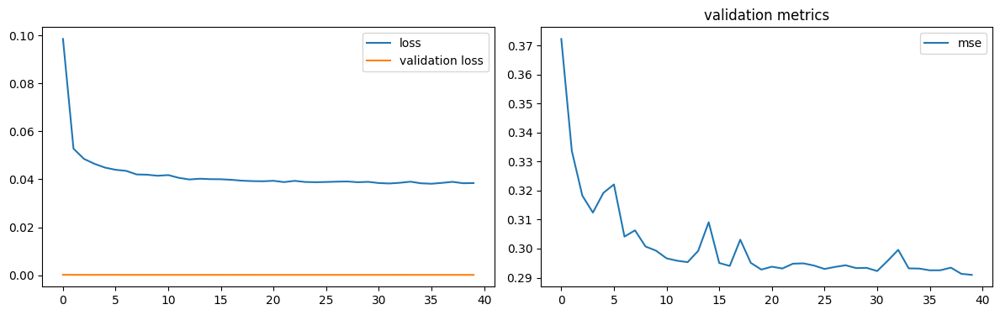

num of dropped: 44
Test: loss: 0.29363781213760376, avg metrics: (0.288262403011322,)
dropping feature: (13, 'neuron27')


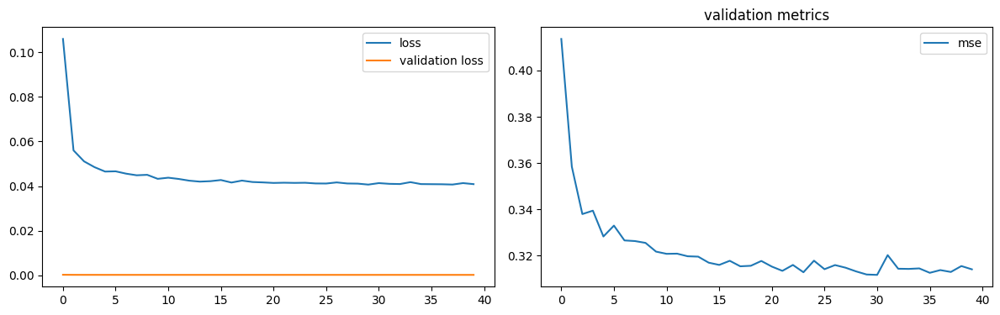

num of dropped: 45
Test: loss: 0.3039962649345398, avg metrics: (0.30166658759117126,)
dropping feature: (10, 'neuron21')


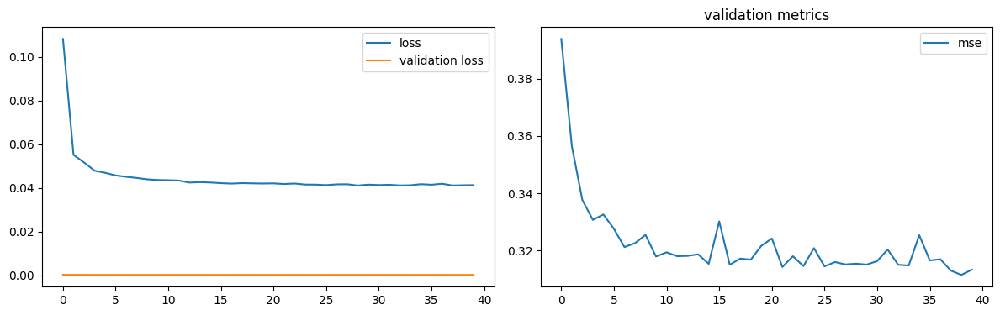

num of dropped: 46
Test: loss: 0.30083805322647095, avg metrics: (0.30144441723823545,)
dropping feature: (9, 'neuron19')


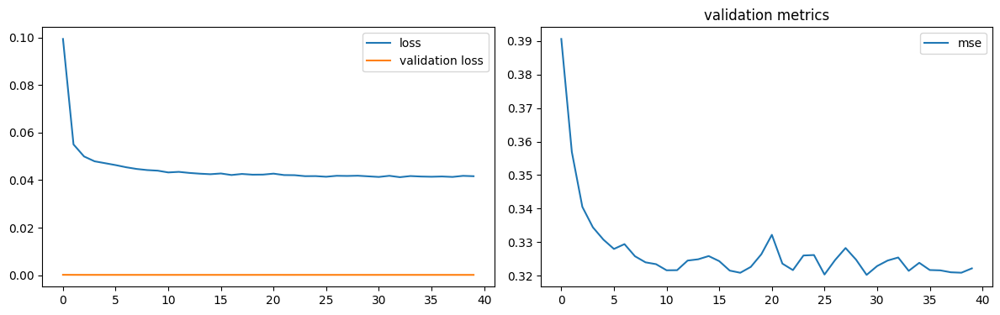

num of dropped: 47
Test: loss: 0.30817916989326477, avg metrics: (0.3093061506748199,)
dropping feature: (7, 'neuron17')


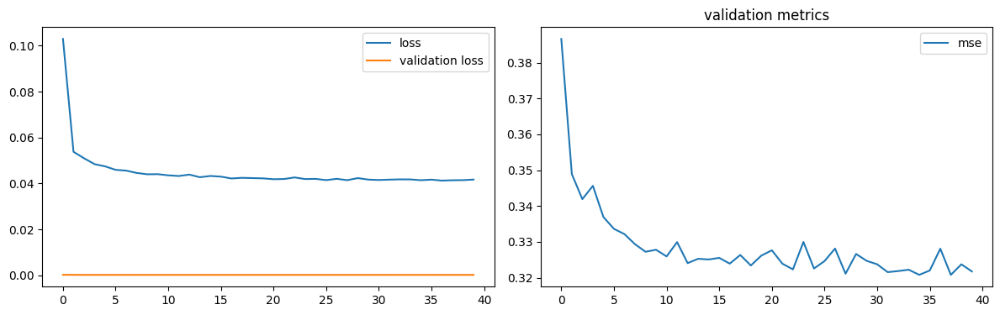

num of dropped: 48
Test: loss: 0.3113841116428375, avg metrics: (0.3154056489467621,)
dropping feature: (6, 'neuron15')


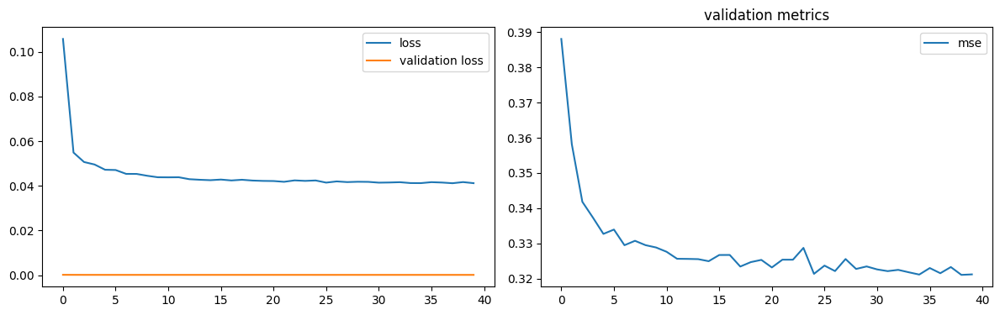

num of dropped: 49
Test: loss: 0.30703210830688477, avg metrics: (0.3099556028842926,)
dropping feature: (1, 'neuron1')


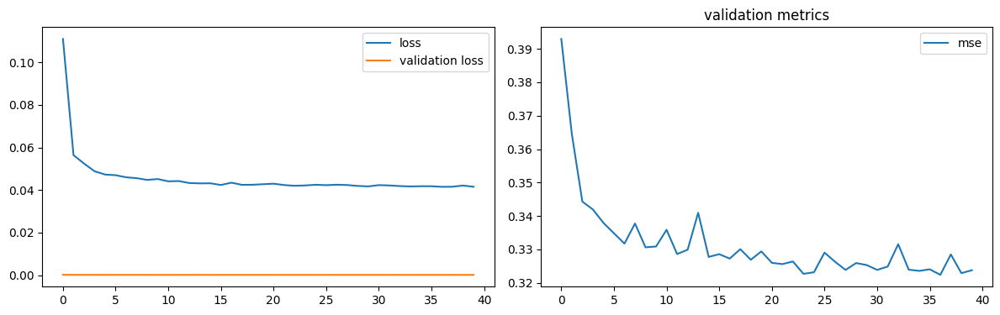

num of dropped: 50
Test: loss: 0.3137827515602112, avg metrics: (0.31225210428237915,)
dropping feature: (6, 'neuron23')


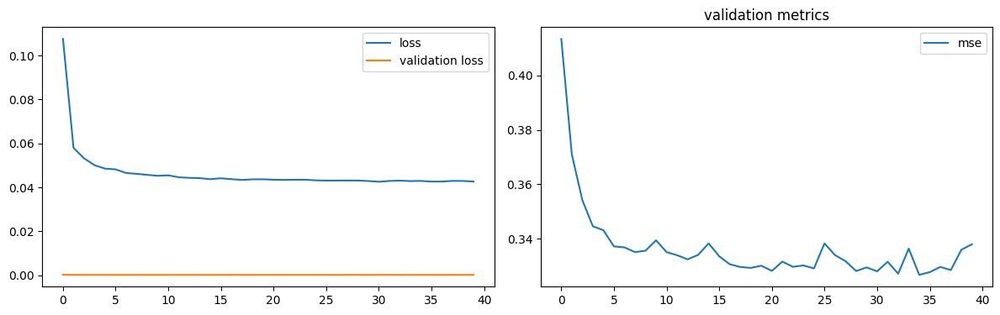

num of dropped: 51
Test: loss: 0.3253993093967438, avg metrics: (0.31808828711509707,)
dropping feature: (11, 'neuron38')


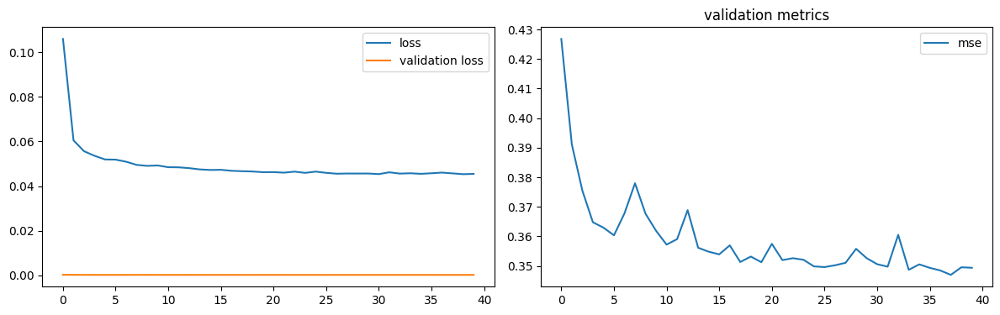

num of dropped: 52
Test: loss: 0.3414817750453949, avg metrics: (0.3407875657081604,)
dropping feature: (10, 'neuron36')


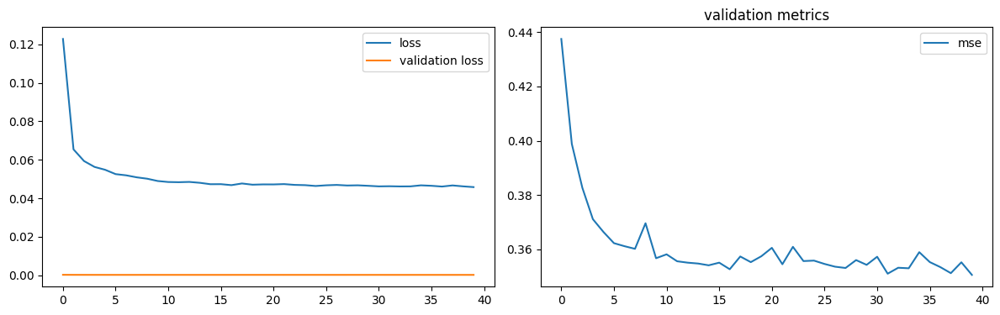

num of dropped: 53
Test: loss: 0.3420923948287964, avg metrics: (0.342413330078125,)
dropping feature: (0, 'neuron0')


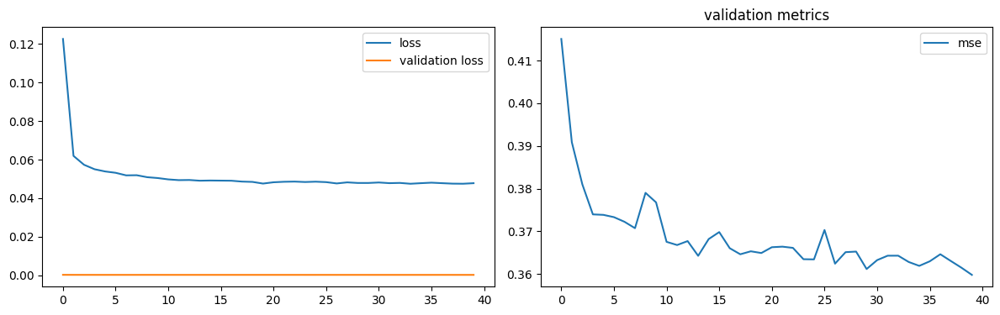

num of dropped: 54
Test: loss: 0.35770323872566223, avg metrics: (0.3581704914569855,)
dropping feature: (2, 'neuron12')


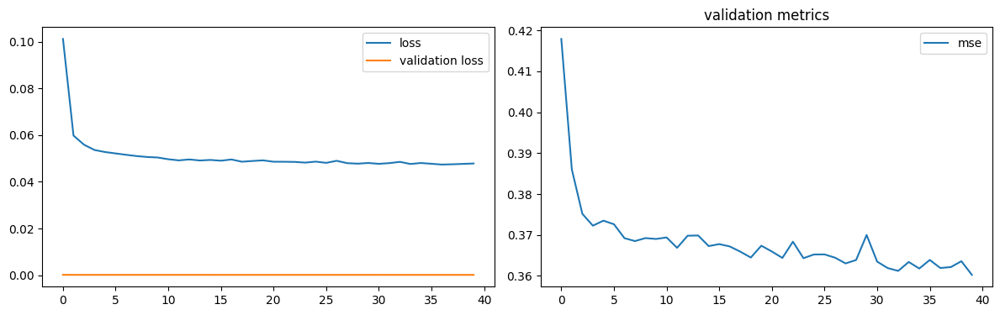

num of dropped: 55
Test: loss: 0.35884901881217957, avg metrics: (0.3609340012073517,)
dropping feature: (3, 'neuron18')


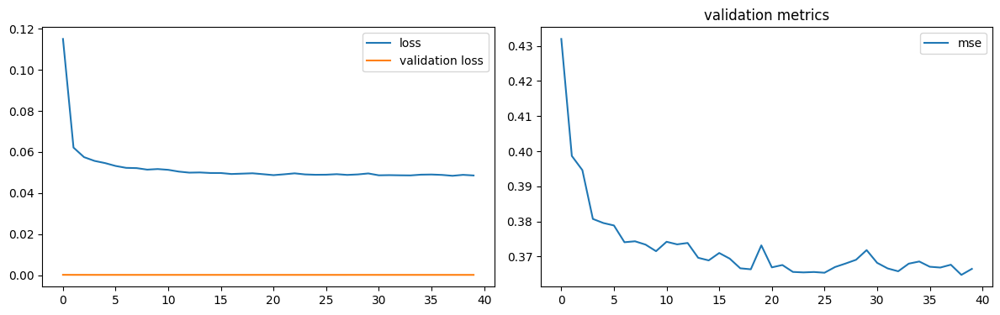

num of dropped: 56
Test: loss: 0.36281856894493103, avg metrics: (0.36320701241493225,)
dropping feature: (5, 'neuron33')


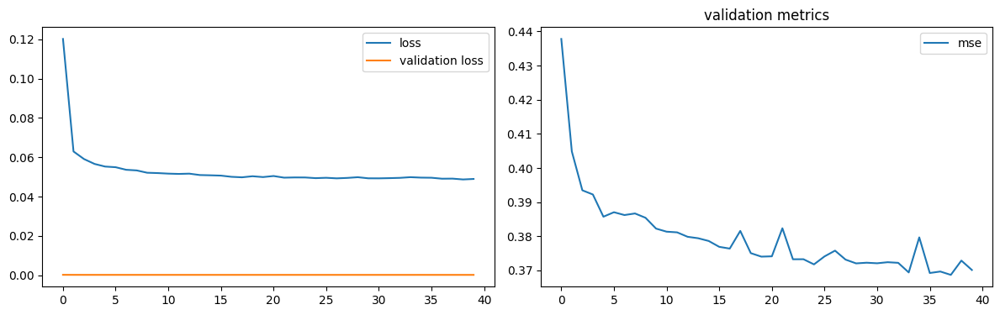

num of dropped: 57
Test: loss: 0.3697044551372528, avg metrics: (0.37255156636238096,)
dropping feature: (3, 'neuron24')


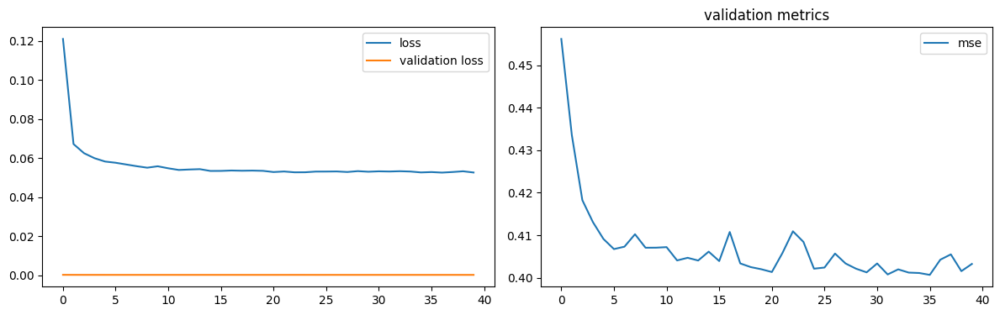

num of dropped: 58
Test: loss: 0.3991994261741638, avg metrics: (0.3994985342025757,)
dropping feature: (1, 'neuron7')


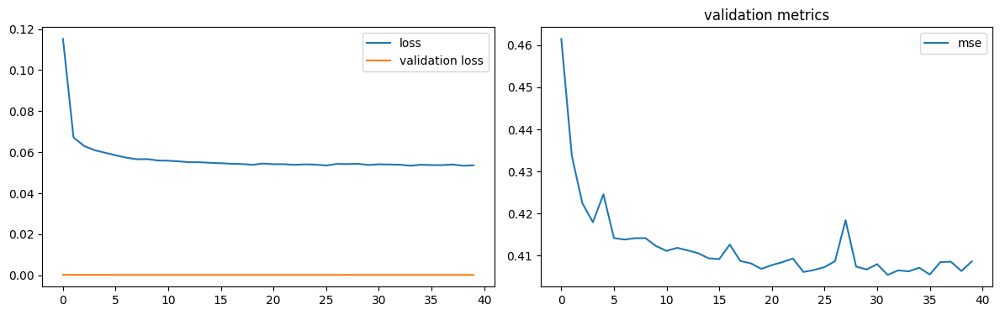

num of dropped: 59
Test: loss: 0.4049980342388153, avg metrics: (0.4028241455554962,)
dropping feature: (3, 'neuron35')


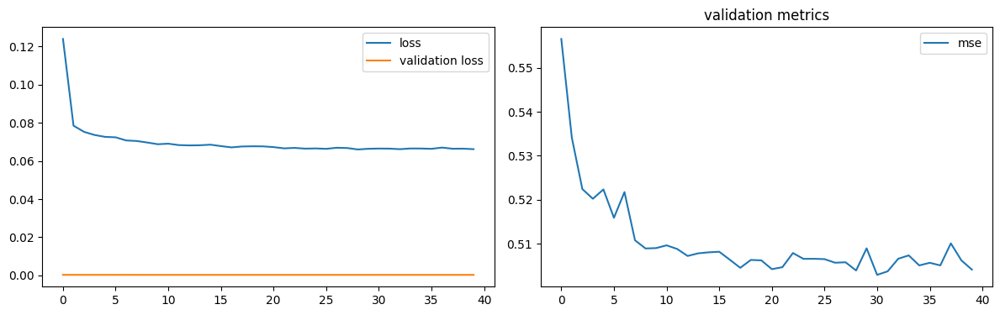

num of dropped: 60
Test: loss: 0.4968300759792328, avg metrics: (0.49973838329315184,)
dropping feature: (2, 'neuron31')


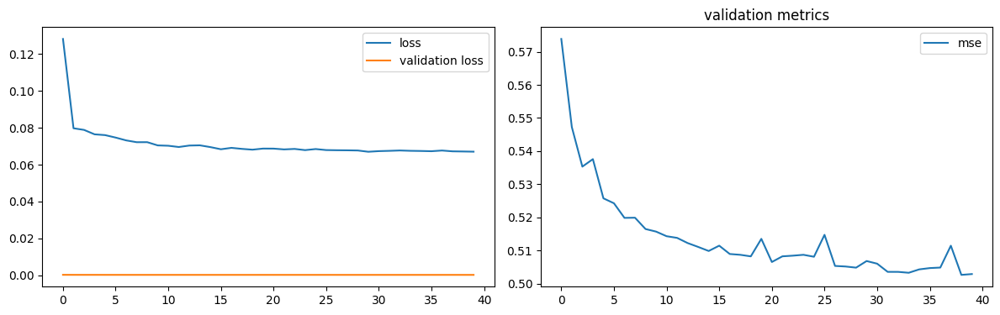

num of dropped: 61
Test: loss: 0.4960968792438507, avg metrics: (0.49819556474685667,)
dropping feature: (2, 'neuron56')


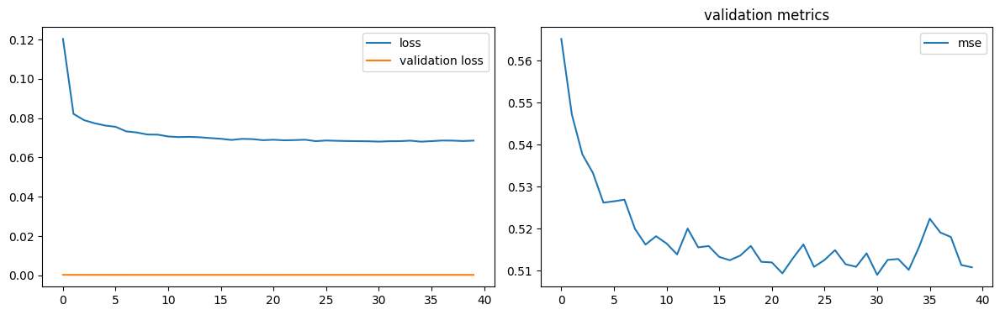

num of dropped: 62
Test: loss: 0.5023331046104431, avg metrics: (0.5029097676277161,)
dropping feature: (0, 'neuron6')


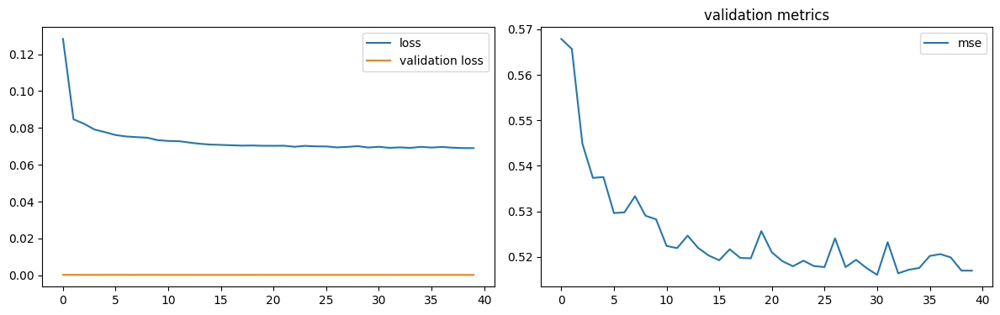

num of dropped: 63
Test: loss: 0.5163387060165405, avg metrics: (0.5233230829238892,)


In [15]:
torch.manual_seed(2024)

headers = [f"neuron{i}" for i in range(64)]


def model_factory(size):
    model = CaliforniaNN(1, (size, 64))
    model.layer1 = nn.Identity()
    return model


test_metrics, dropped, models = prune(
    datasets, headers, analyze_dgsm,
    model_factory, optimizer_factory, criterion, score_outputs, 40,
    labels, "", None
)

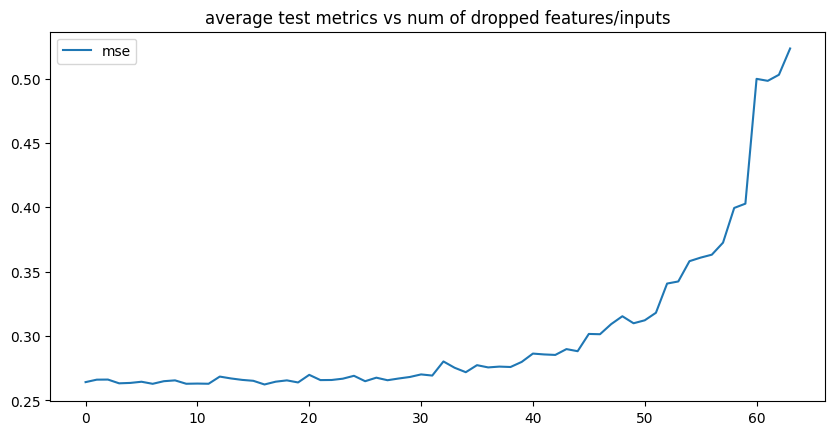

In [16]:
plot_dropping_metrics(test_metrics, labels)

In [17]:
num_drop_neurons = 25

save_models("california", "dgsm-layer2", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_neurons)
layer = models[num_drop_neurons].layer2

best_model.layer2 = layer
best_model.layer1[0] = reduce_linear(best_model.layer1[0], dropped, num_drop_neurons)

features left [39]:  ['neuron0', 'neuron1', 'neuron4', 'neuron5', 'neuron6', 'neuron7', 'neuron8', 'neuron9', 'neuron12', 'neuron13', 'neuron14', 'neuron15', 'neuron16', 'neuron17', 'neuron18', 'neuron19', 'neuron20', 'neuron21', 'neuron23', 'neuron24', 'neuron25', 'neuron26', 'neuron27', 'neuron29', 'neuron31', 'neuron33', 'neuron35', 'neuron36', 'neuron37', 'neuron38', 'neuron40', 'neuron42', 'neuron46', 'neuron54', 'neuron56', 'neuron57', 'neuron58', 'neuron61', 'neuron63']


### 2nd hidden layer

In [18]:
layer.eval()

datasets = {
    key: TensorDataset(
        layer(dataset.tensors[0]).detach(),
        dataset.tensors[1]
    )
    for key, dataset in reduced_datasets.items()
}

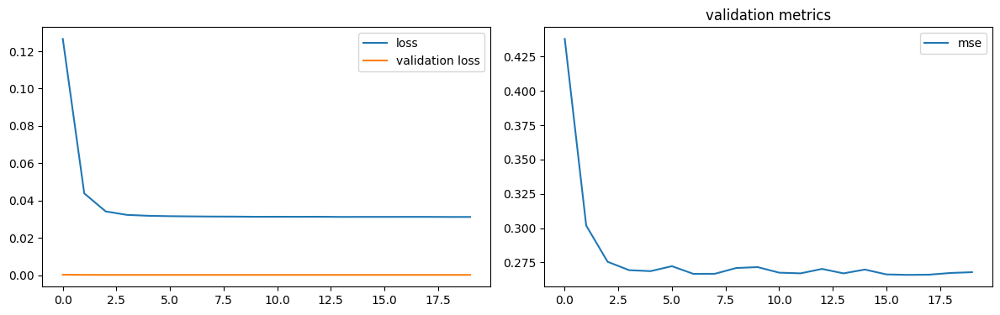

num of dropped: 0
Test: loss: 0.2604873478412628, avg metrics: (0.26066477298736573,)
dropping feature: (49, 'neuron49')


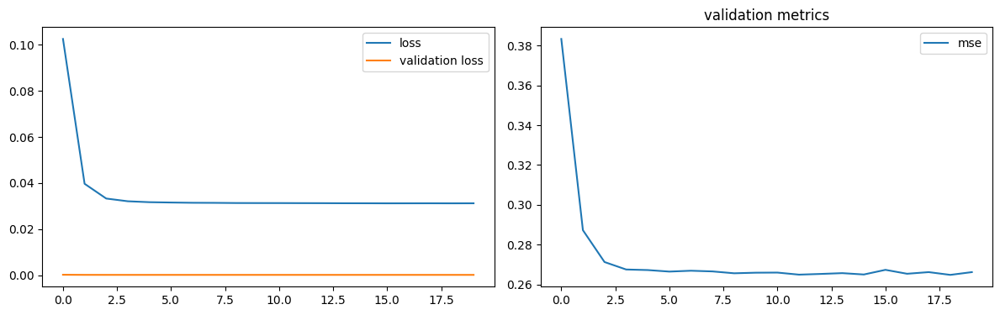

num of dropped: 1
Test: loss: 0.26010021567344666, avg metrics: (0.26070916652679443,)
dropping feature: (46, 'neuron46')


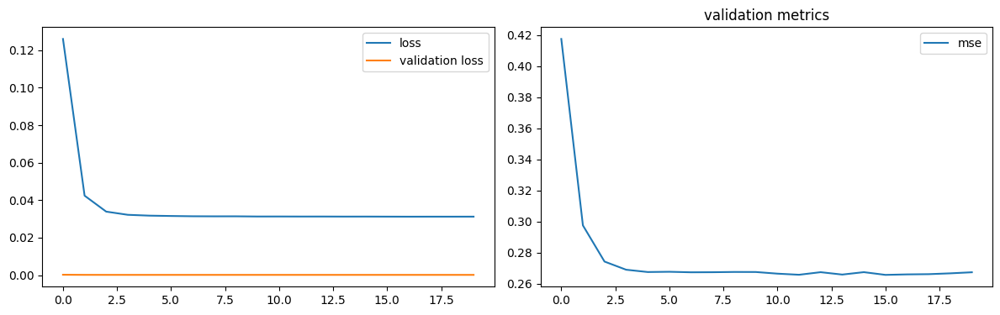

num of dropped: 2
Test: loss: 0.2611555755138397, avg metrics: (0.2607528388500214,)
dropping feature: (0, 'neuron0')


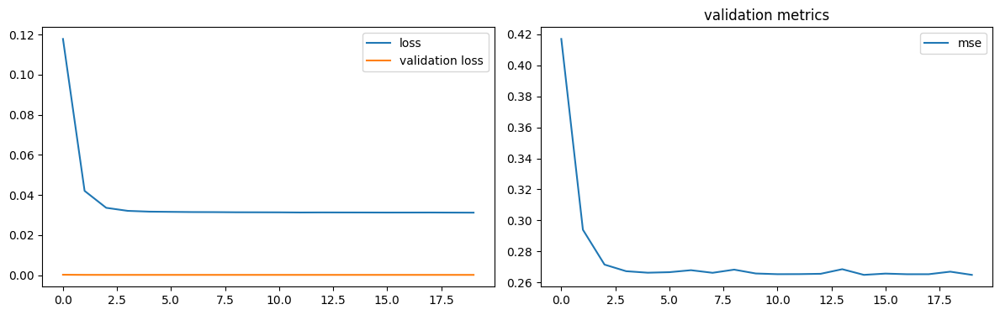

num of dropped: 3
Test: loss: 0.2596873641014099, avg metrics: (0.2602047801017761,)
dropping feature: (2, 'neuron3')


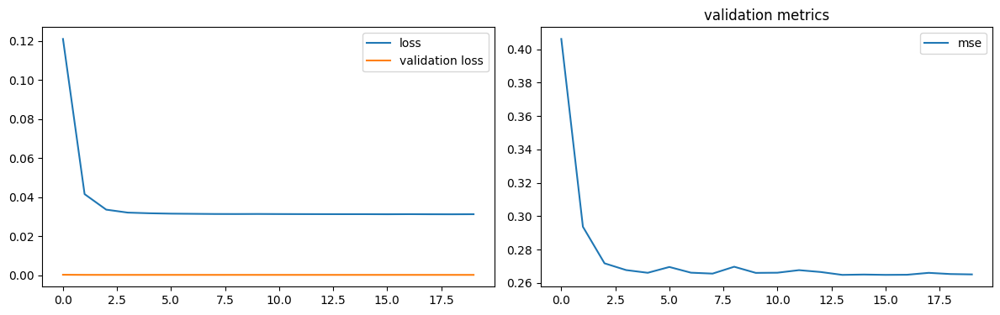

num of dropped: 4
Test: loss: 0.2597726285457611, avg metrics: (0.2599291980266571,)
dropping feature: (33, 'neuron35')


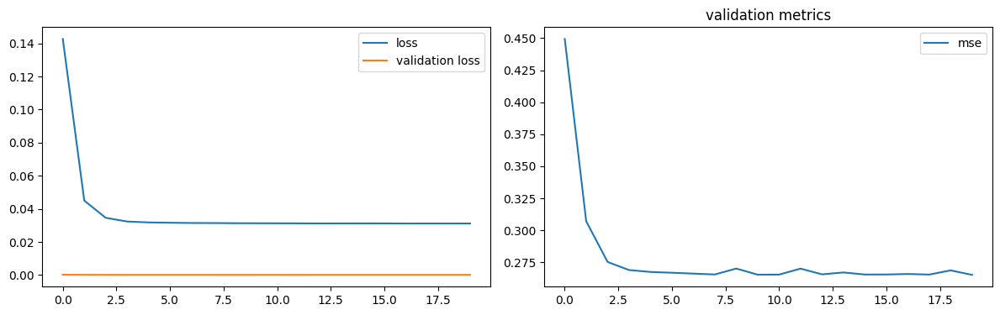

num of dropped: 5
Test: loss: 0.25999322533607483, avg metrics: (0.2602668166160583,)
dropping feature: (8, 'neuron10')


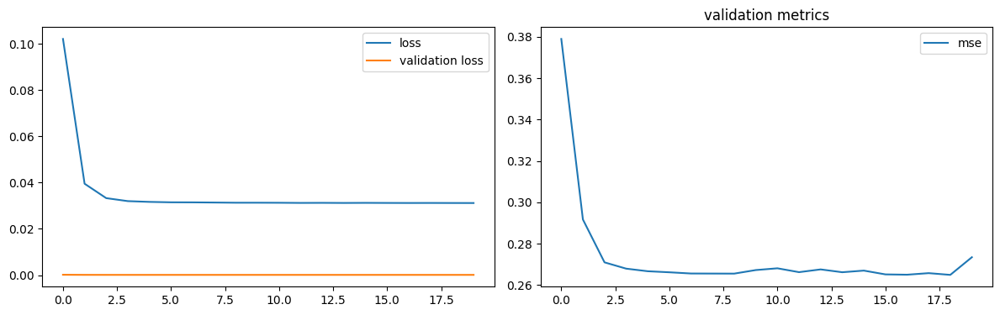

num of dropped: 6
Test: loss: 0.26571932435035706, avg metrics: (0.26161821484565734,)
dropping feature: (29, 'neuron32')


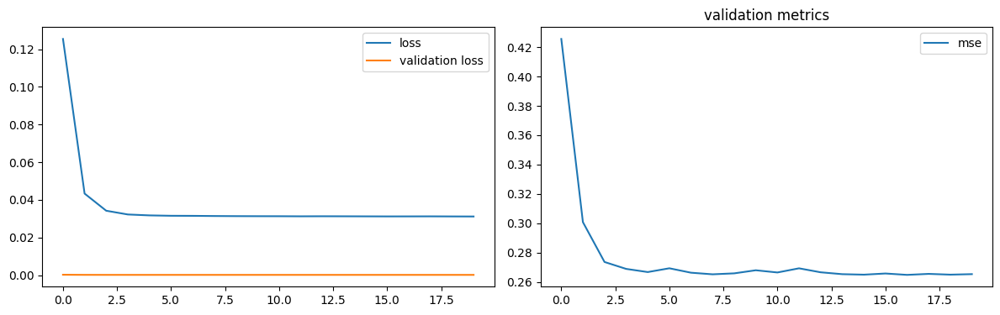

num of dropped: 7
Test: loss: 0.2594769299030304, avg metrics: (0.2599669754505157,)
dropping feature: (5, 'neuron7')


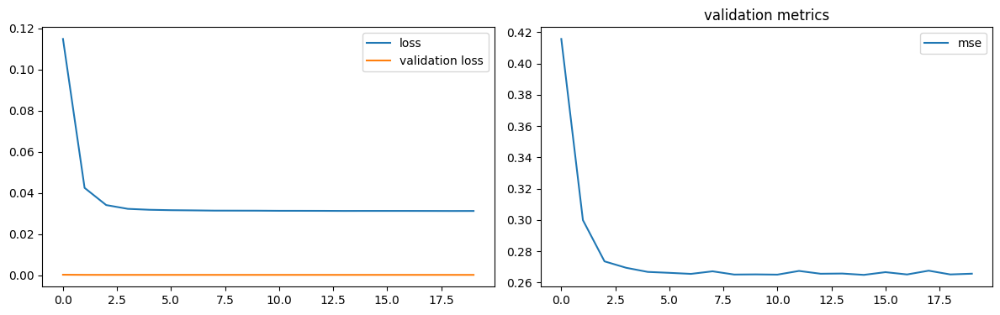

num of dropped: 8
Test: loss: 0.259904682636261, avg metrics: (0.26027895212173463,)
dropping feature: (13, 'neuron17')


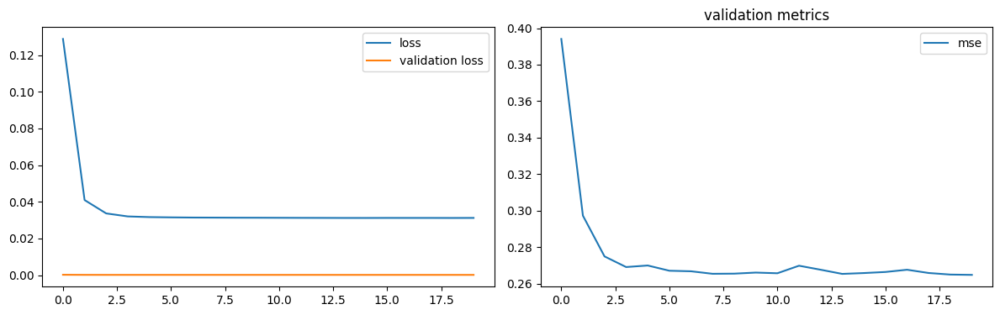

num of dropped: 9
Test: loss: 0.25991809368133545, avg metrics: (0.2605631768703461,)
dropping feature: (17, 'neuron22')


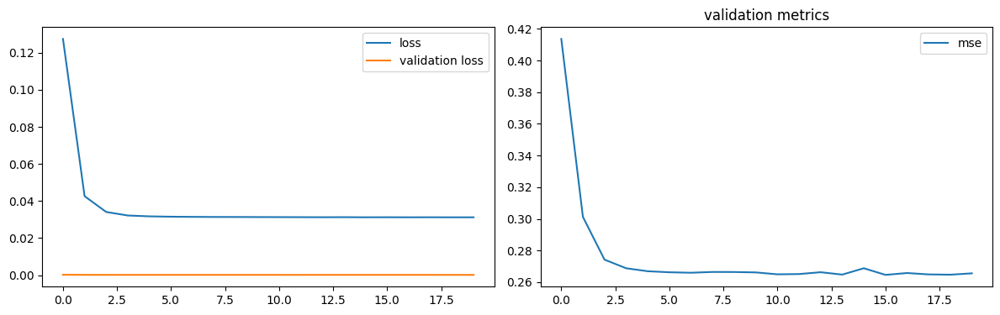

num of dropped: 10
Test: loss: 0.2601655423641205, avg metrics: (0.26061033010482787,)
dropping feature: (53, 'neuron63')


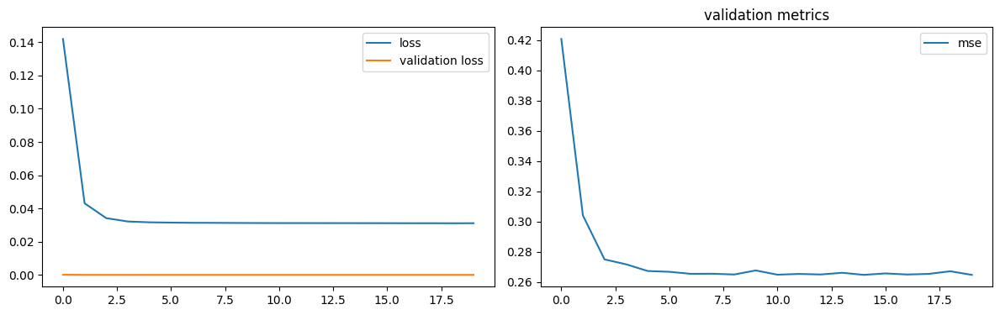

num of dropped: 11
Test: loss: 0.2606101334095001, avg metrics: (0.26133238673210146,)
dropping feature: (35, 'neuron43')


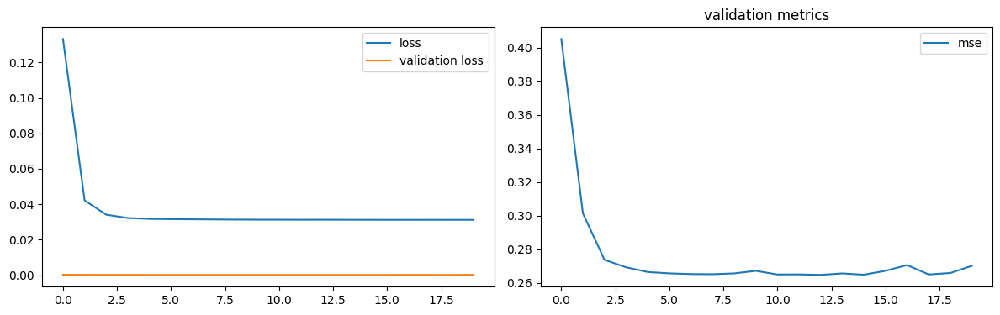

num of dropped: 12
Test: loss: 0.2627749443054199, avg metrics: (0.2615808367729187,)
dropping feature: (34, 'neuron42')


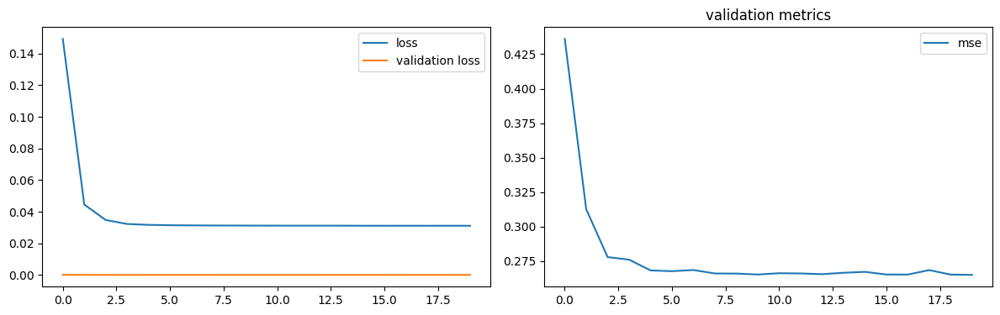

num of dropped: 13
Test: loss: 0.2601796090602875, avg metrics: (0.26059256196022035,)
dropping feature: (42, 'neuron54')


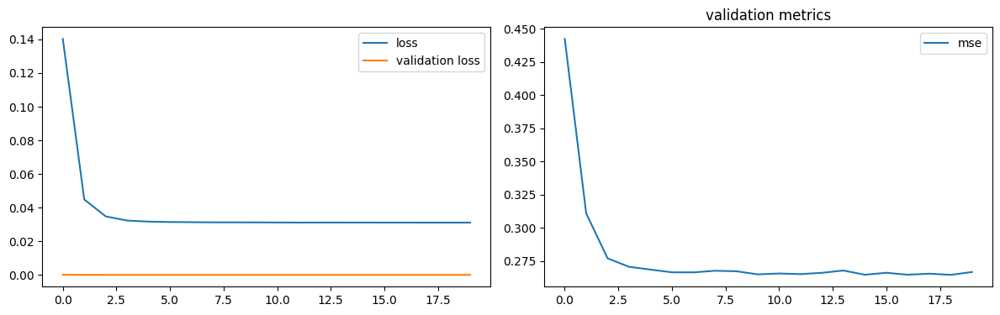

num of dropped: 14
Test: loss: 0.260220468044281, avg metrics: (0.26017677783966064,)
dropping feature: (24, 'neuron30')


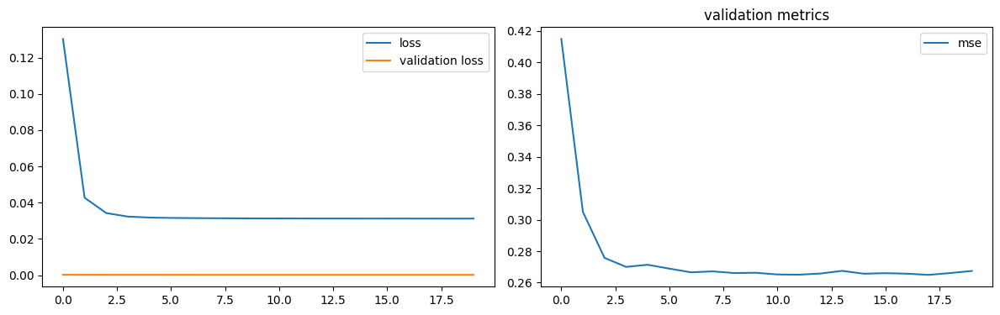

num of dropped: 15
Test: loss: 0.2608313262462616, avg metrics: (0.26037670373916627,)
dropping feature: (18, 'neuron24')


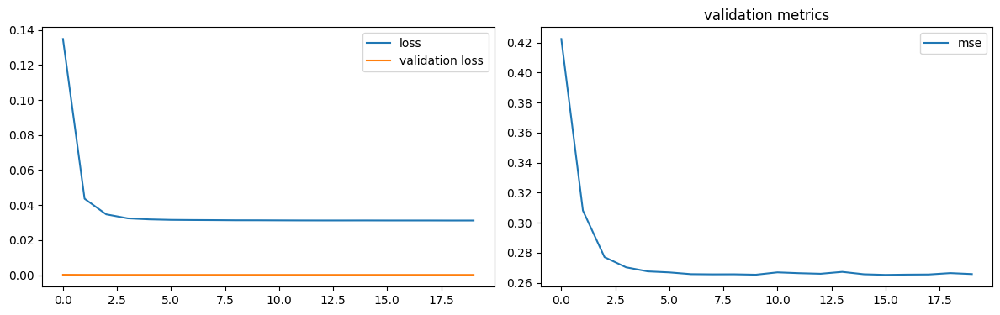

num of dropped: 16
Test: loss: 0.26043662428855896, avg metrics: (0.26039351224899293,)
dropping feature: (37, 'neuron51')


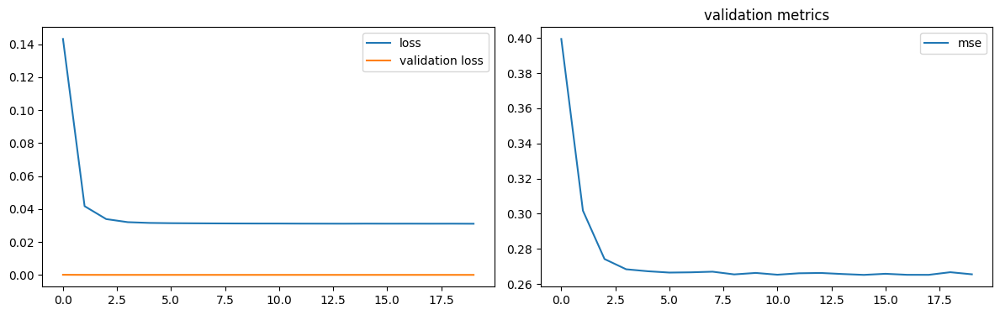

num of dropped: 17
Test: loss: 0.2611103057861328, avg metrics: (0.26039817929267883,)
dropping feature: (44, 'neuron60')


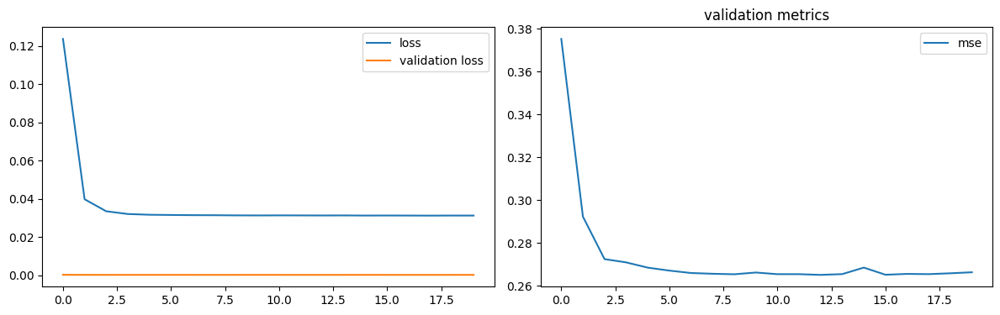

num of dropped: 18
Test: loss: 0.26016250252723694, avg metrics: (0.26005126237869264,)
dropping feature: (35, 'neuron48')


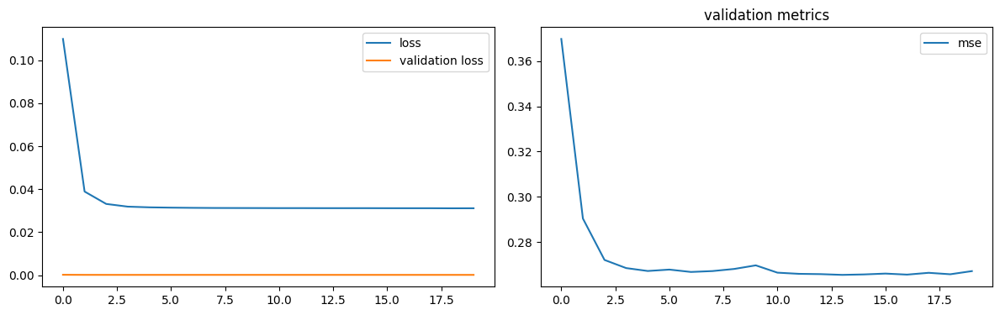

num of dropped: 19
Test: loss: 0.2602352797985077, avg metrics: (0.25985819697380064,)
dropping feature: (16, 'neuron21')


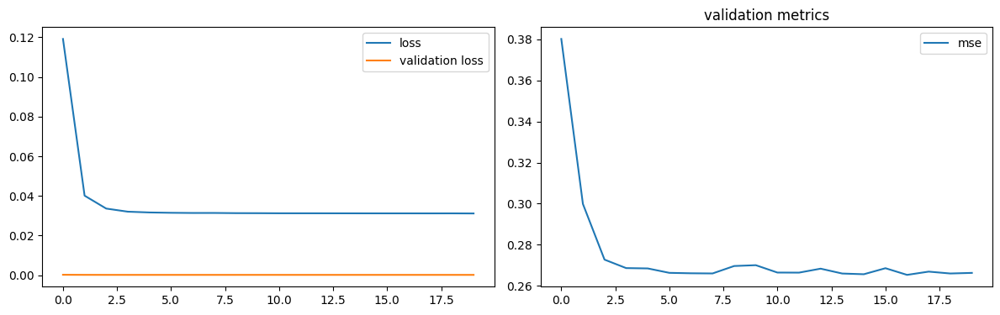

num of dropped: 20
Test: loss: 0.2596915662288666, avg metrics: (0.2600241780281067,)
dropping feature: (11, 'neuron15')


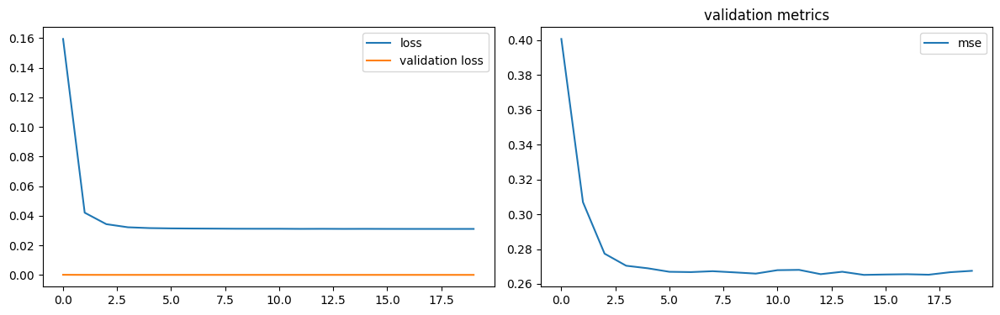

num of dropped: 21
Test: loss: 0.26065006852149963, avg metrics: (0.26016515493392944,)
dropping feature: (8, 'neuron12')


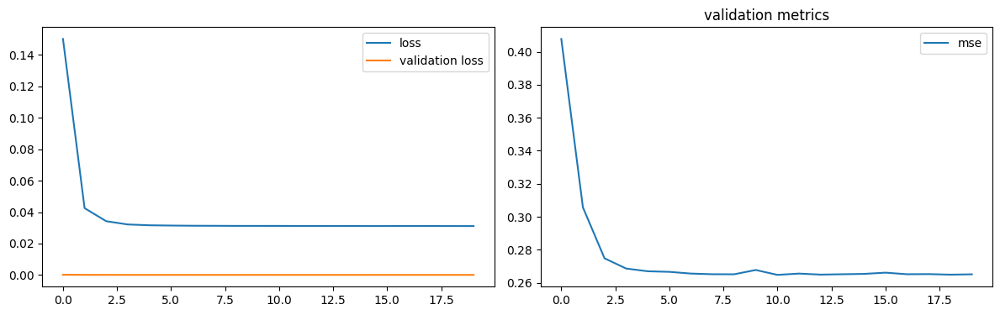

num of dropped: 22
Test: loss: 0.2606425881385803, avg metrics: (0.2608370840549469,)
dropping feature: (23, 'neuron36')


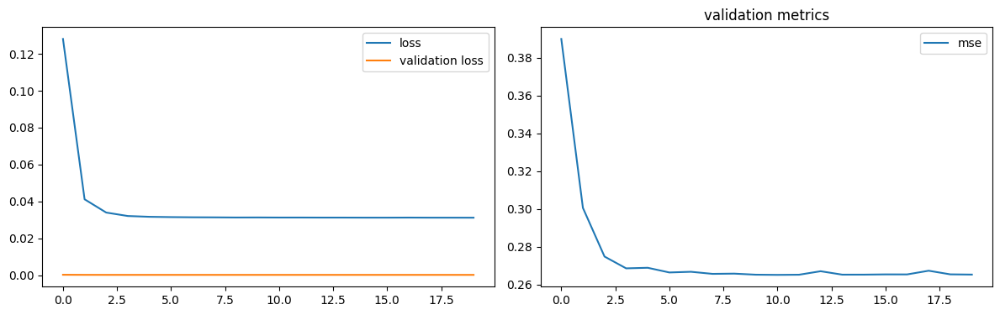

num of dropped: 23
Test: loss: 0.2605475187301636, avg metrics: (0.2603482484817505,)
dropping feature: (15, 'neuron25')


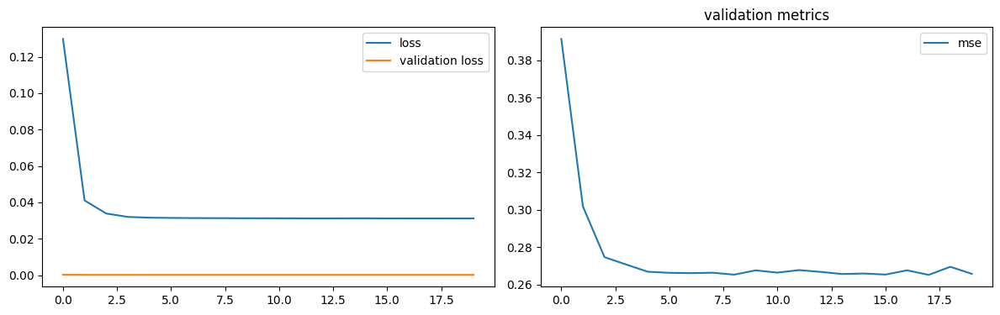

num of dropped: 24
Test: loss: 0.26173821091651917, avg metrics: (0.2604725301265717,)
dropping feature: (24, 'neuron39')


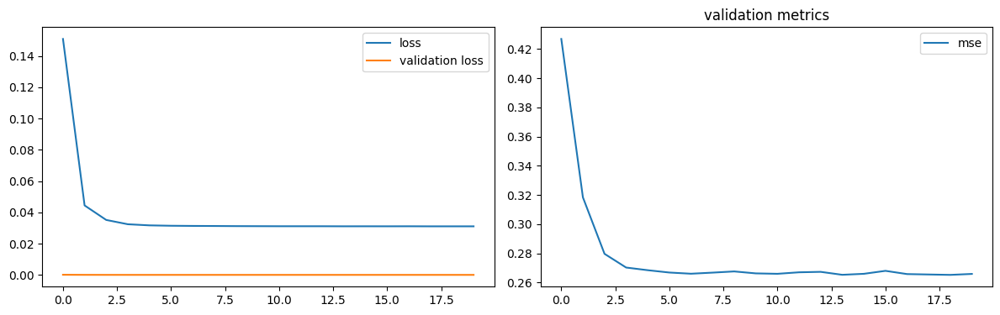

num of dropped: 25
Test: loss: 0.2605699300765991, avg metrics: (0.2605858087539673,)
dropping feature: (3, 'neuron5')


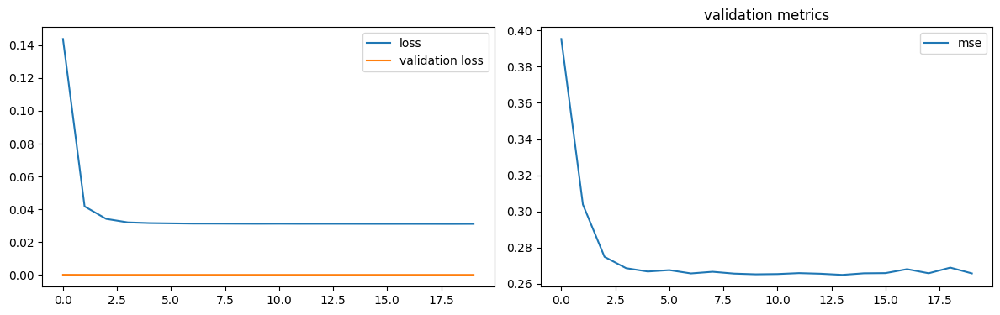

num of dropped: 26
Test: loss: 0.25974178314208984, avg metrics: (0.260093891620636,)
dropping feature: (30, 'neuron53')


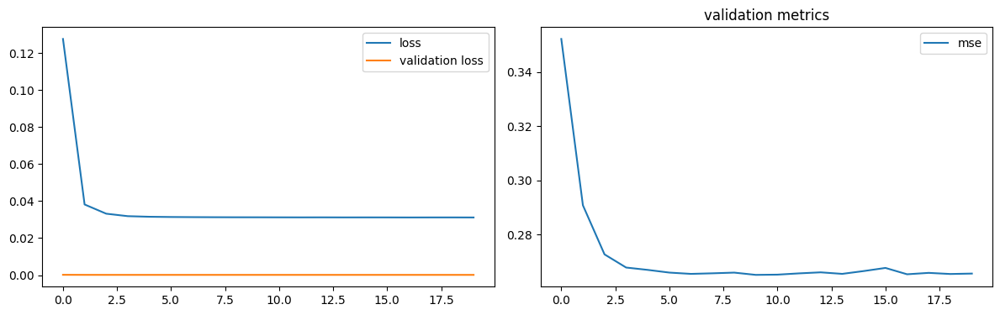

num of dropped: 27
Test: loss: 0.25985264778137207, avg metrics: (0.2600449681282043,)
dropping feature: (19, 'neuron33')


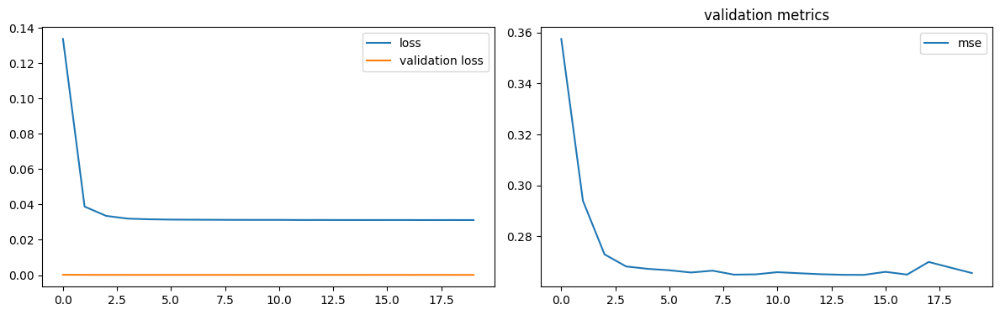

num of dropped: 28
Test: loss: 0.2604728043079376, avg metrics: (0.2605152428150177,)
dropping feature: (31, 'neuron57')


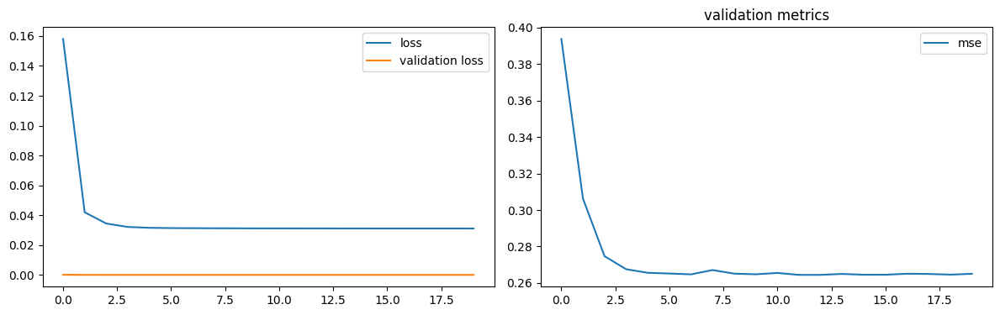

num of dropped: 29
Test: loss: 0.26154667139053345, avg metrics: (0.2606528639793396,)
dropping feature: (25, 'neuron45')


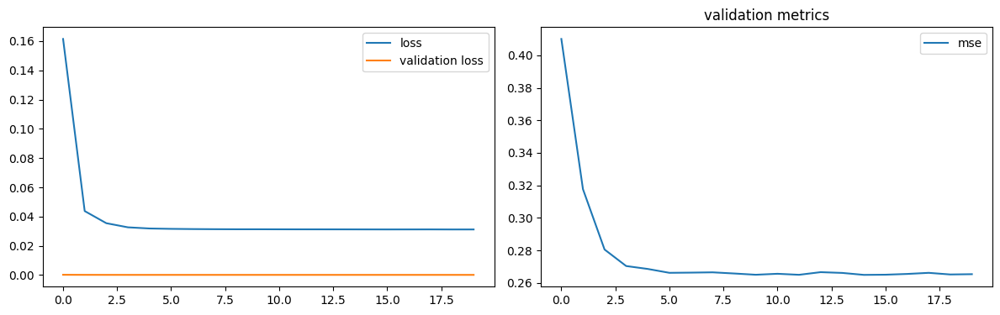

num of dropped: 30
Test: loss: 0.26080411672592163, avg metrics: (0.261074435710907,)
dropping feature: (23, 'neuron41')


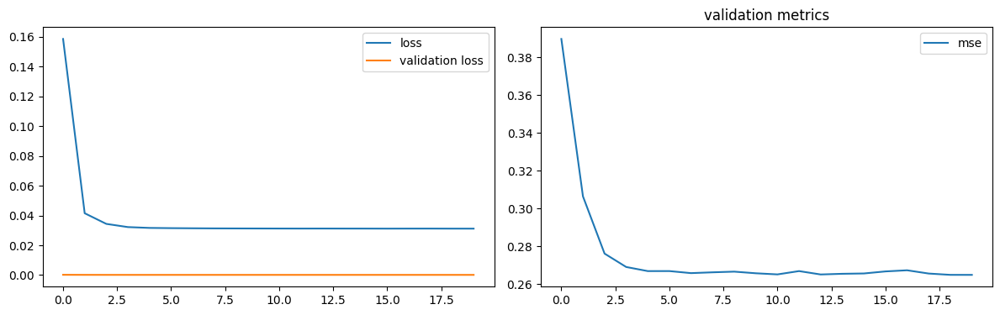

num of dropped: 31
Test: loss: 0.2610643804073334, avg metrics: (0.2609103977680206,)
dropping feature: (18, 'neuron31')


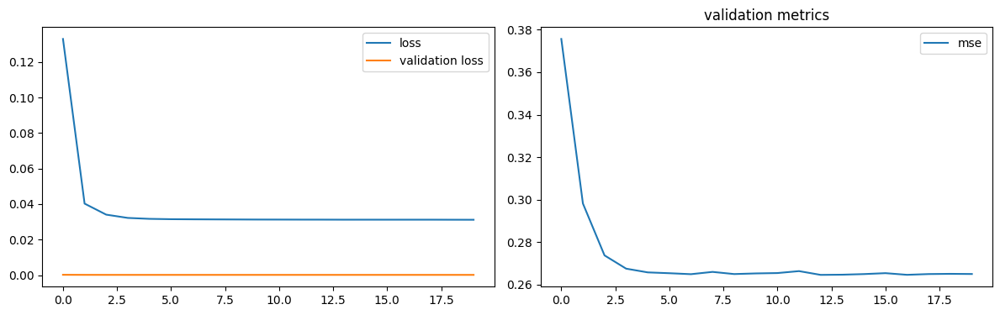

num of dropped: 32
Test: loss: 0.2606451213359833, avg metrics: (0.26101007461547854,)
dropping feature: (17, 'neuron29')


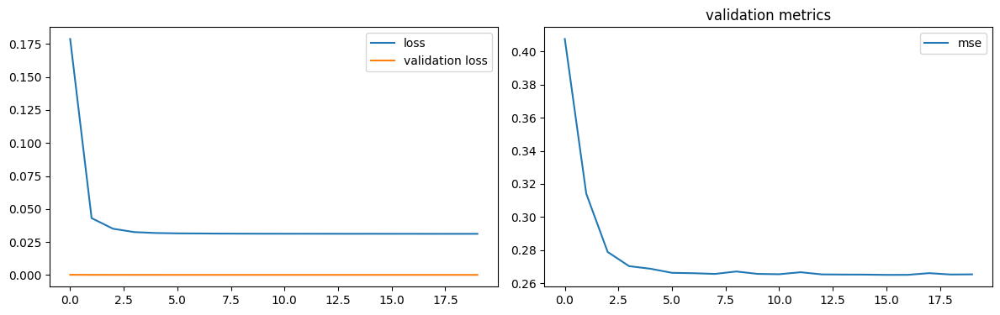

num of dropped: 33
Test: loss: 0.2608763575553894, avg metrics: (0.2610632717609406,)
dropping feature: (5, 'neuron9')


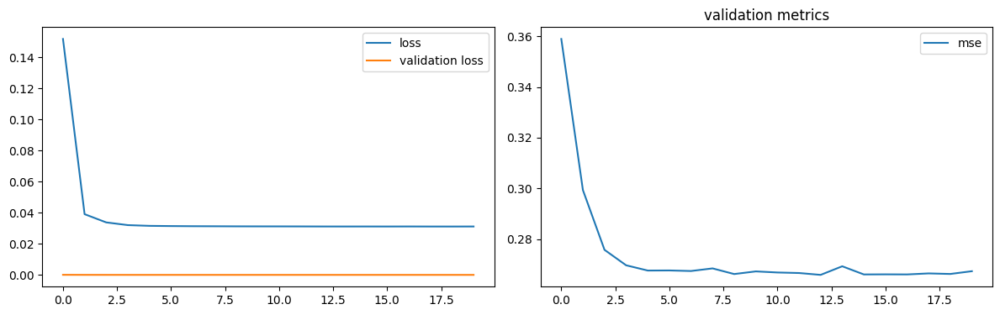

num of dropped: 34
Test: loss: 0.26182594895362854, avg metrics: (0.26164924502372744,)
dropping feature: (24, 'neuron55')


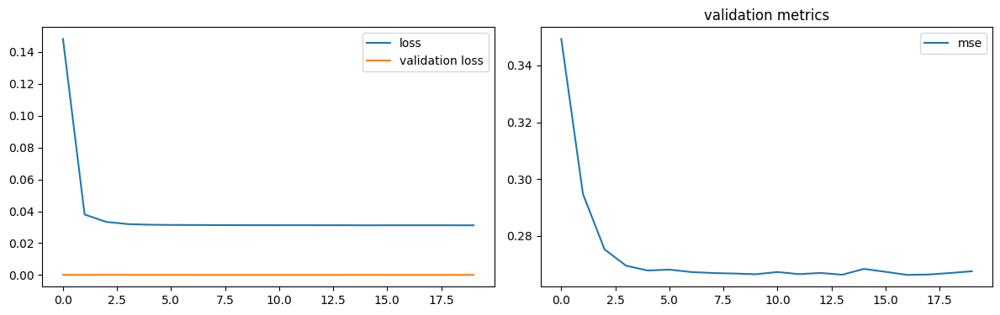

num of dropped: 35
Test: loss: 0.26163437962532043, avg metrics: (0.26164994239807127,)
dropping feature: (13, 'neuron26')


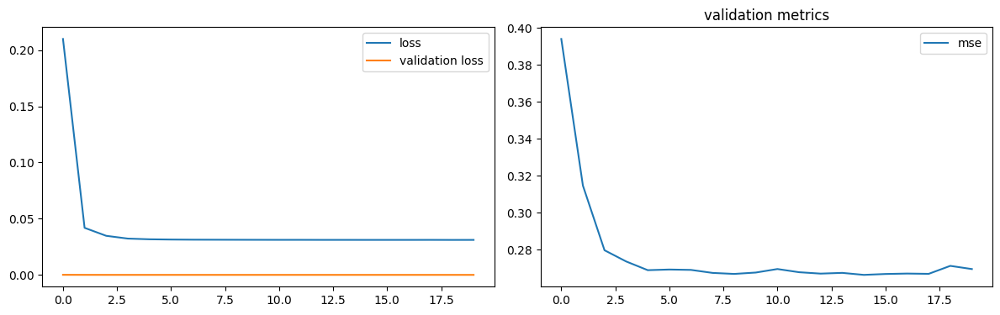

num of dropped: 36
Test: loss: 0.2627238631248474, avg metrics: (0.2619326114654541,)
dropping feature: (20, 'neuron47')


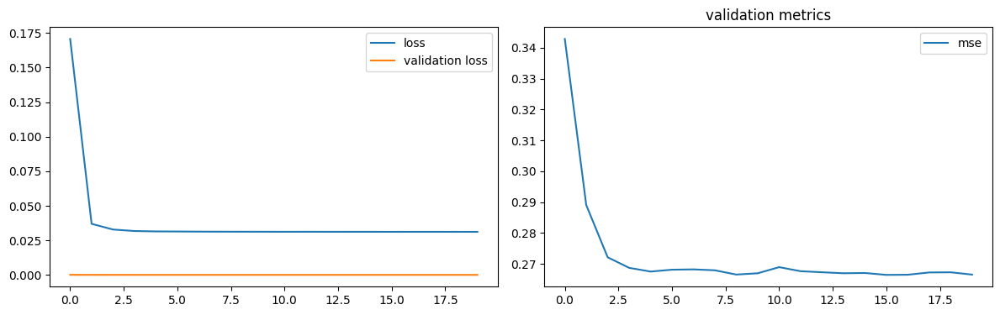

num of dropped: 37
Test: loss: 0.2615371644496918, avg metrics: (0.26199613213539125,)
dropping feature: (5, 'neuron11')


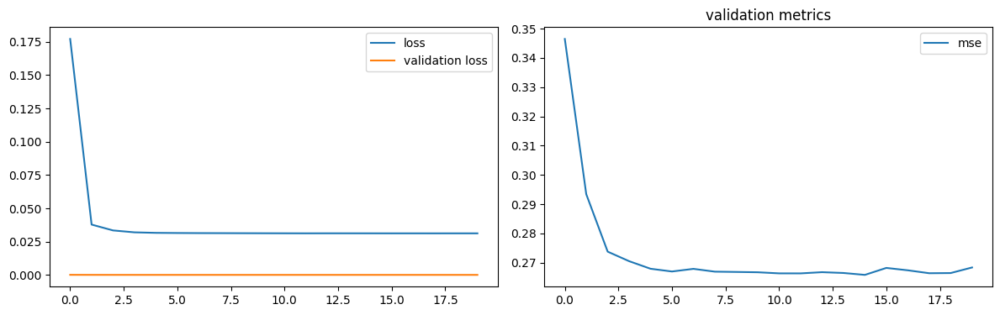

num of dropped: 38
Test: loss: 0.26245325803756714, avg metrics: (0.26191154718399046,)
dropping feature: (7, 'neuron16')


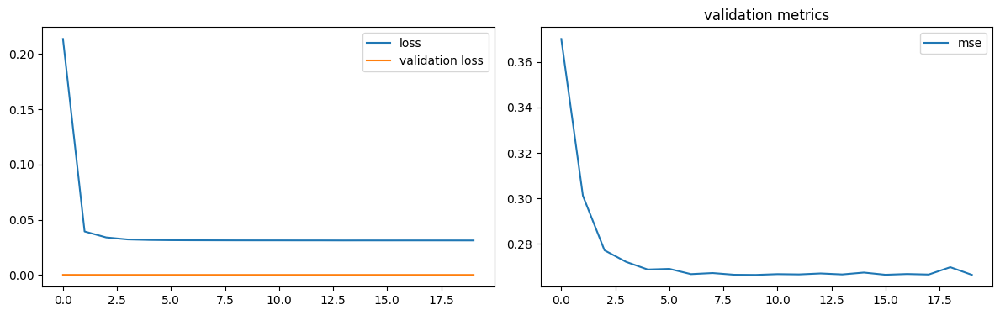

num of dropped: 39
Test: loss: 0.2615472376346588, avg metrics: (0.26190539002418517,)
dropping feature: (10, 'neuron23')


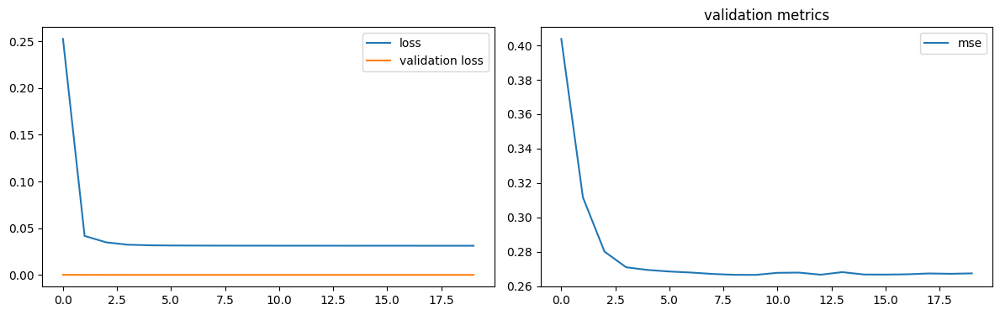

num of dropped: 40
Test: loss: 0.26173141598701477, avg metrics: (0.26167011857032774,)
dropping feature: (3, 'neuron6')


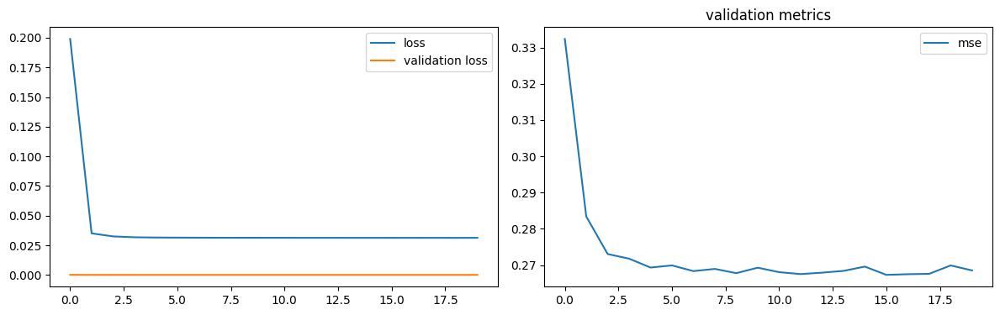

num of dropped: 41
Test: loss: 0.2622288465499878, avg metrics: (0.2622036874294281,)
dropping feature: (7, 'neuron19')


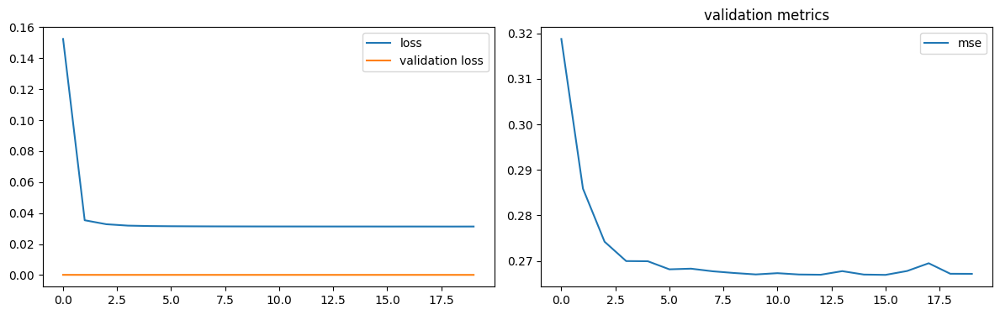

num of dropped: 42
Test: loss: 0.2615492641925812, avg metrics: (0.26211408376693723,)
dropping feature: (13, 'neuron40')


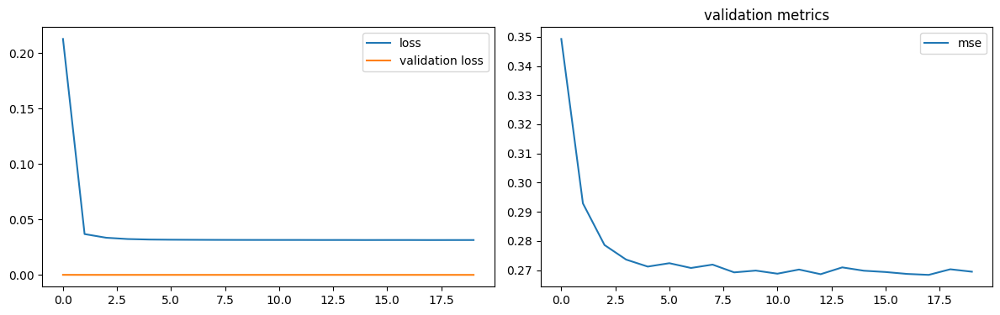

num of dropped: 43
Test: loss: 0.2635001540184021, avg metrics: (0.2634487211704254,)
dropping feature: (13, 'neuron44')


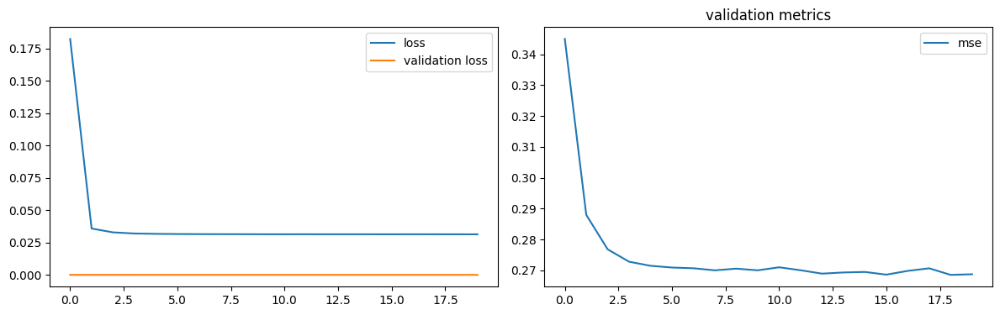

num of dropped: 44
Test: loss: 0.26344871520996094, avg metrics: (0.2634380400180817,)
dropping feature: (18, 'neuron61')


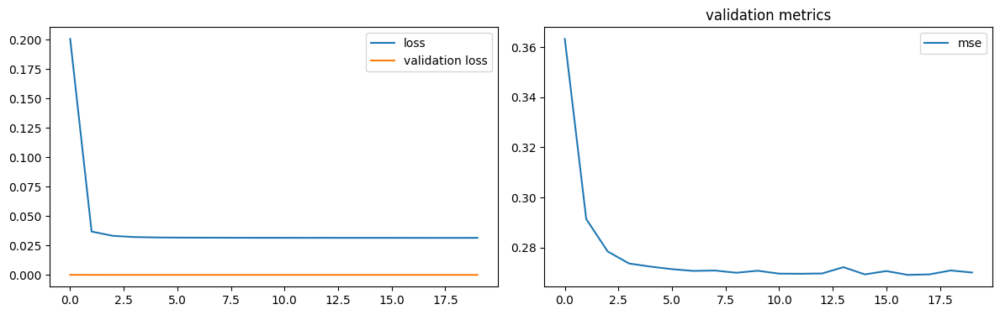

num of dropped: 45
Test: loss: 0.2639335095882416, avg metrics: (0.26398569345474243,)
dropping feature: (8, 'neuron27')


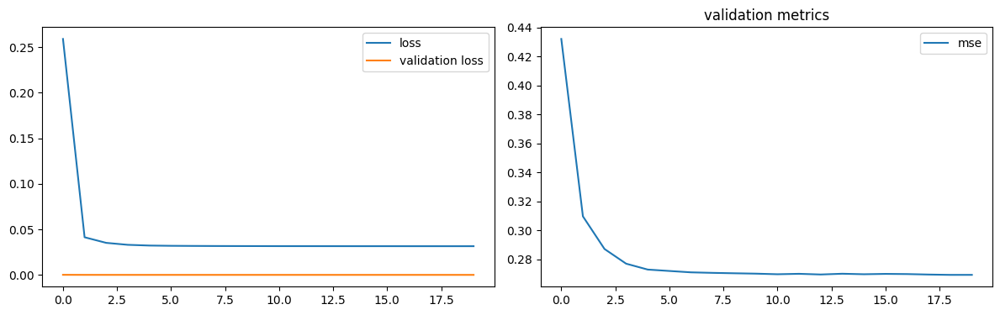

num of dropped: 46
Test: loss: 0.26375284790992737, avg metrics: (0.26389511227607726,)
dropping feature: (6, 'neuron18')


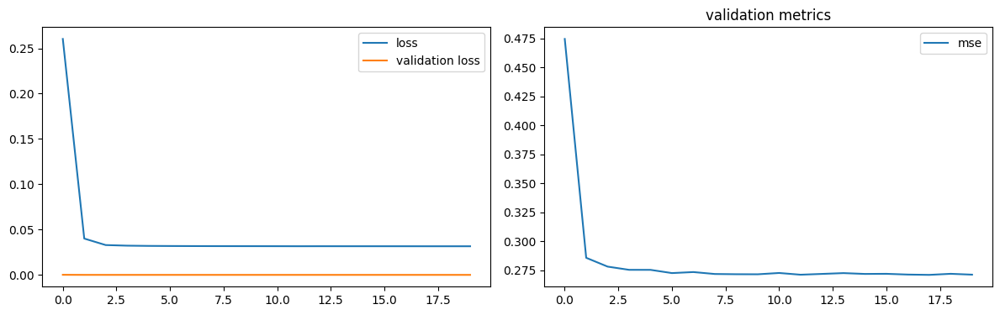

num of dropped: 47
Test: loss: 0.2657391428947449, avg metrics: (0.26549823880195617,)
dropping feature: (13, 'neuron56')


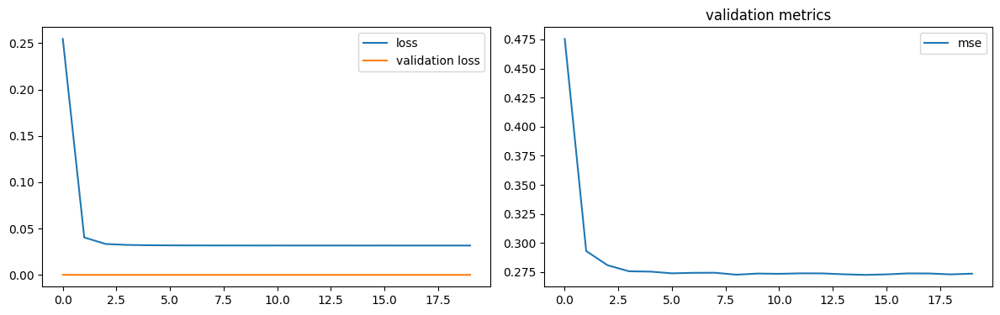

num of dropped: 48
Test: loss: 0.26682454347610474, avg metrics: (0.2667574942111969,)
dropping feature: (4, 'neuron13')


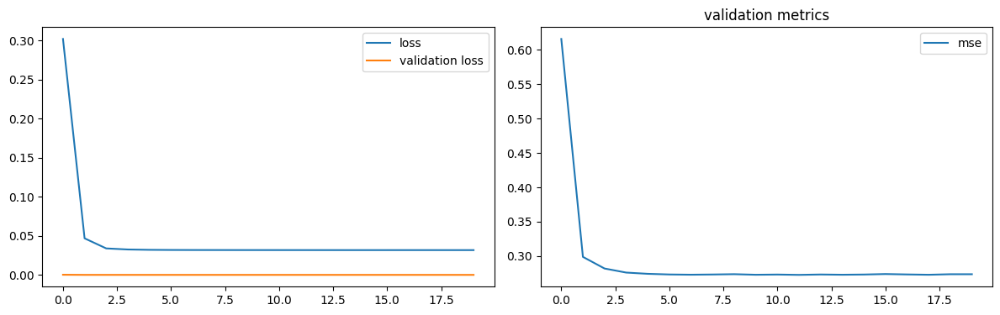

num of dropped: 49
Test: loss: 0.26599791646003723, avg metrics: (0.2663324773311615,)
dropping feature: (1, 'neuron2')


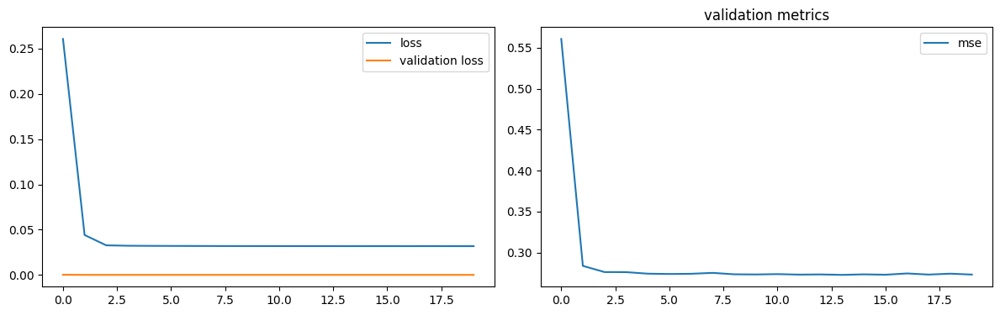

num of dropped: 50
Test: loss: 0.26648738980293274, avg metrics: (0.26636449098587034,)
dropping feature: (0, 'neuron1')


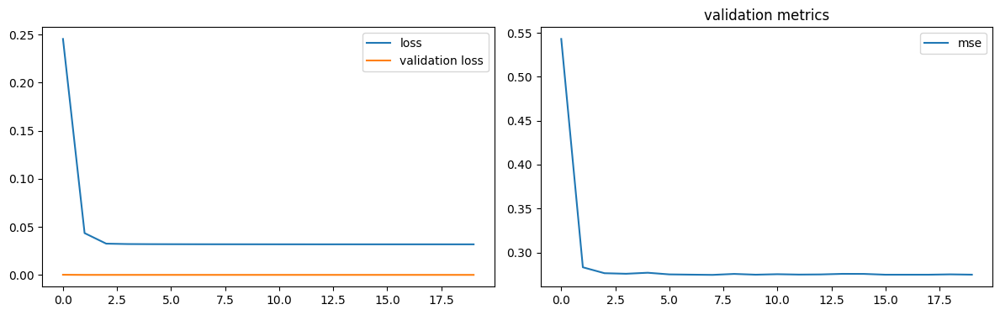

num of dropped: 51
Test: loss: 0.26851823925971985, avg metrics: (0.26860532760620115,)
dropping feature: (4, 'neuron28')


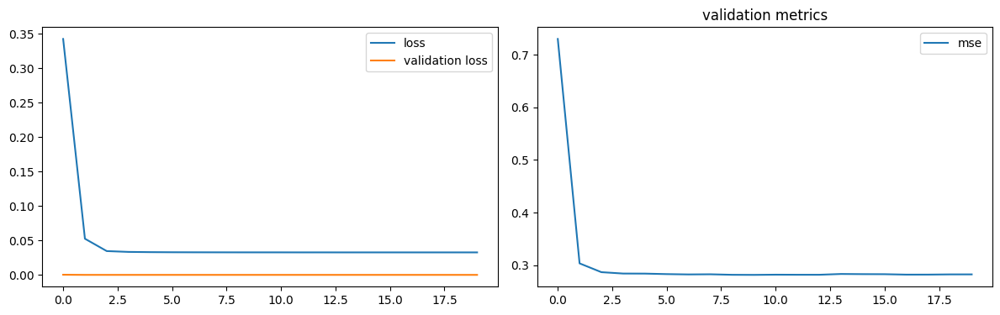

num of dropped: 52
Test: loss: 0.2733196020126343, avg metrics: (0.27329314947128297,)
dropping feature: (8, 'neuron52')


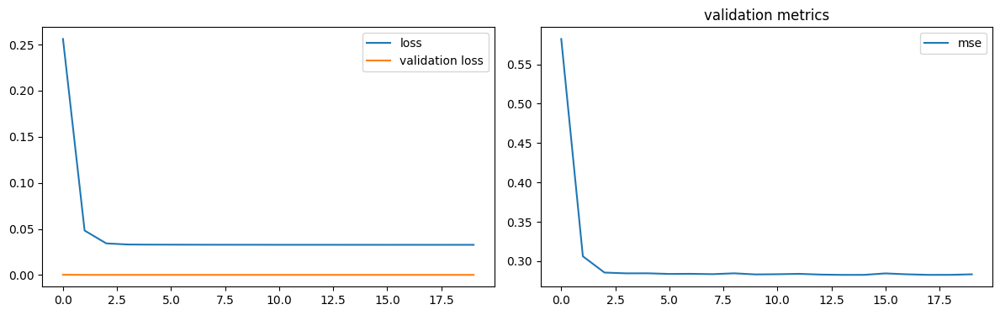

num of dropped: 53
Test: loss: 0.2733295261859894, avg metrics: (0.2734045207500458,)
dropping feature: (3, 'neuron20')


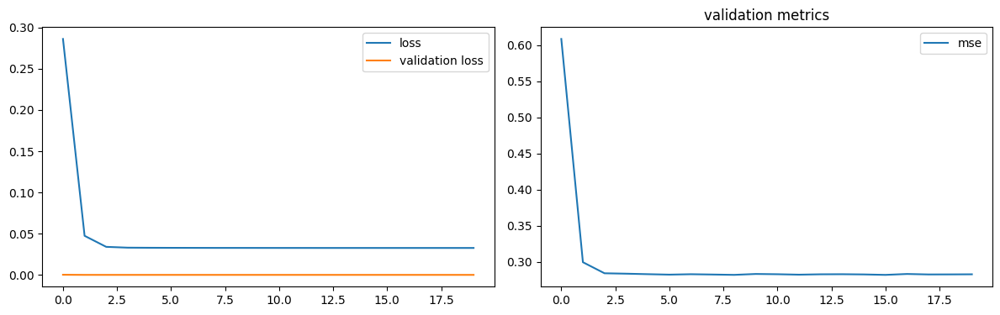

num of dropped: 54
Test: loss: 0.27322256565093994, avg metrics: (0.273401141166687,)
dropping feature: (5, 'neuron38')


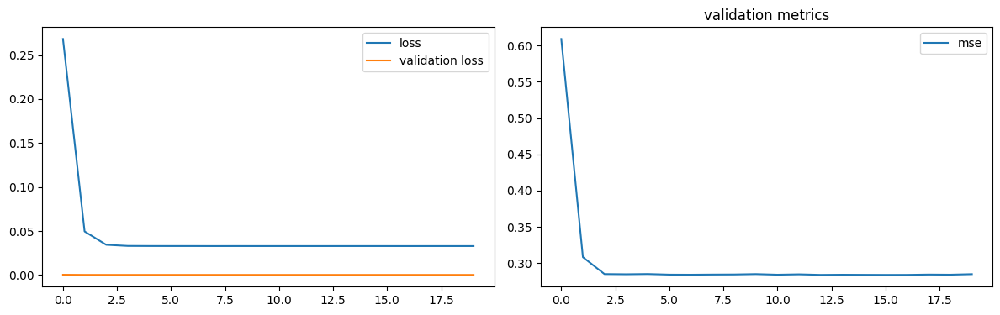

num of dropped: 55
Test: loss: 0.2744825780391693, avg metrics: (0.27430678606033326,)
dropping feature: (0, 'neuron4')


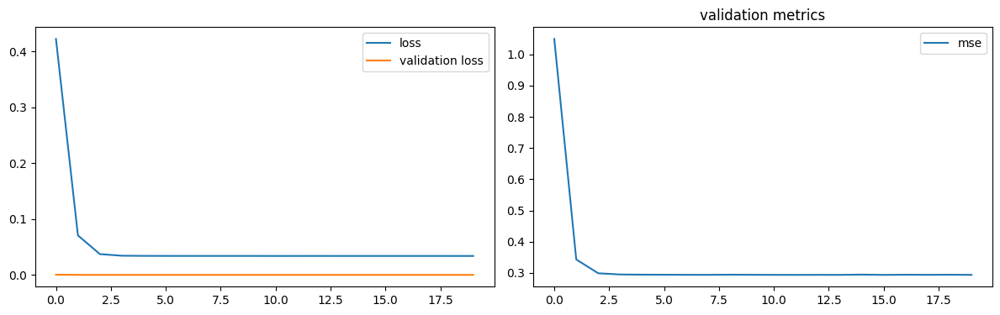

num of dropped: 56
Test: loss: 0.2811439633369446, avg metrics: (0.28102183938026426,)
dropping feature: (0, 'neuron8')


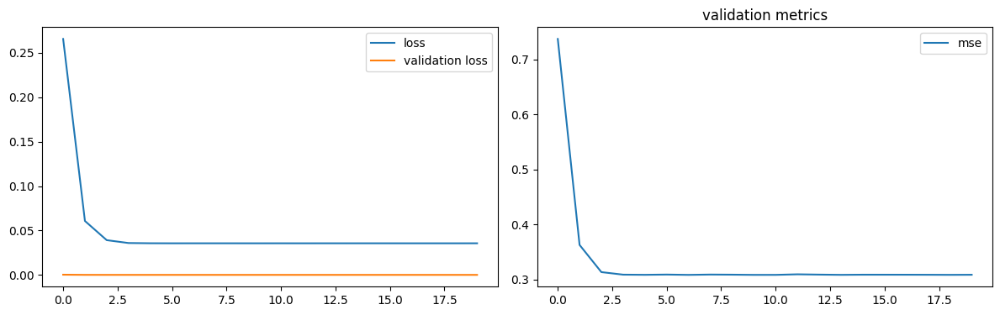

num of dropped: 57
Test: loss: 0.2957956790924072, avg metrics: (0.2959506392478943,)
dropping feature: (2, 'neuron37')


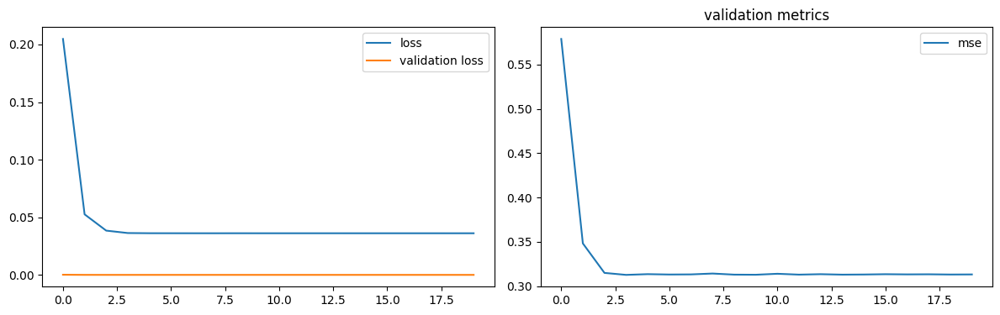

num of dropped: 58
Test: loss: 0.29935604333877563, avg metrics: (0.299412214756012,)
dropping feature: (1, 'neuron34')


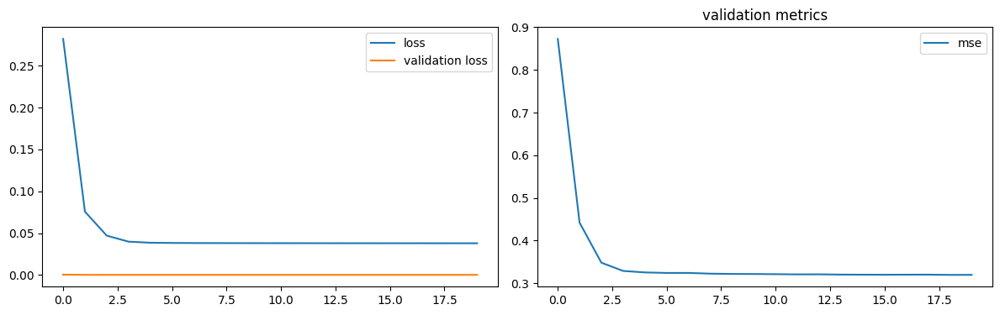

num of dropped: 59
Test: loss: 0.3087499737739563, avg metrics: (0.30848872661590576,)
dropping feature: (2, 'neuron58')


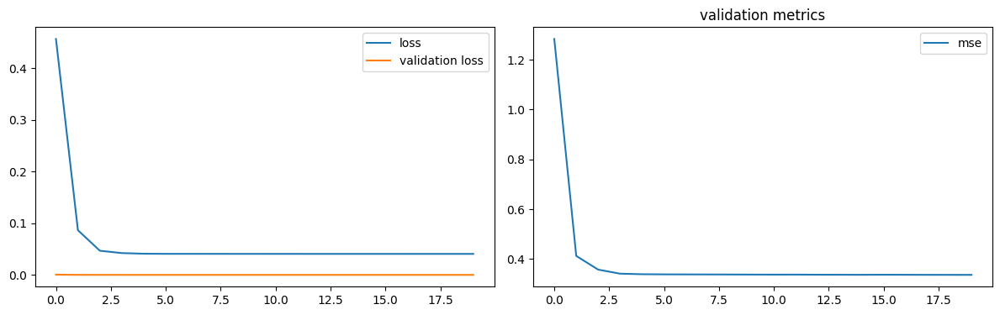

num of dropped: 60
Test: loss: 0.32771697640419006, avg metrics: (0.32803642749786377,)
dropping feature: (2, 'neuron59')


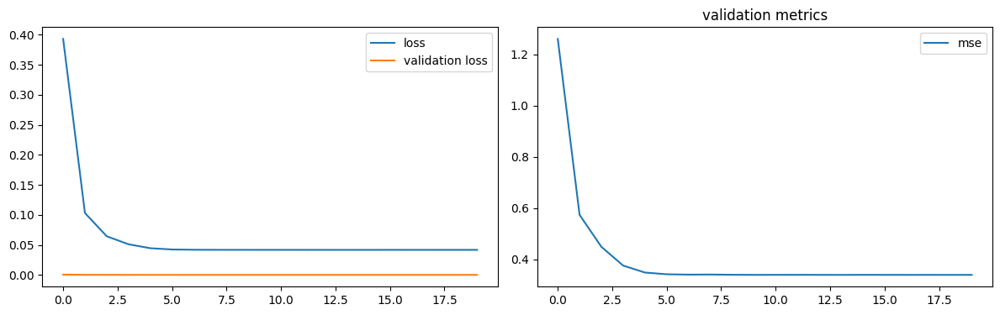

num of dropped: 61
Test: loss: 0.3312230408191681, avg metrics: (0.33149476647377013,)
dropping feature: (1, 'neuron50')


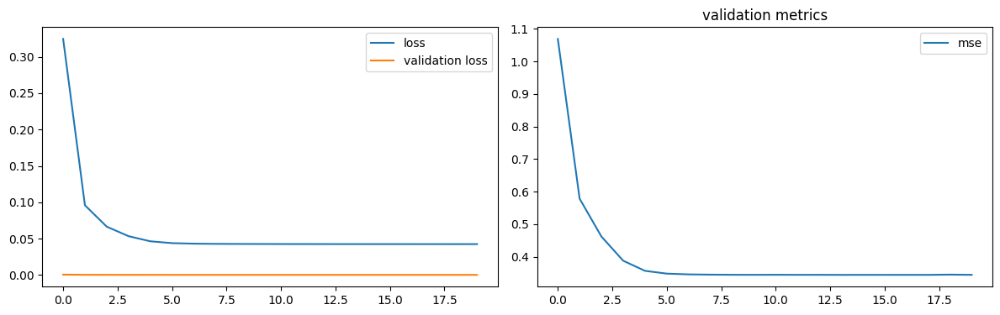

num of dropped: 62
Test: loss: 0.3359483480453491, avg metrics: (0.33592499494552613,)
dropping feature: (1, 'neuron62')


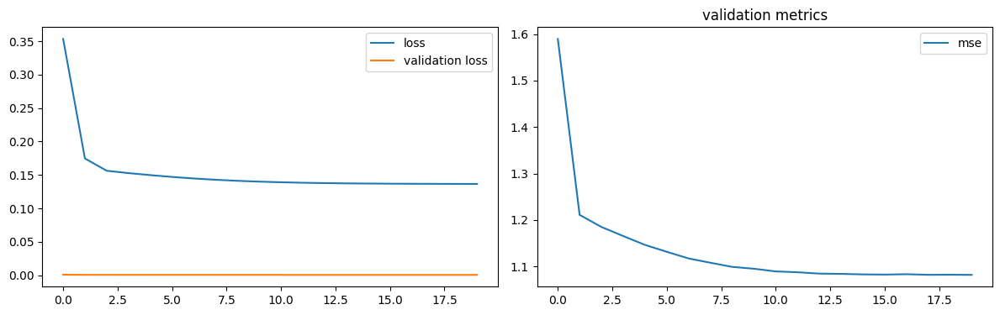

num of dropped: 63
Test: loss: 1.0571231842041016, avg metrics: (1.0578645467758179,)


In [19]:
torch.manual_seed(2024)

headers = [f"neuron{i}" for i in range(64)]


def model_factory(size):
    model = CaliforniaNN(1, (1, size))
    model.layer1 = nn.Identity()
    model.layer2 = nn.Identity()
    return model


test_metrics, dropped, models = prune(
    datasets, headers, analyze_dgsm,
    model_factory, optimizer_factory, criterion, score_outputs, 20,
    labels, "", None
)

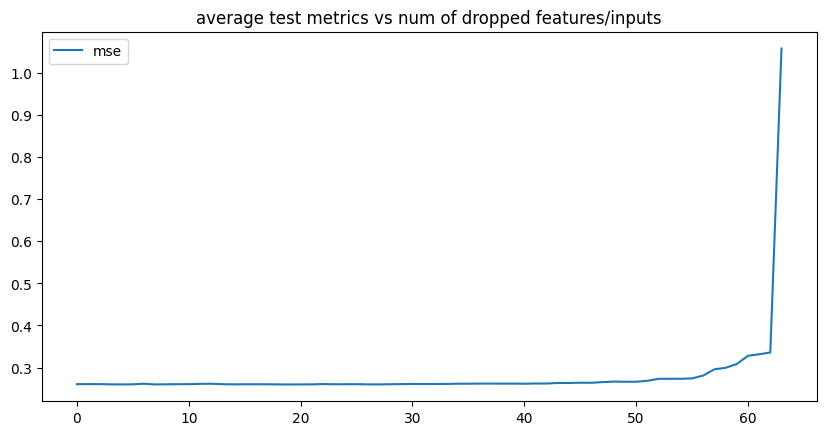

In [20]:
plot_dropping_metrics(test_metrics, labels)

In [21]:
num_drop_neurons = 51

save_models("california", "dgsm-layer3", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_neurons)
layer = models[num_drop_neurons].out

best_model.out = layer
best_model.layer2[0] = reduce_linear(best_model.layer2[0], dropped, num_drop_neurons)

features left [13]:  ['neuron4', 'neuron8', 'neuron14', 'neuron20', 'neuron28', 'neuron34', 'neuron37', 'neuron38', 'neuron50', 'neuron52', 'neuron58', 'neuron59', 'neuron62']


### pruned

In [22]:
best_model

CaliforniaNN(
  (layer1): Sequential(
    (0): Linear(in_features=6, out_features=39, bias=True)
    (1): ReLU()
  )
  (layer2): Sequential(
    (0): Linear(in_features=39, out_features=13, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
  )
  (out): Linear(in_features=13, out_features=1, bias=True)
)

In [23]:
with torch.no_grad():
    inputs, targets = dgsm_datasets["test"][:]
    outputs = best_model(inputs)

    test_metrics = score_outputs(outputs, targets)

print(f"test {labels}: {test_metrics}")

test mse: (0.26851820945739746,)


test: mse: (0.2770918309688568,)


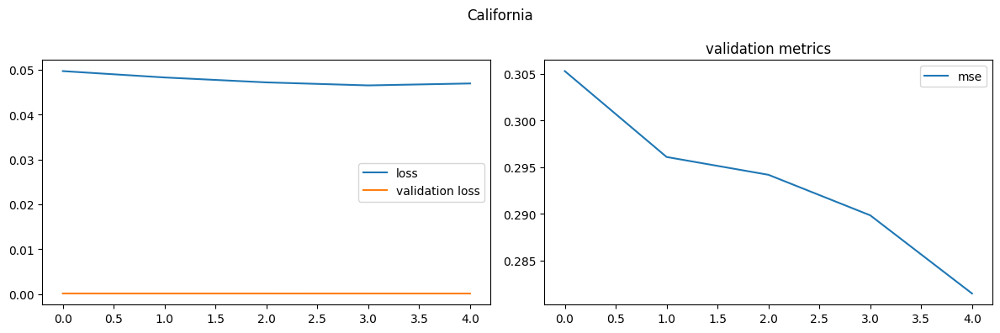

In [24]:
optimizer = optimizer_factory(best_model)
metrics = model_train(dgsm_datasets, best_model, optimizer, criterion, score_outputs, 5)

with torch.no_grad():
    inputs, targets = dgsm_datasets["test"][:]
    outputs = best_model(inputs)

    test_metrics = score_outputs(outputs, targets)

print(f"test: {labels}: {test_metrics}")
plot_metrics('California', metrics, labels)

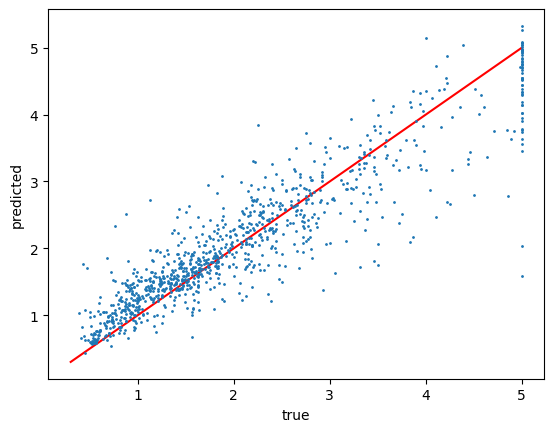

In [26]:
plt.plot([0.3, 5], [0.3, 5], c='r')
plt.plot(datasets["test"].tensors[1][:1000], outputs[:1000], '.', ms=2)
plt.xlabel("true")
plt.ylabel("predicted")
plt.show()

In [27]:
save_models("california", "dgsm-prunned", [best_model], None)

## FAST

In [28]:
best_model = CaliforniaNN()

### input layer

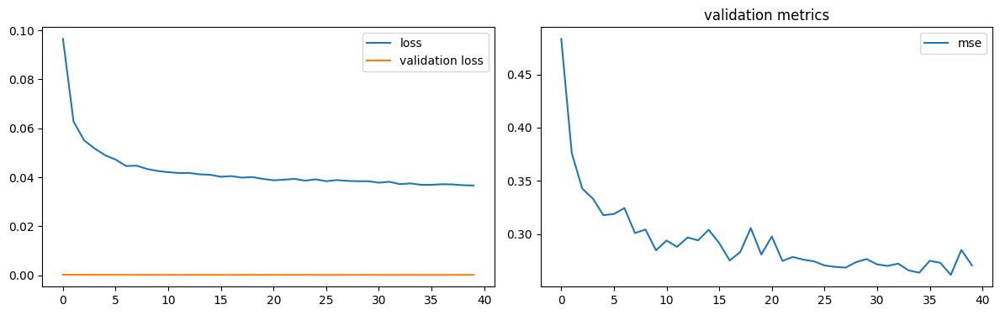

num of dropped: 0
Test: loss: 0.27314701676368713, avg metrics: (0.2725498199462891,)
dropping feature: (2, 'AveRooms')


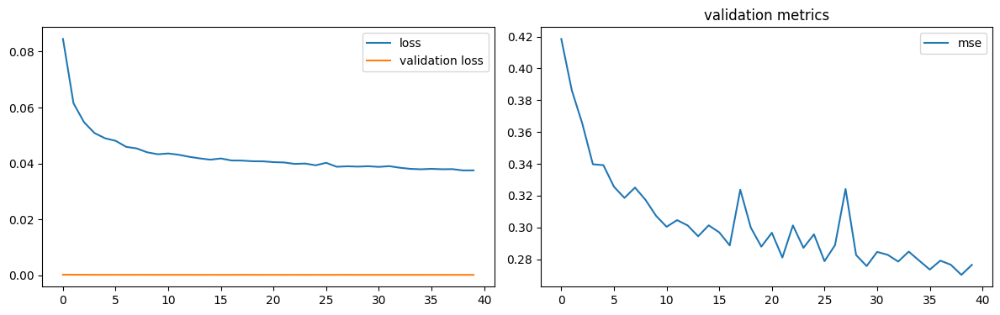

num of dropped: 1
Test: loss: 0.27632230520248413, avg metrics: (0.2762732982635498,)
dropping feature: (3, 'Population')


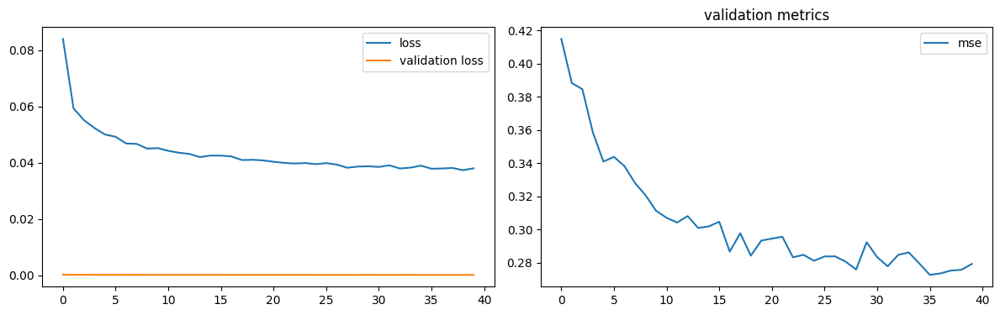

num of dropped: 2
Test: loss: 0.27964484691619873, avg metrics: (0.27689096331596375,)
dropping feature: (0, 'MedInc')


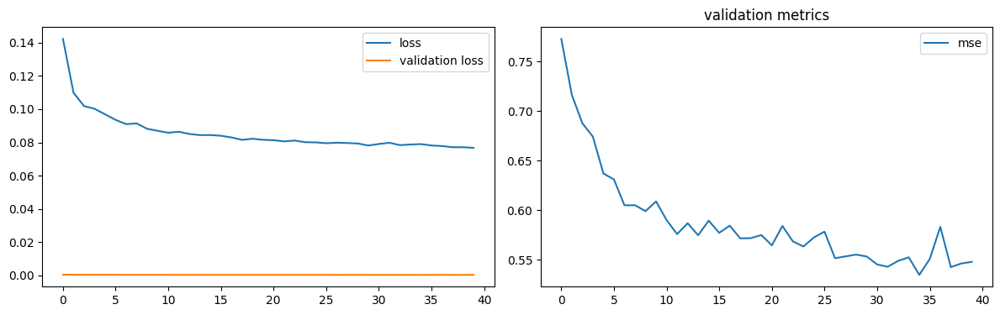

num of dropped: 3
Test: loss: 0.585381805896759, avg metrics: (0.5944822907447815,)
dropping feature: (0, 'HouseAge')


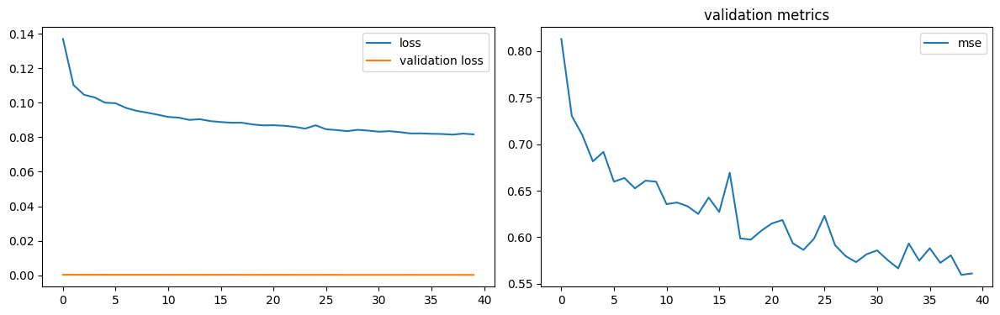

num of dropped: 4
Test: loss: 0.6088414788246155, avg metrics: (0.6250070929527283,)
dropping feature: (0, 'AveBedrms')


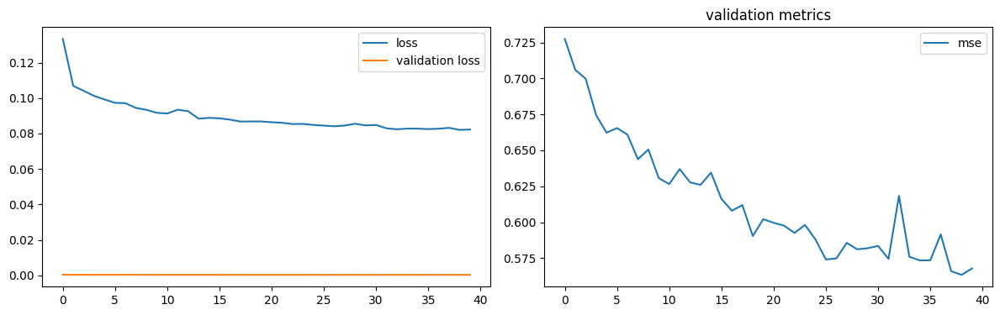

num of dropped: 5
Test: loss: 0.6086664199829102, avg metrics: (0.621917188167572,)
dropping feature: (2, 'Longitude')


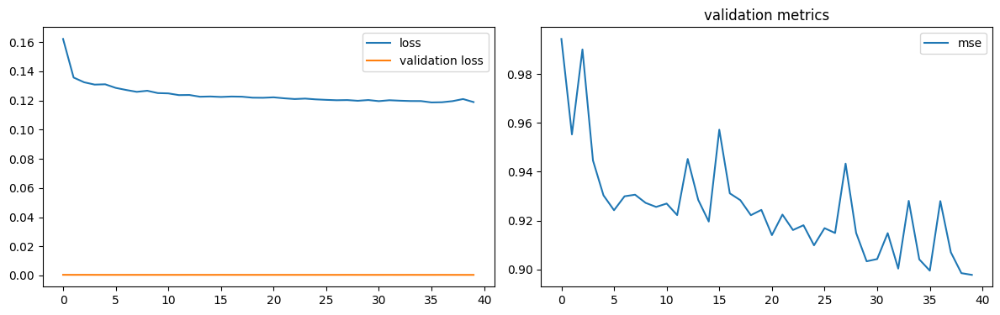

num of dropped: 6
Test: loss: 0.9693474769592285, avg metrics: (0.9389464616775512,)
dropping feature: (1, 'Latitude')


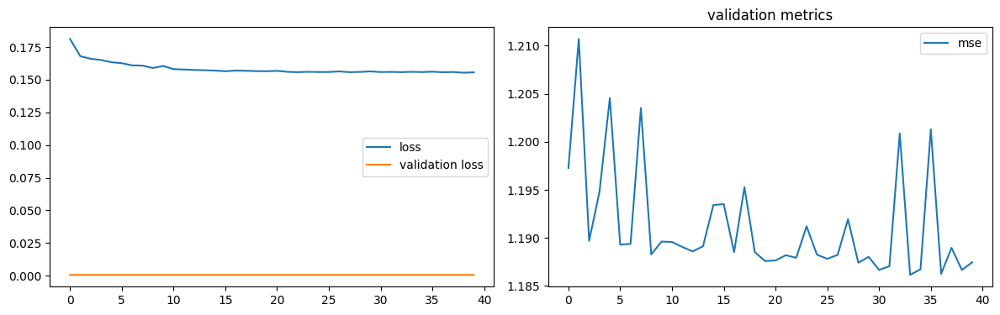

num of dropped: 7
Test: loss: 1.212074637413025, avg metrics: (1.2105799198150635,)


In [29]:
torch.manual_seed(2024)

datasets = california_datasets.copy()
headers = california_headers.copy()


def model_factory(size):
    return CaliforniaNN(size)


test_metrics, dropped, models = prune(
    datasets, headers, analyze_fast,
    model_factory, optimizer_factory, criterion, score_outputs, 40,
    labels, "", None
)

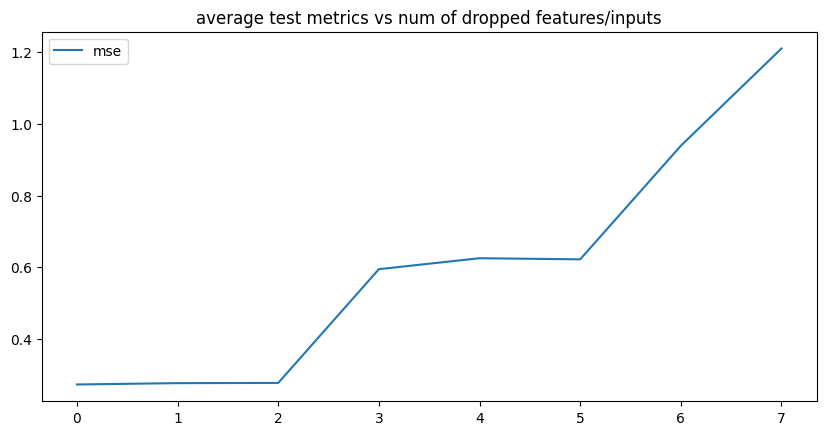

In [30]:
plot_dropping_metrics(test_metrics, labels)

In [31]:
num_drop_features = 2

save_models("california", "fast-layer1", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_features)
layer = models[num_drop_features].layer1

best_model.layer1 = layer

fast_dataset = reduced_datasets

features left [6]:  ['MedInc', 'HouseAge', 'AveBedrms', 'AveOccup', 'Latitude', 'Longitude']


### 1st hidden layer

In [32]:
layer.eval()

datasets = {
    key: TensorDataset(
        layer(dataset.tensors[0]).detach(),
        dataset.tensors[1]
    )
    for key, dataset in reduced_datasets.items()
}

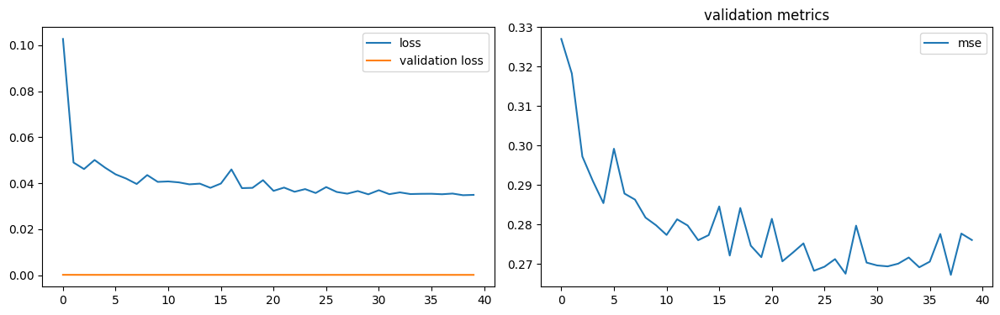

num of dropped: 0
Test: loss: 0.271645724773407, avg metrics: (0.26424819231033325,)
dropping feature: (22, 'neuron22')


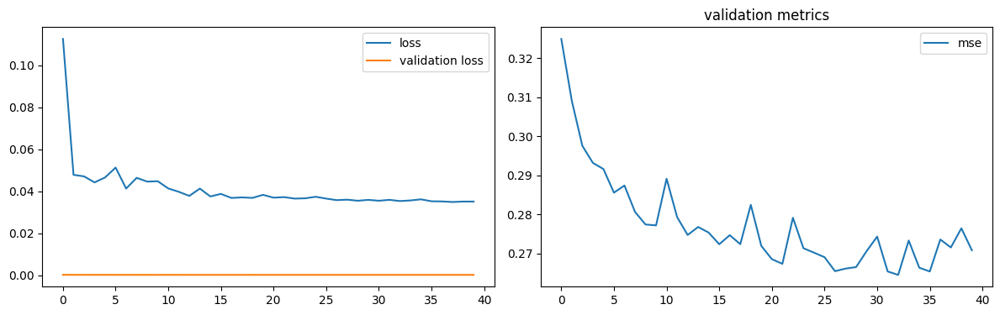

num of dropped: 1
Test: loss: 0.2648470103740692, avg metrics: (0.26616509556770324,)
dropping feature: (47, 'neuron48')


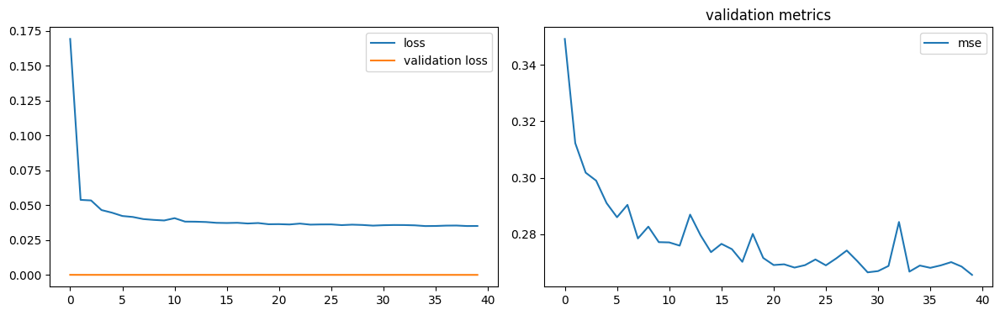

num of dropped: 2
Test: loss: 0.2625797986984253, avg metrics: (0.26623947620391847,)
dropping feature: (48, 'neuron50')


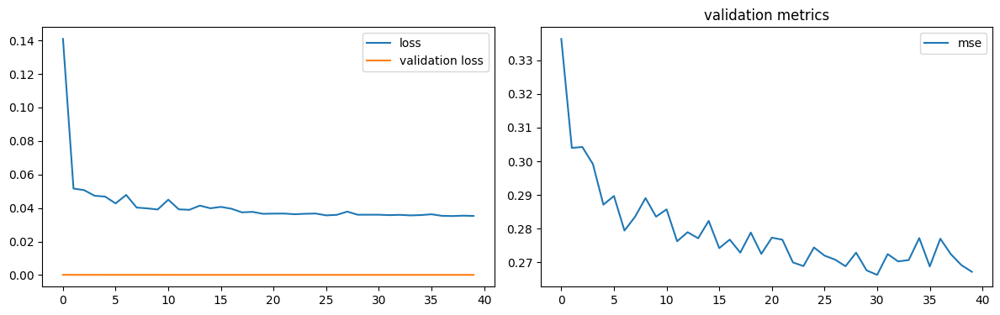

num of dropped: 3
Test: loss: 0.2614278197288513, avg metrics: (0.263320779800415,)
dropping feature: (48, 'neuron51')


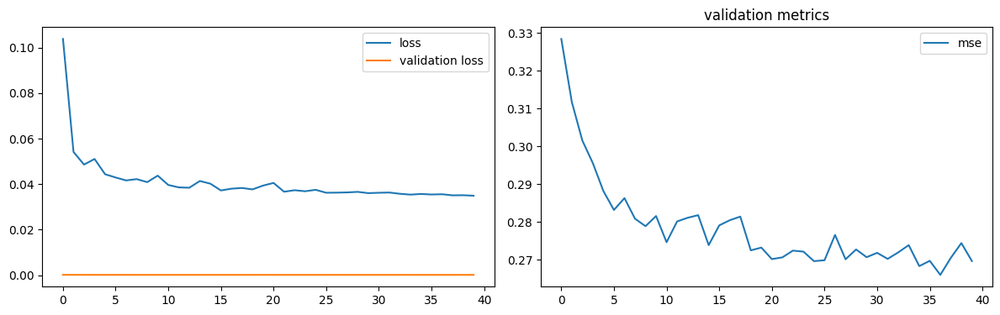

num of dropped: 4
Test: loss: 0.26633068919181824, avg metrics: (0.2636337220668793,)
dropping feature: (2, 'neuron2')


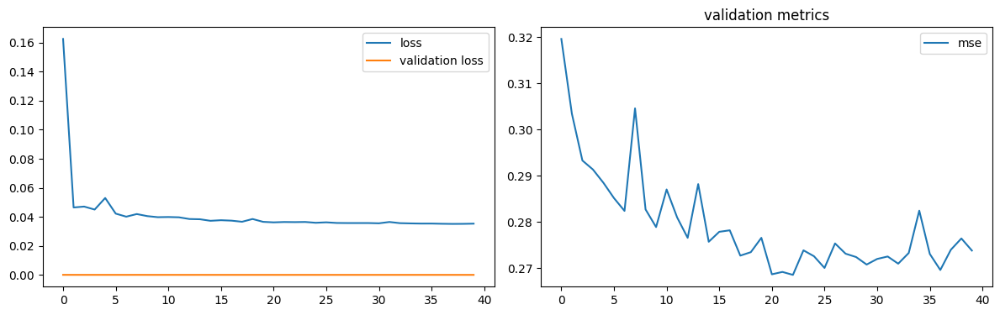

num of dropped: 5
Test: loss: 0.3423846662044525, avg metrics: (0.2807014763355255,)
dropping feature: (26, 'neuron28')


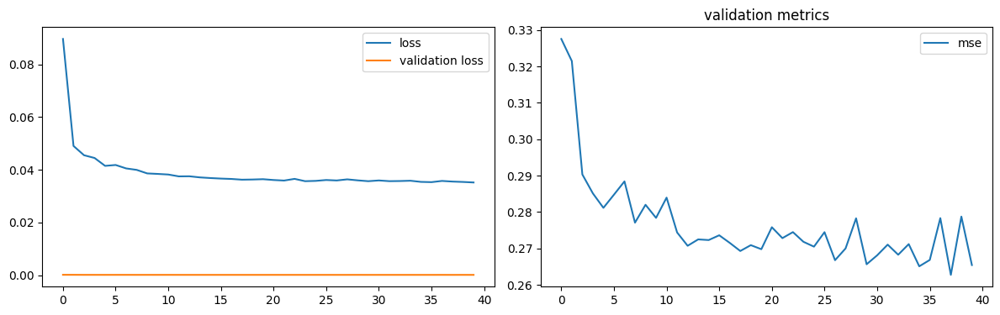

num of dropped: 6
Test: loss: 0.26087304949760437, avg metrics: (0.26673544049263,)
dropping feature: (37, 'neuron40')


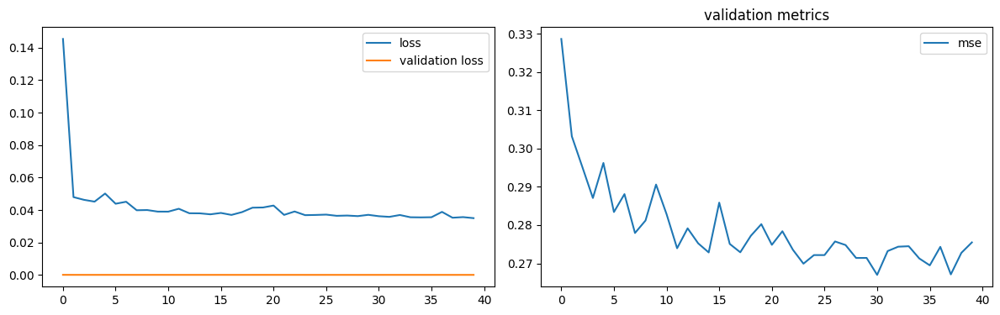

num of dropped: 7
Test: loss: 0.2707918882369995, avg metrics: (0.27306928038597106,)
dropping feature: (29, 'neuron32')


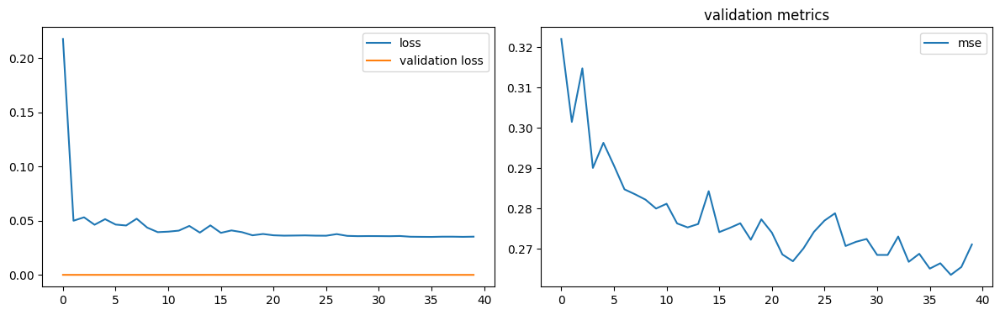

num of dropped: 8
Test: loss: 0.27130910754203796, avg metrics: (0.26571801900863645,)
dropping feature: (39, 'neuron44')


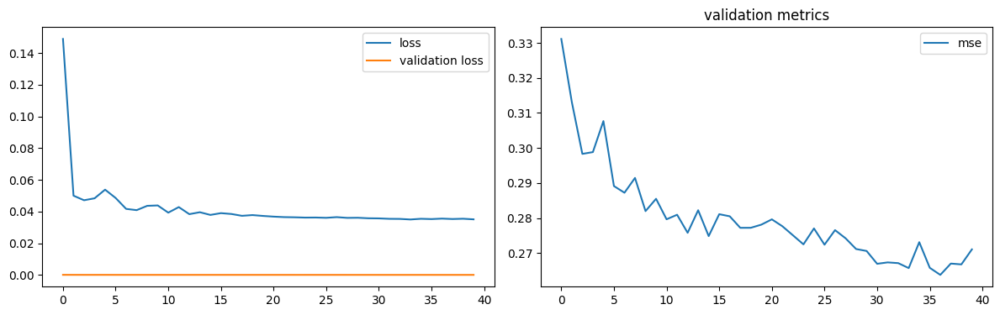

num of dropped: 9
Test: loss: 0.26533976197242737, avg metrics: (0.2654590368270874,)
dropping feature: (46, 'neuron55')


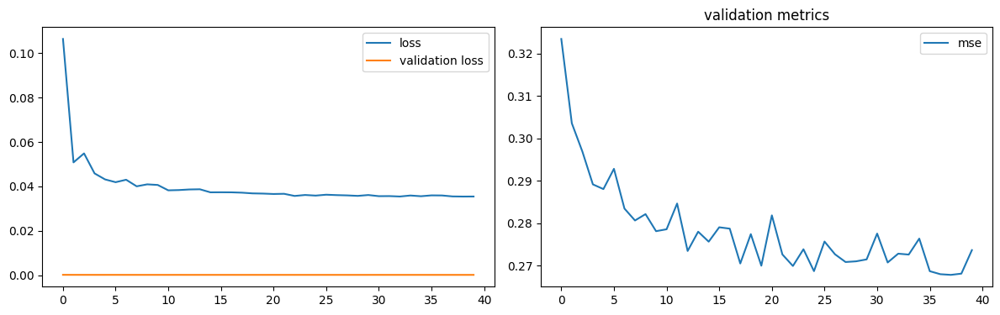

num of dropped: 10
Test: loss: 0.272167444229126, avg metrics: (0.26499465107917786,)
dropping feature: (43, 'neuron52')


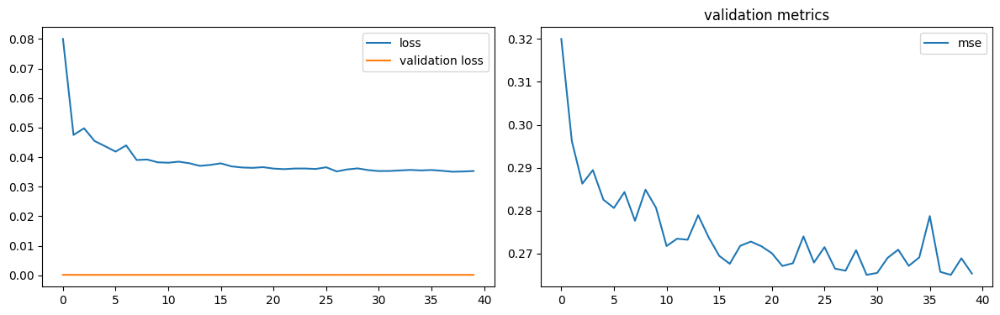

num of dropped: 11
Test: loss: 0.2598786950111389, avg metrics: (0.26344757676124575,)
dropping feature: (9, 'neuron10')


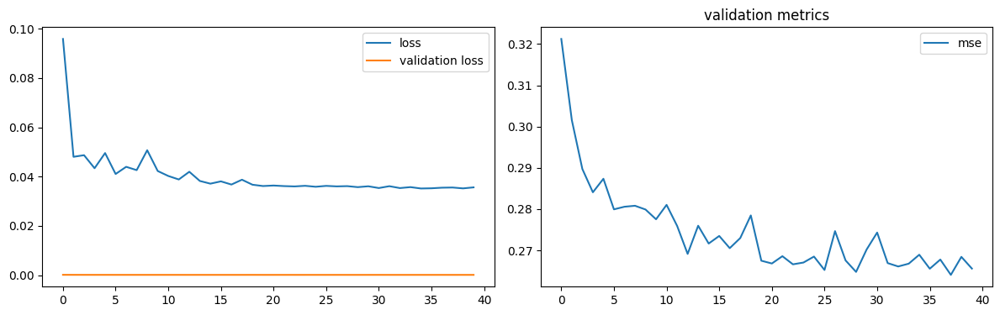

num of dropped: 12
Test: loss: 0.26044079661369324, avg metrics: (0.2666064202785492,)
dropping feature: (11, 'neuron13')


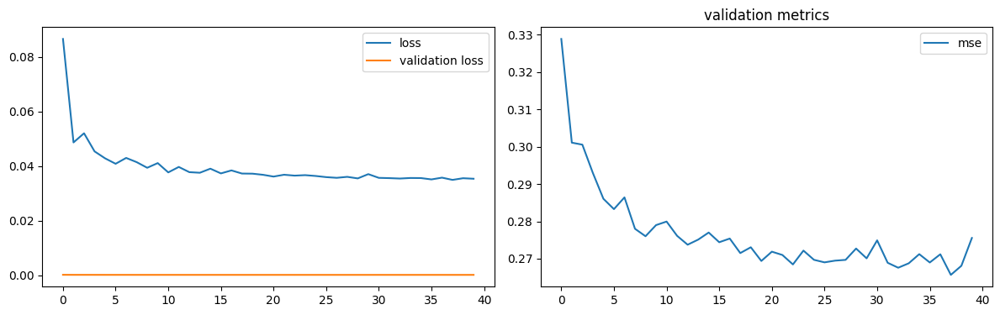

num of dropped: 13
Test: loss: 0.27221426367759705, avg metrics: (0.26515798568725585,)
dropping feature: (45, 'neuron58')


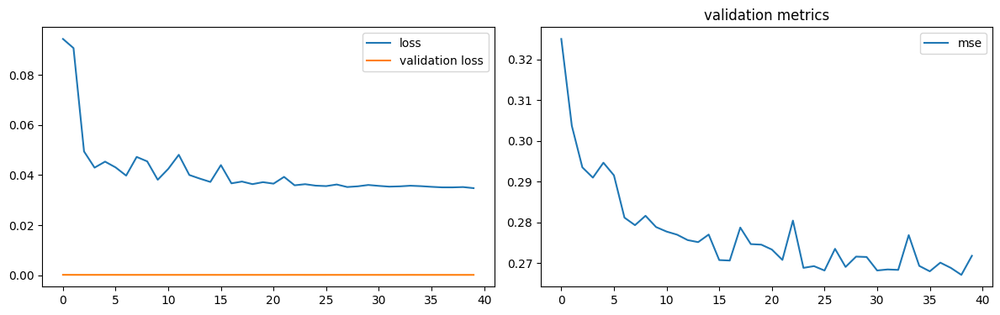

num of dropped: 14
Test: loss: 0.2695310413837433, avg metrics: (0.26498242020606994,)
dropping feature: (28, 'neuron34')


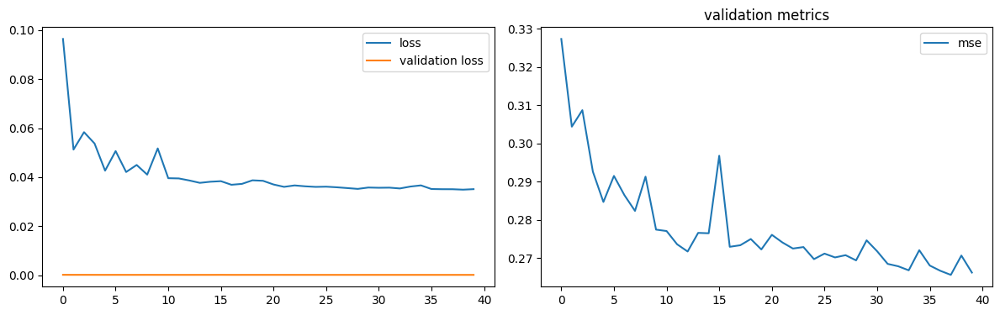

num of dropped: 15
Test: loss: 0.2612636685371399, avg metrics: (0.2664002478122711,)
dropping feature: (32, 'neuron39')


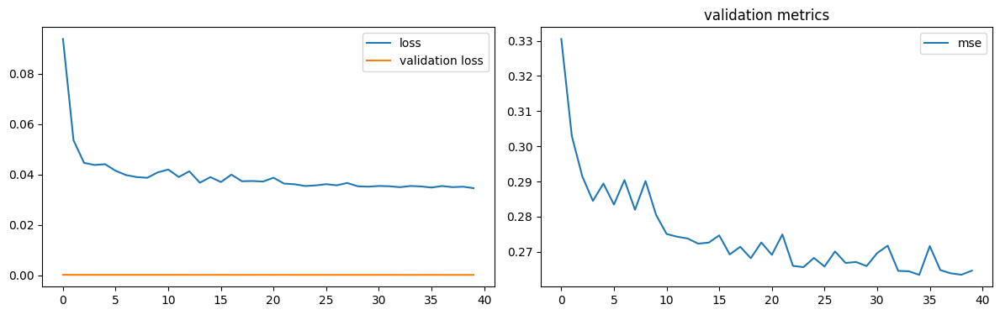

num of dropped: 16
Test: loss: 0.28547805547714233, avg metrics: (0.26896588802337645,)
dropping feature: (39, 'neuron53')


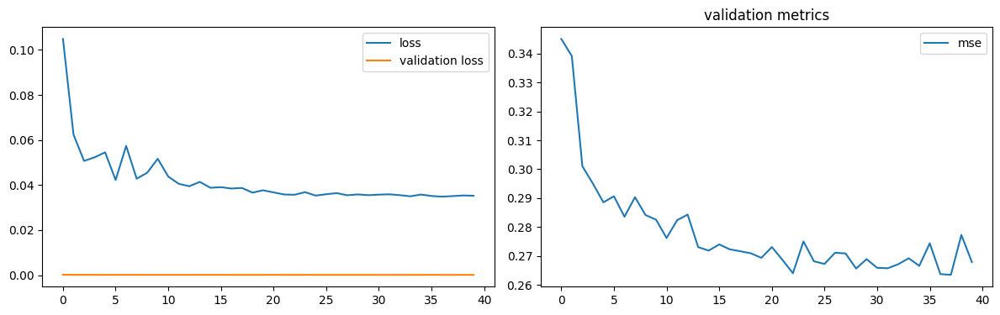

num of dropped: 17
Test: loss: 0.26237472891807556, avg metrics: (0.2625529050827026,)
dropping feature: (45, 'neuron62')


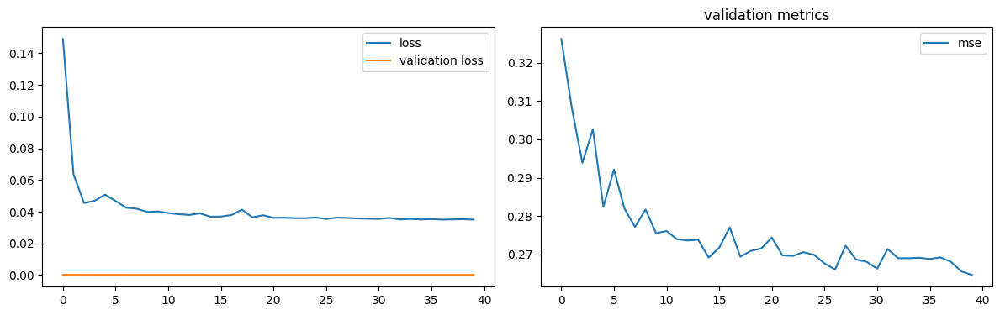

num of dropped: 18
Test: loss: 0.2609224319458008, avg metrics: (0.2655347168445587,)
dropping feature: (43, 'neuron60')


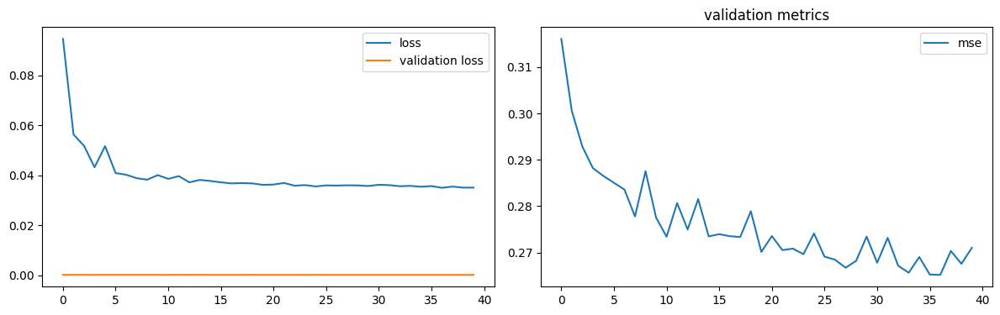

num of dropped: 19
Test: loss: 0.2626977860927582, avg metrics: (0.2627543568611145,)
dropping feature: (2, 'neuron3')


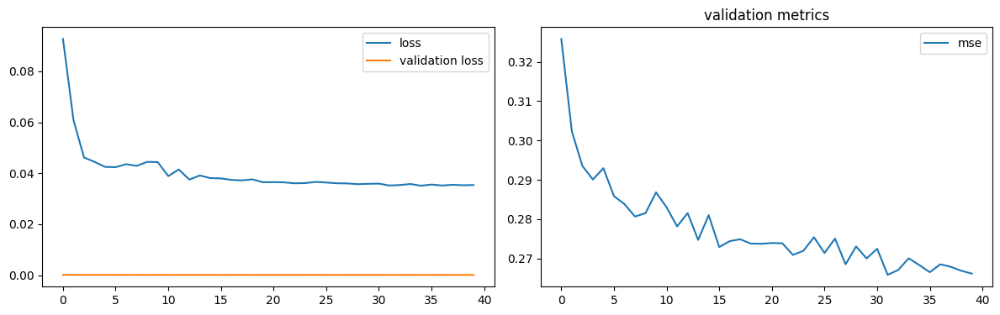

num of dropped: 20
Test: loss: 0.2673233449459076, avg metrics: (0.27112961411476133,)
dropping feature: (36, 'neuron47')


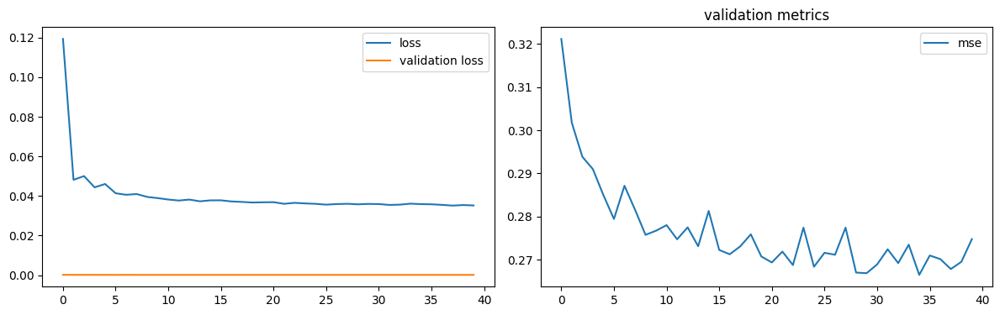

num of dropped: 21
Test: loss: 0.26619407534599304, avg metrics: (0.2647195816040039,)
dropping feature: (8, 'neuron11')


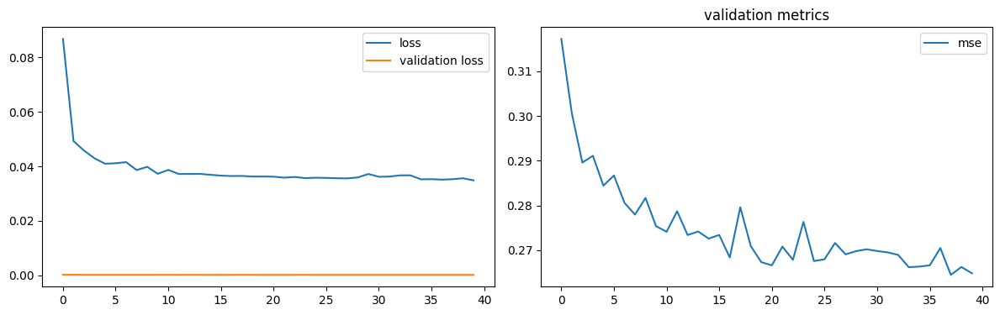

num of dropped: 22
Test: loss: 0.26133328676223755, avg metrics: (0.2633942127227783,)
dropping feature: (19, 'neuron25')


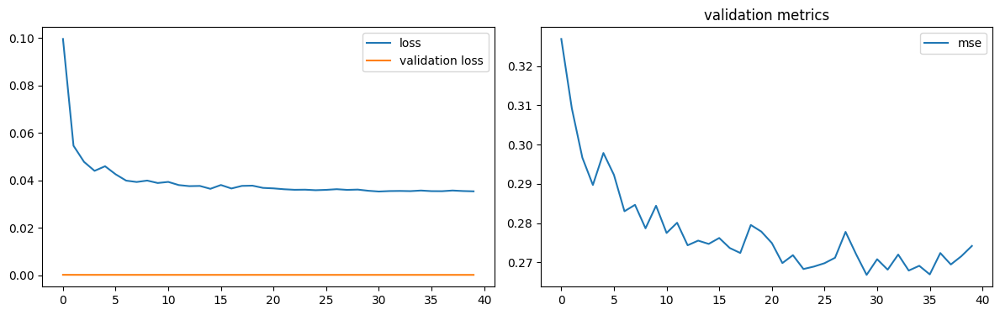

num of dropped: 23
Test: loss: 0.2785496413707733, avg metrics: (0.2684406042098999,)
dropping feature: (32, 'neuron45')


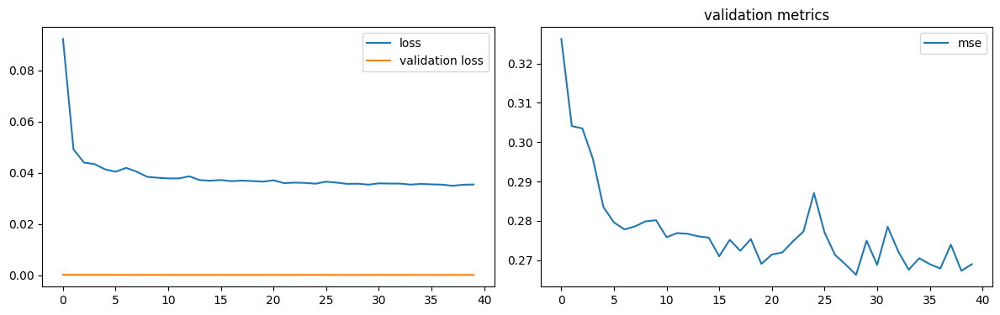

num of dropped: 24
Test: loss: 0.26201432943344116, avg metrics: (0.2629669964313507,)
dropping feature: (11, 'neuron16')


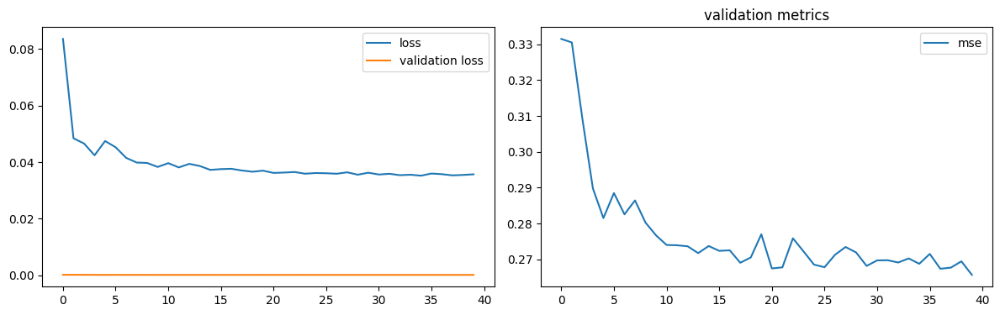

num of dropped: 25
Test: loss: 0.26032084226608276, avg metrics: (0.2635617971420288,)
dropping feature: (28, 'neuron41')


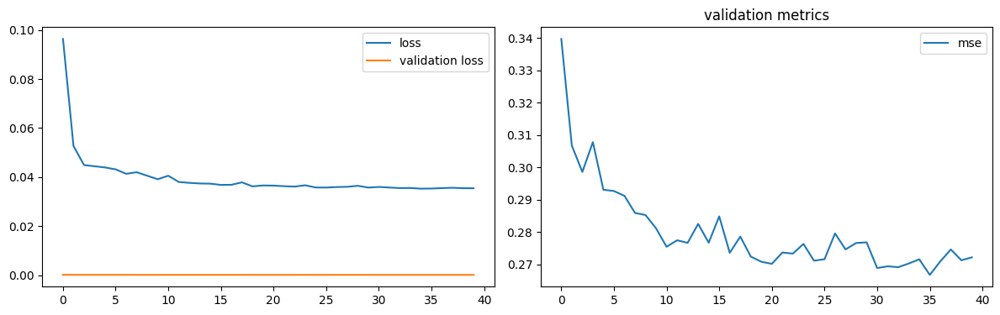

num of dropped: 26
Test: loss: 0.2671036124229431, avg metrics: (0.2657970070838928,)
dropping feature: (35, 'neuron59')


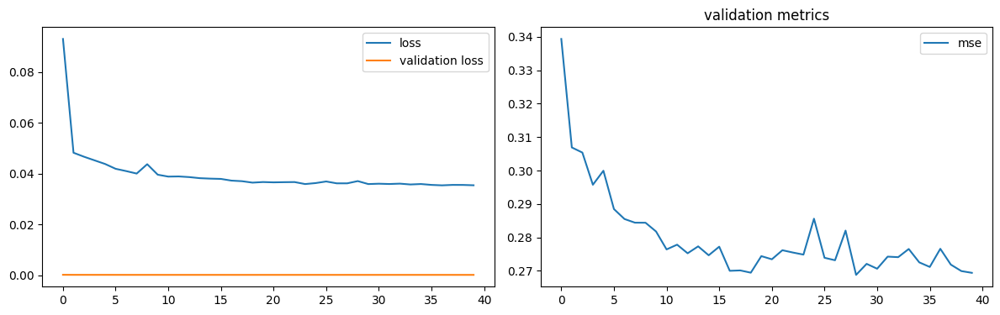

num of dropped: 27
Test: loss: 0.2648928463459015, avg metrics: (0.26588073968887327,)
dropping feature: (21, 'neuron30')


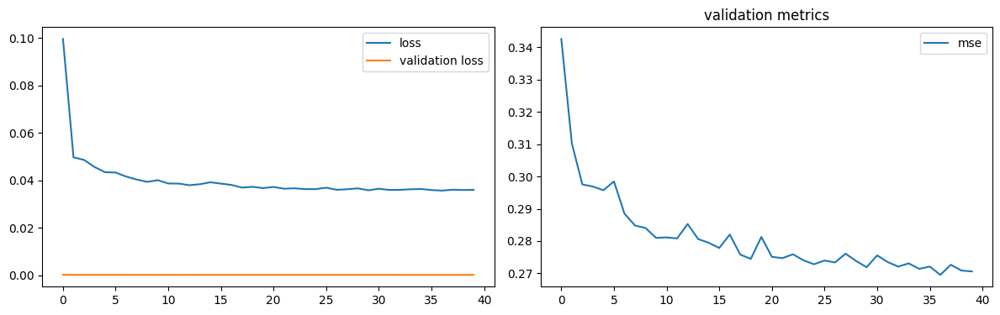

num of dropped: 28
Test: loss: 0.2678077220916748, avg metrics: (0.27192169427871704,)
dropping feature: (14, 'neuron20')


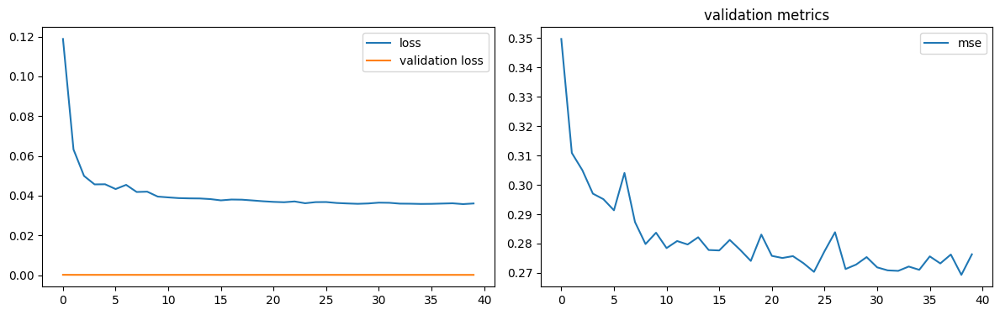

num of dropped: 29
Test: loss: 0.274451345205307, avg metrics: (0.26835742592811584,)
dropping feature: (1, 'neuron1')


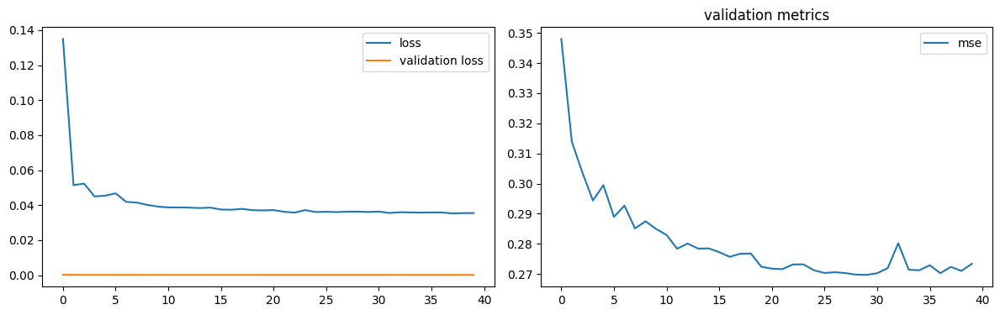

num of dropped: 30
Test: loss: 0.2709573209285736, avg metrics: (0.2691016554832458,)
dropping feature: (4, 'neuron7')


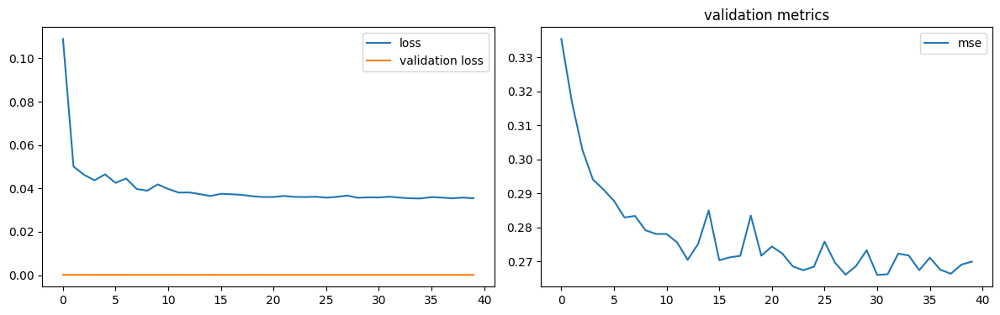

num of dropped: 31
Test: loss: 0.26955440640449524, avg metrics: (0.26678916811943054,)
dropping feature: (5, 'neuron9')


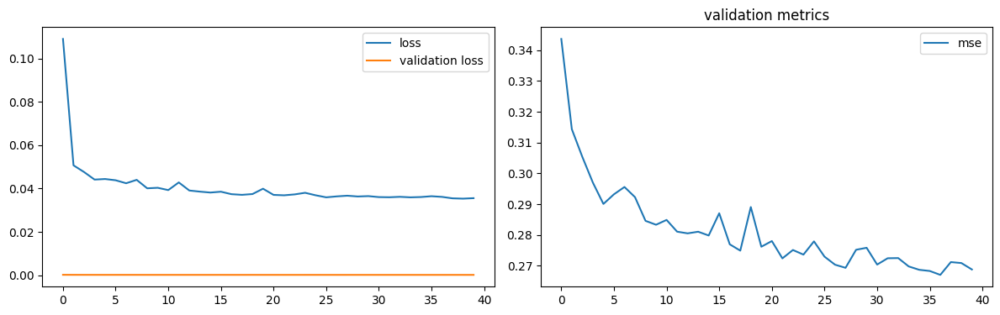

num of dropped: 32
Test: loss: 0.2723137140274048, avg metrics: (0.26810763478279115,)
dropping feature: (24, 'neuron43')


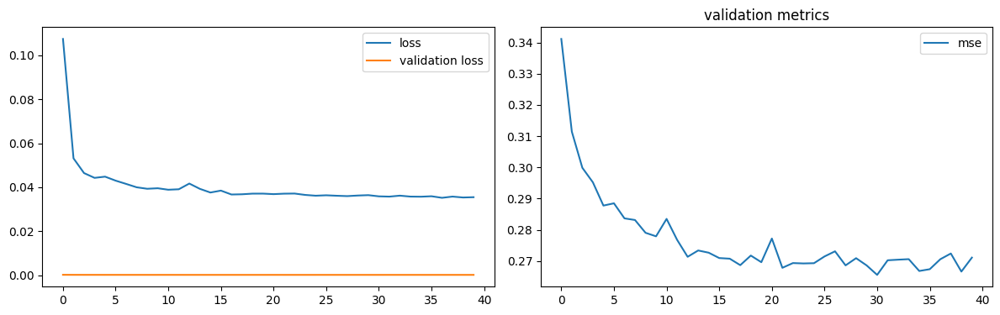

num of dropped: 33
Test: loss: 0.2712774872779846, avg metrics: (0.26909329891204836,)
dropping feature: (30, 'neuron63')


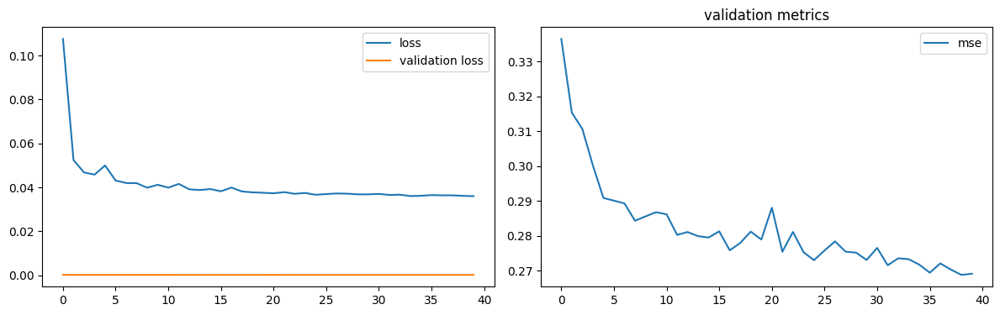

num of dropped: 34
Test: loss: 0.2668202221393585, avg metrics: (0.26764286160469053,)
dropping feature: (3, 'neuron6')


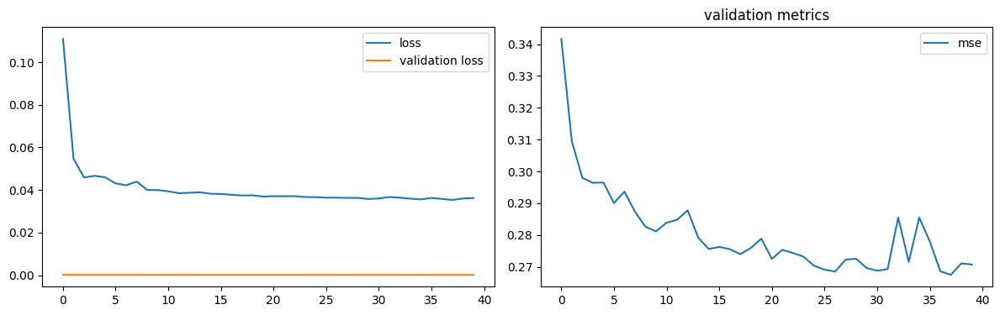

num of dropped: 35
Test: loss: 0.2699185013771057, avg metrics: (0.26945393681526186,)
dropping feature: (24, 'neuron49')


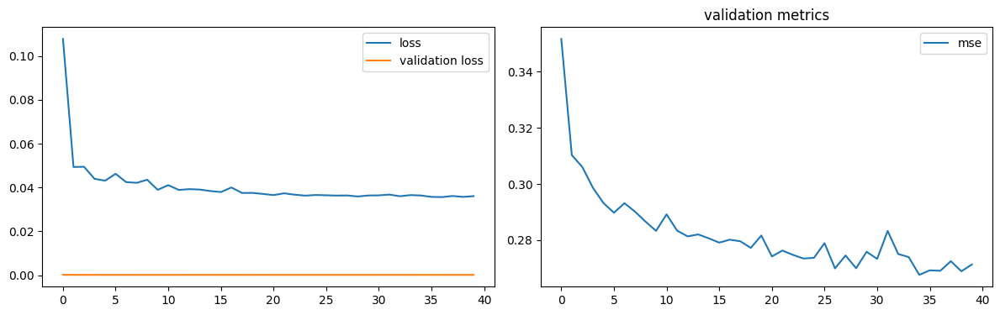

num of dropped: 36
Test: loss: 0.27374863624572754, avg metrics: (0.2711564600467682,)
dropping feature: (3, 'neuron8')


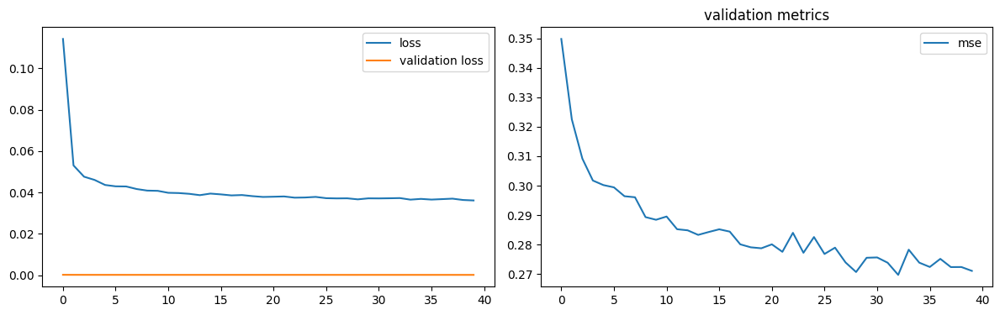

num of dropped: 37
Test: loss: 0.27083662152290344, avg metrics: (0.27094786763191225,)
dropping feature: (12, 'neuron26')


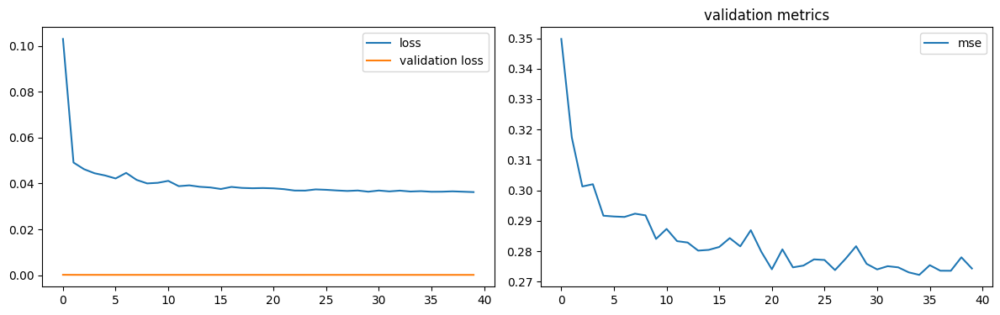

num of dropped: 38
Test: loss: 0.2737286686897278, avg metrics: (0.27405574917793274,)
dropping feature: (2, 'neuron5')


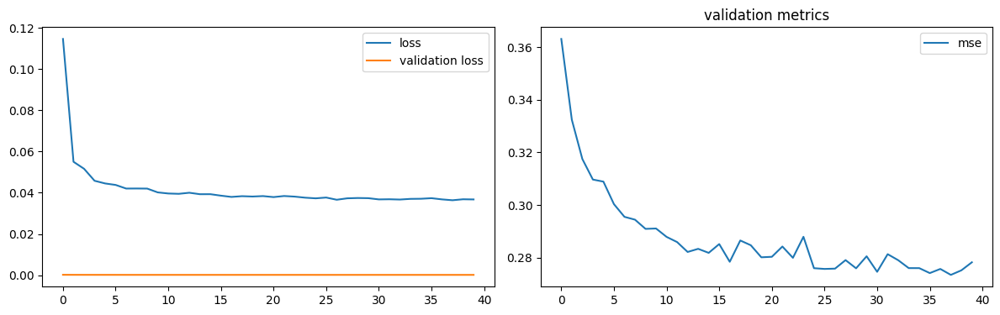

num of dropped: 39
Test: loss: 0.2759118378162384, avg metrics: (0.2765665888786316,)
dropping feature: (20, 'neuron46')


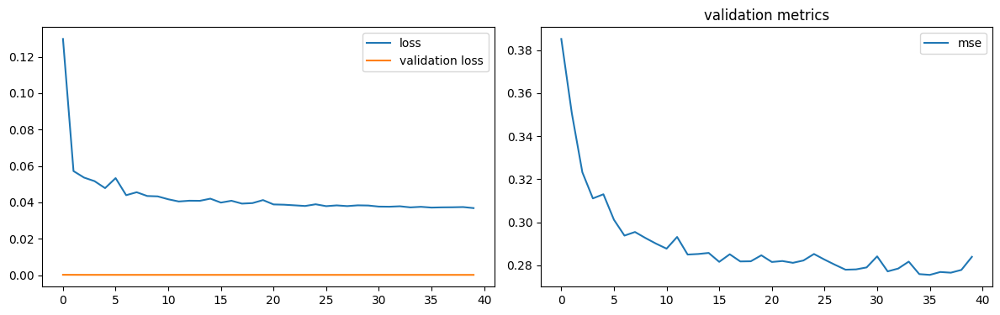

num of dropped: 40
Test: loss: 0.2864803075790405, avg metrics: (0.2793069064617157,)
dropping feature: (11, 'neuron27')


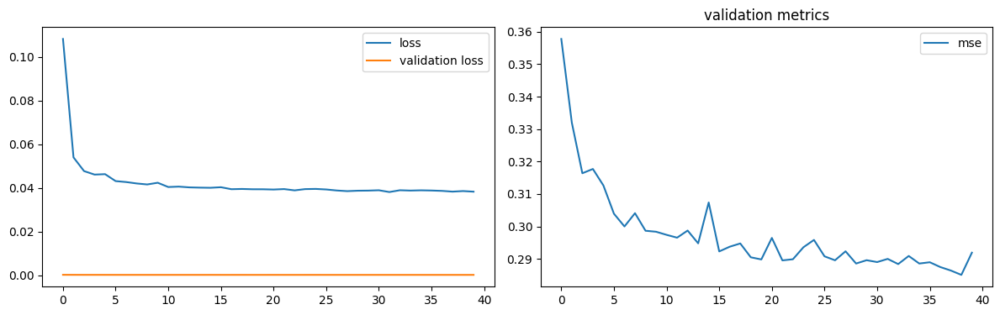

num of dropped: 41
Test: loss: 0.2912651002407074, avg metrics: (0.2852218210697174,)
dropping feature: (8, 'neuron21')


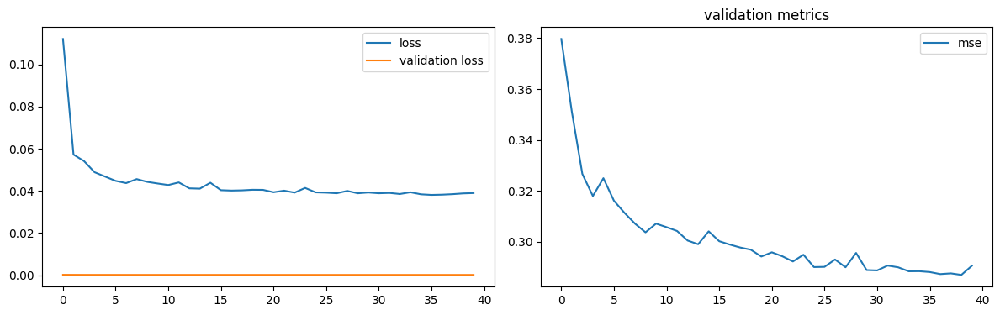

num of dropped: 42
Test: loss: 0.28670579195022583, avg metrics: (0.2967238187789917,)
dropping feature: (14, 'neuron36')


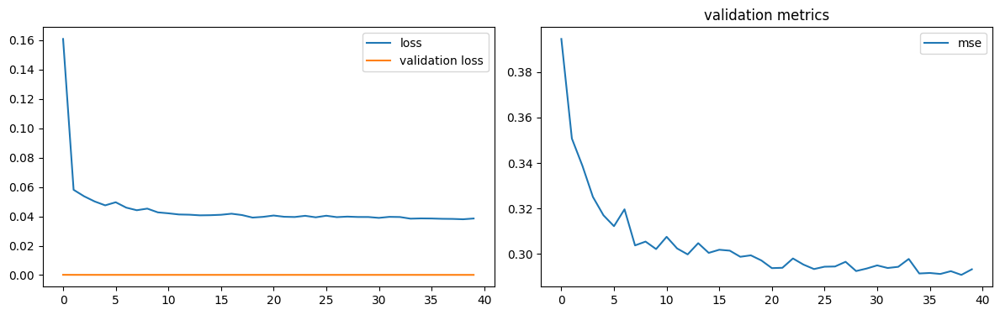

num of dropped: 43
Test: loss: 0.28544631600379944, avg metrics: (0.28582375049591063,)
dropping feature: (5, 'neuron17')


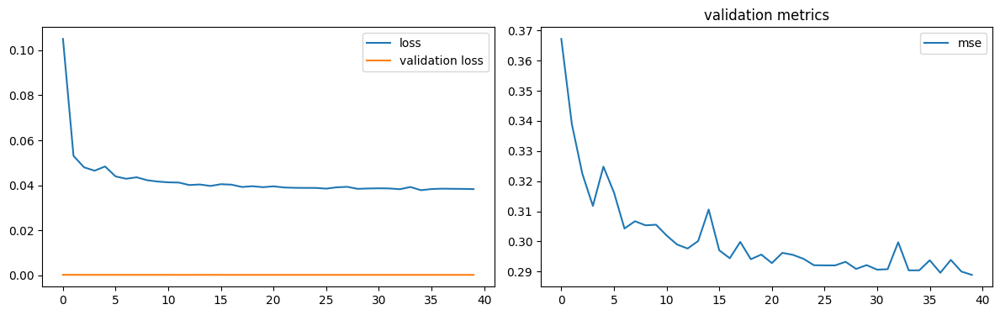

num of dropped: 44
Test: loss: 0.2900751531124115, avg metrics: (0.2865952789783478,)
dropping feature: (16, 'neuron54')


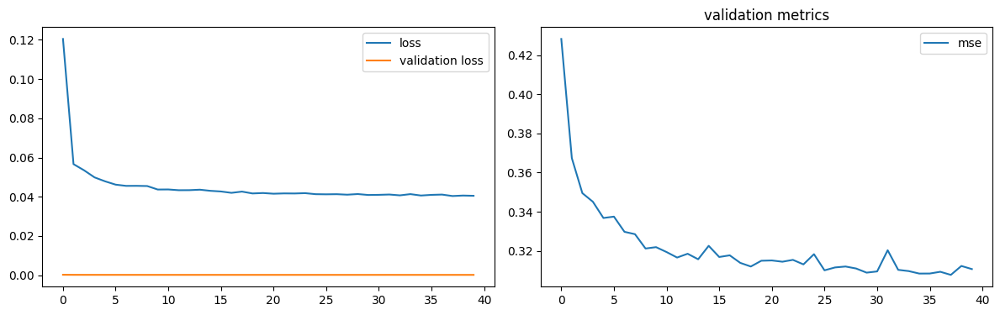

num of dropped: 45
Test: loss: 0.3010387420654297, avg metrics: (0.30907030701637267,)
dropping feature: (1, 'neuron4')


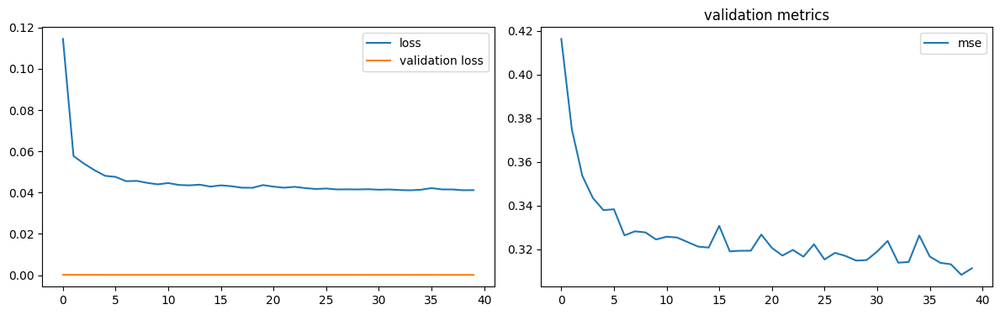

num of dropped: 46
Test: loss: 0.29657652974128723, avg metrics: (0.30041004419326783,)
dropping feature: (2, 'neuron14')


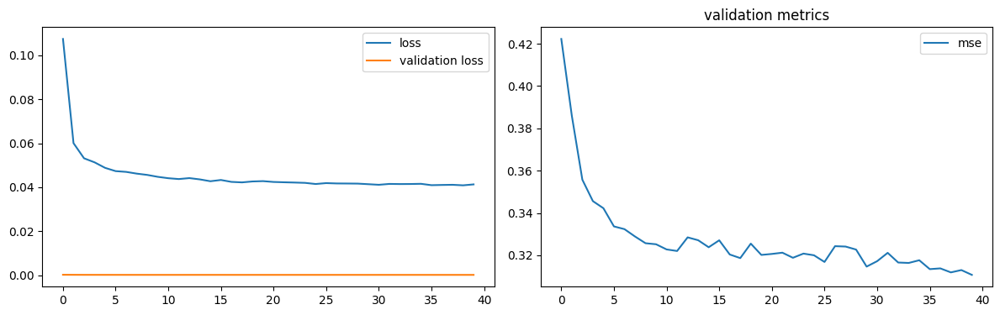

num of dropped: 47
Test: loss: 0.29892227053642273, avg metrics: (0.3004285991191864,)
dropping feature: (7, 'neuron29')


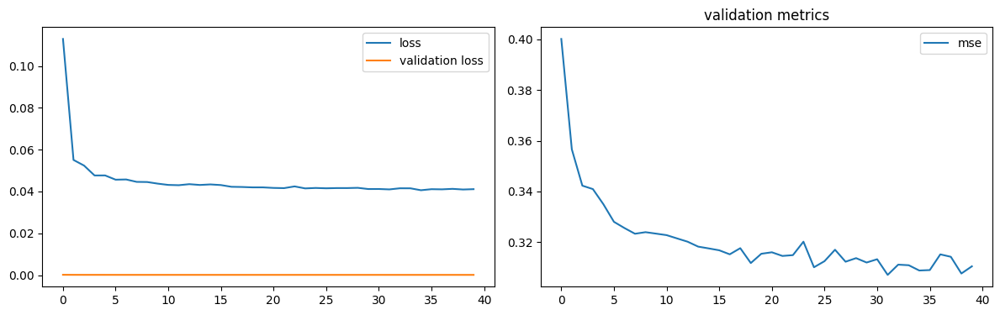

num of dropped: 48
Test: loss: 0.3021833002567291, avg metrics: (0.3046843707561493,)
dropping feature: (9, 'neuron35')


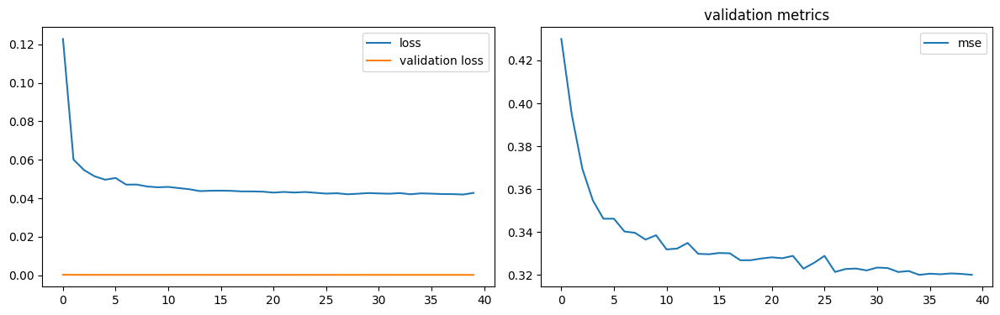

num of dropped: 49
Test: loss: 0.3066621422767639, avg metrics: (0.30760984420776366,)
dropping feature: (6, 'neuron24')


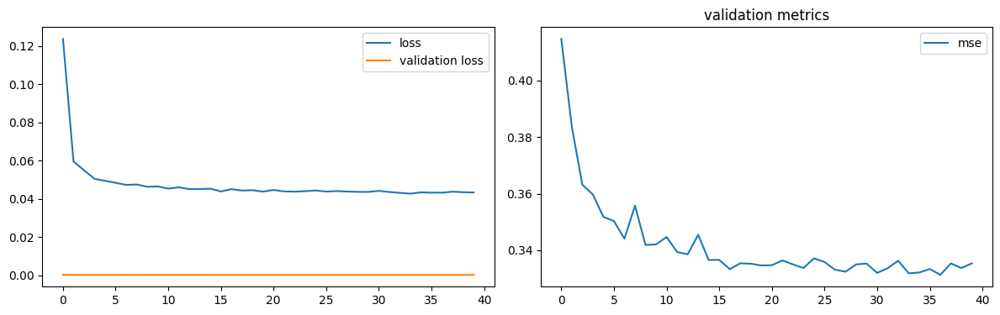

num of dropped: 50
Test: loss: 0.32317763566970825, avg metrics: (0.32422302961349486,)
dropping feature: (4, 'neuron19')


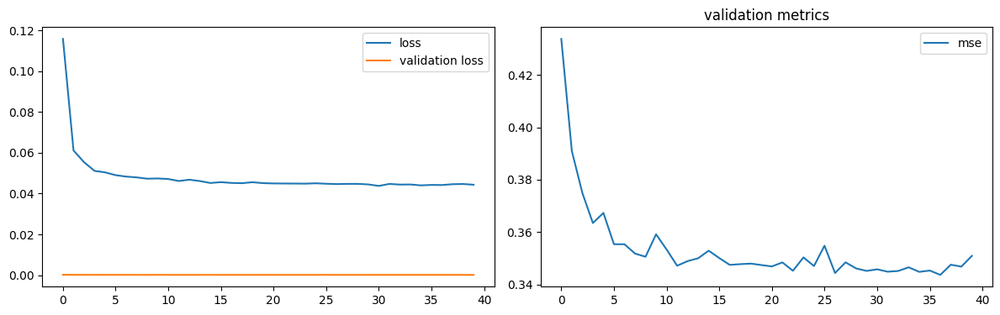

num of dropped: 51
Test: loss: 0.34070470929145813, avg metrics: (0.3305875301361084,)
dropping feature: (4, 'neuron23')


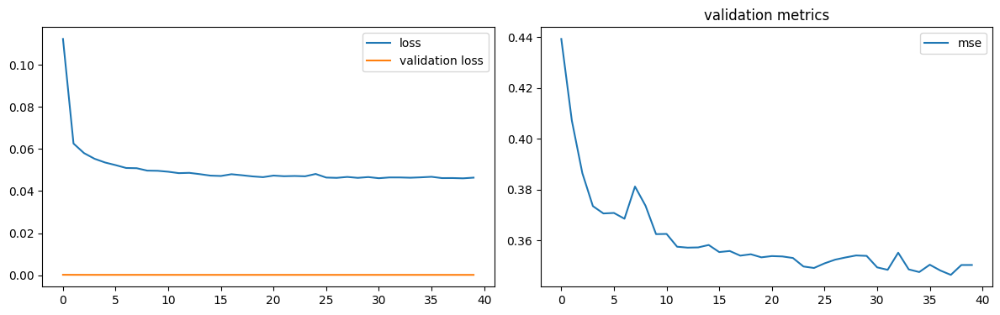

num of dropped: 52
Test: loss: 0.33535221219062805, avg metrics: (0.33658835887908933,)
dropping feature: (0, 'neuron0')


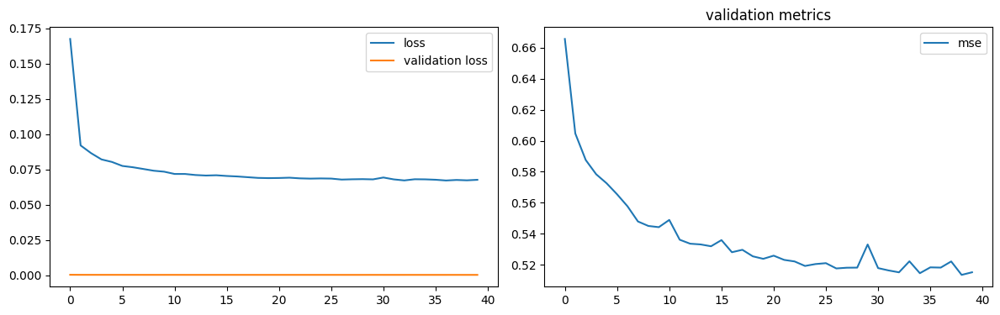

num of dropped: 53
Test: loss: 0.48819664120674133, avg metrics: (0.4880088925361633,)
dropping feature: (0, 'neuron12')


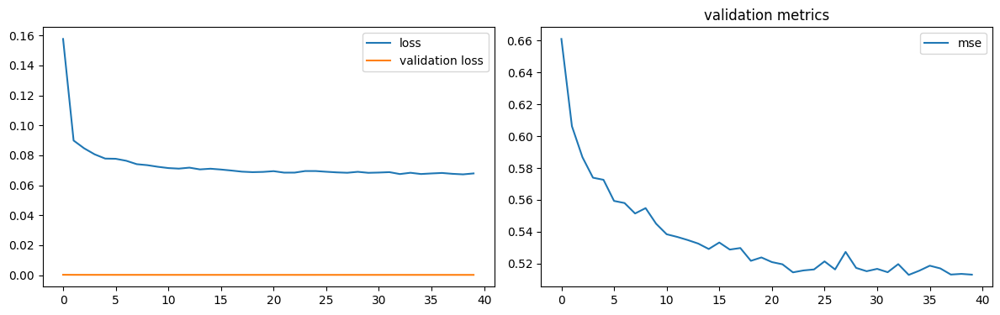

num of dropped: 54
Test: loss: 0.4922199249267578, avg metrics: (0.49263107776641846,)
dropping feature: (4, 'neuron37')


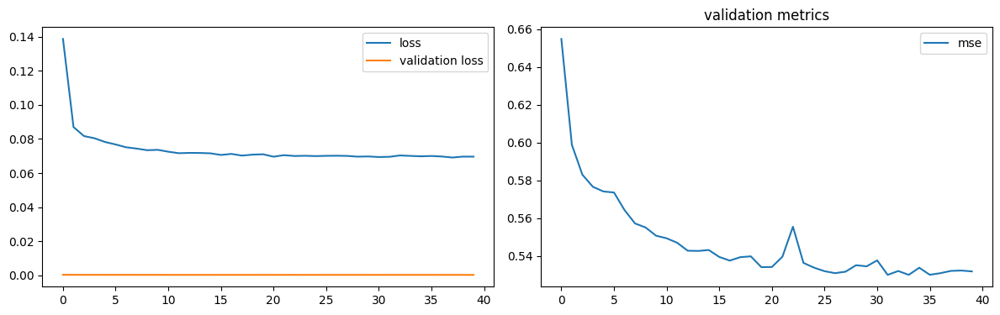

num of dropped: 55
Test: loss: 0.5091608166694641, avg metrics: (0.4977449536323547,)
dropping feature: (1, 'neuron18')


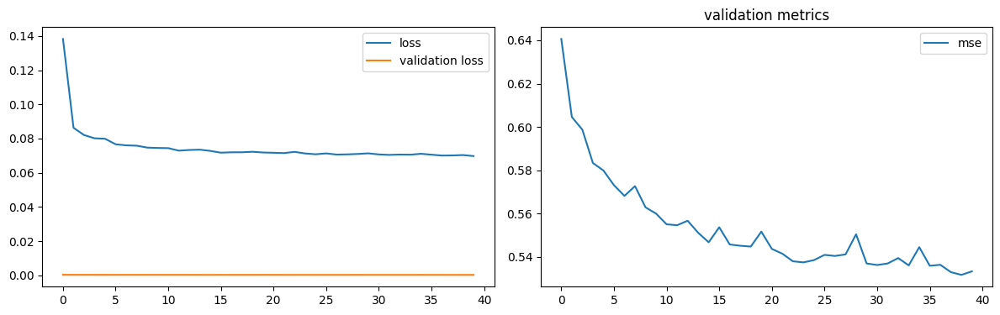

num of dropped: 56
Test: loss: 0.5090147852897644, avg metrics: (0.49994038939476015,)
dropping feature: (3, 'neuron38')


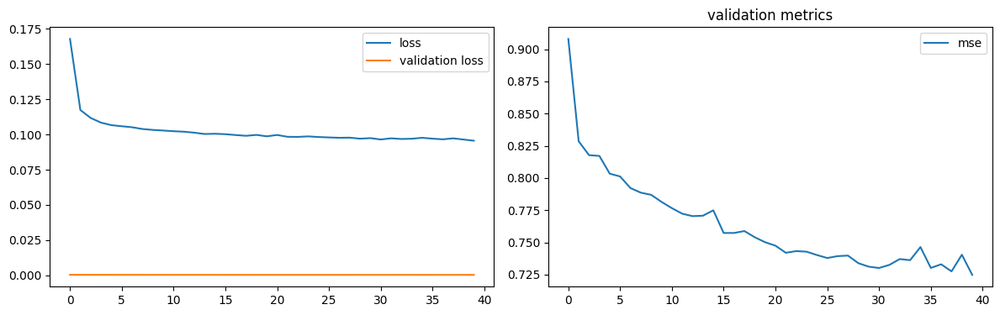

num of dropped: 57
Test: loss: 0.7237331867218018, avg metrics: (0.7302000761032105,)
dropping feature: (6, 'neuron61')


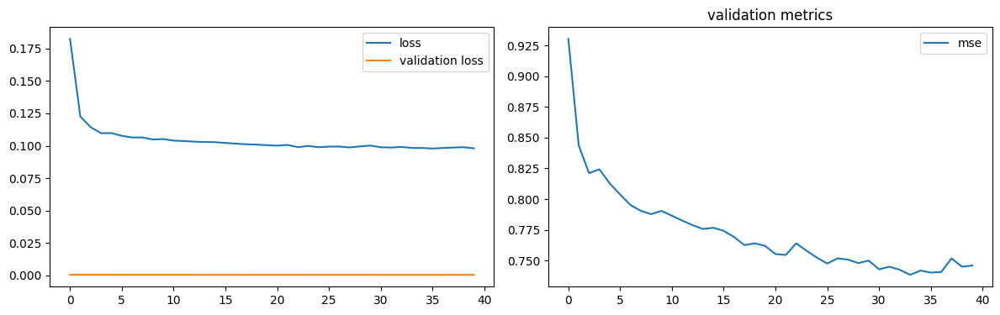

num of dropped: 58
Test: loss: 0.73978191614151, avg metrics: (0.748949408531189,)
dropping feature: (0, 'neuron15')


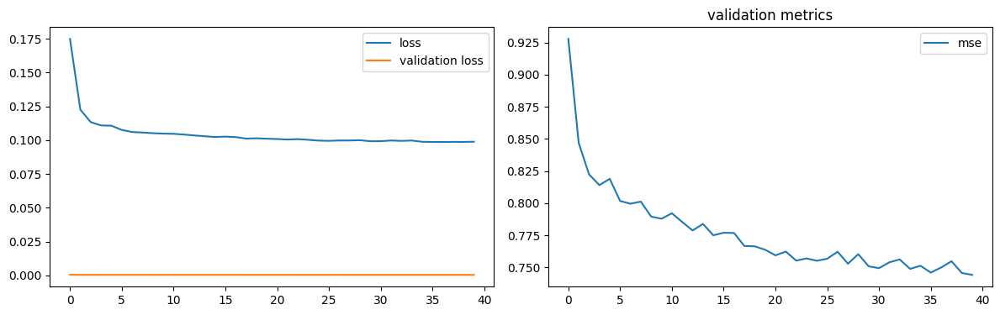

num of dropped: 59
Test: loss: 0.7410488128662109, avg metrics: (0.7466535568237305,)
dropping feature: (3, 'neuron56')


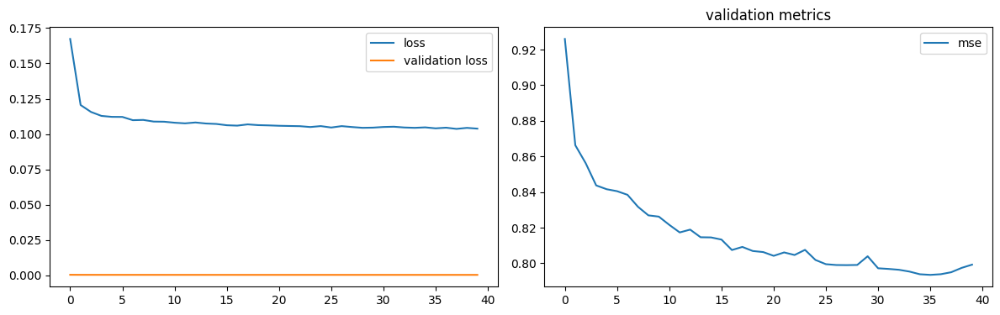

num of dropped: 60
Test: loss: 0.7958030104637146, avg metrics: (0.7960116028785705,)
dropping feature: (2, 'neuron42')


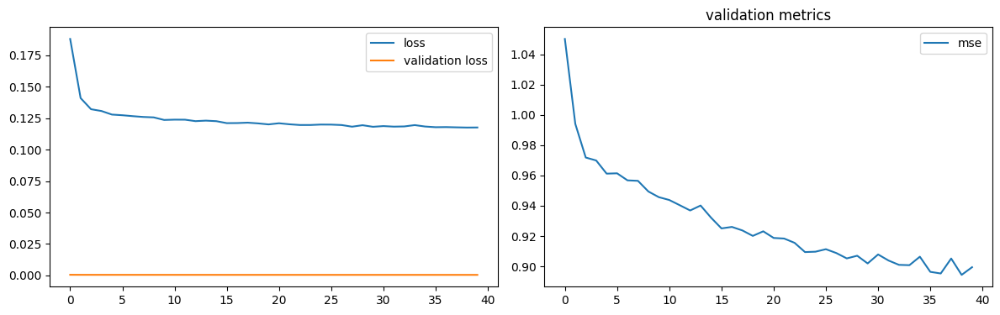

num of dropped: 61
Test: loss: 0.8948257565498352, avg metrics: (0.9053811073303223,)
dropping feature: (1, 'neuron33')


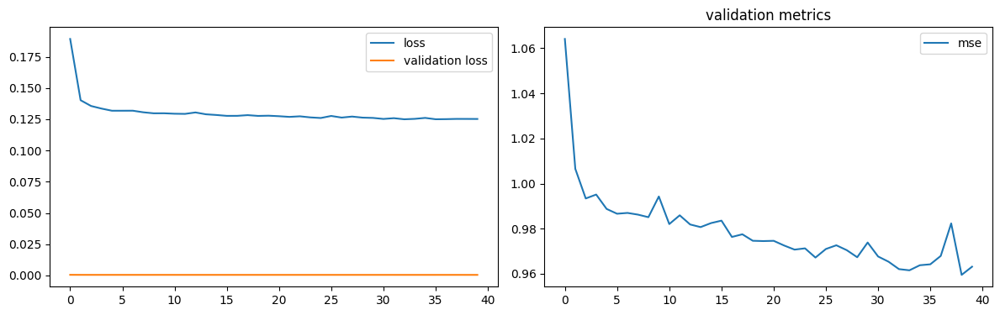

num of dropped: 62
Test: loss: 0.9505773186683655, avg metrics: (0.9527461290359497,)
dropping feature: (1, 'neuron57')


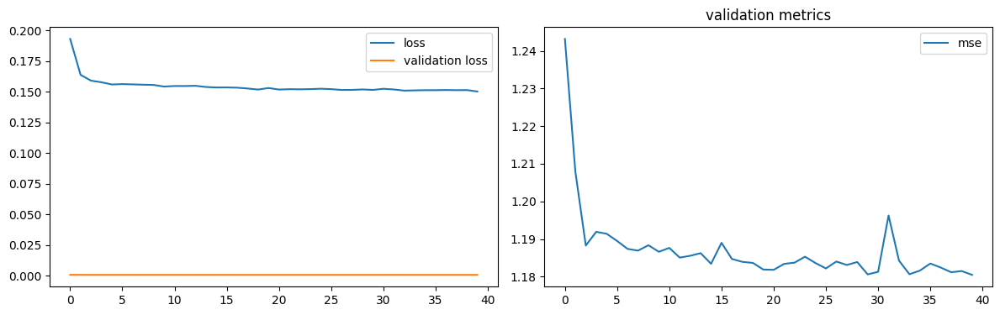

num of dropped: 63
Test: loss: 1.1625657081604004, avg metrics: (1.1525036573410035,)


In [33]:
torch.manual_seed(2024)

headers = [f"neuron{i}" for i in range(64)]

def model_factory(size):
    model = CaliforniaNN(1, (size, 64))
    model.layer1 = nn.Identity()
    return model


test_metrics, dropped, models = prune(
    datasets, headers, analyze_fast,
    model_factory, optimizer_factory, criterion, score_outputs, 40,
    labels, "", None
)

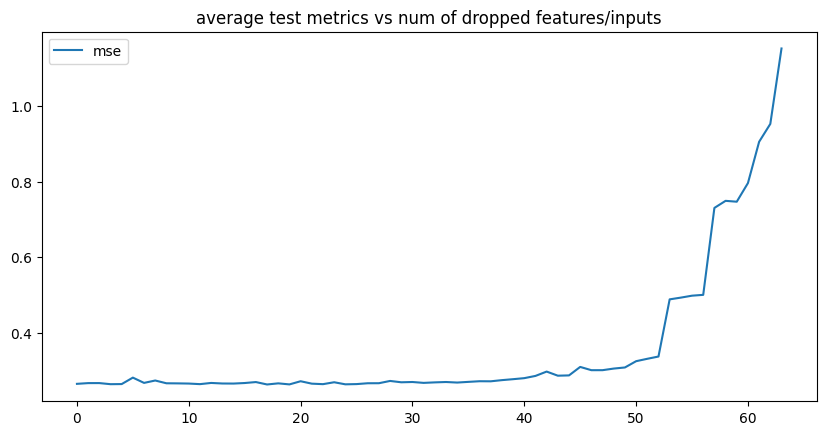

In [34]:
plot_dropping_metrics(test_metrics, labels)

In [35]:
num_drop_neurons = 35

save_models("california", "fast-layer2", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_neurons)
layer = models[num_drop_neurons].layer2

best_model.layer2 = layer
best_model.layer1[0] = reduce_linear(best_model.layer1[0], dropped, num_drop_neurons)

features left [29]:  ['neuron0', 'neuron4', 'neuron5', 'neuron8', 'neuron12', 'neuron14', 'neuron15', 'neuron17', 'neuron18', 'neuron19', 'neuron21', 'neuron23', 'neuron24', 'neuron26', 'neuron27', 'neuron29', 'neuron31', 'neuron33', 'neuron35', 'neuron36', 'neuron37', 'neuron38', 'neuron42', 'neuron46', 'neuron49', 'neuron54', 'neuron56', 'neuron57', 'neuron61']


### 2nd hidden layer

In [36]:
layer.eval()

datasets = {
    key: TensorDataset(
        layer(dataset.tensors[0]).detach(),
        dataset.tensors[1]
    )
    for key, dataset in reduced_datasets.items()
}

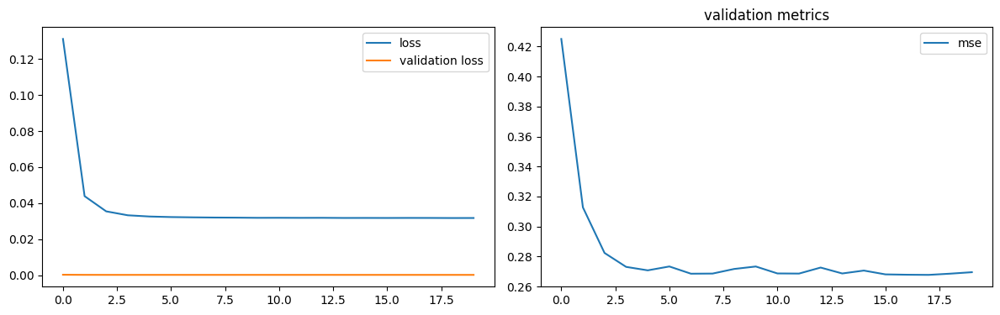

num of dropped: 0
Test: loss: 0.2675797939300537, avg metrics: (0.2678396224975586,)
dropping feature: (55, 'neuron55')


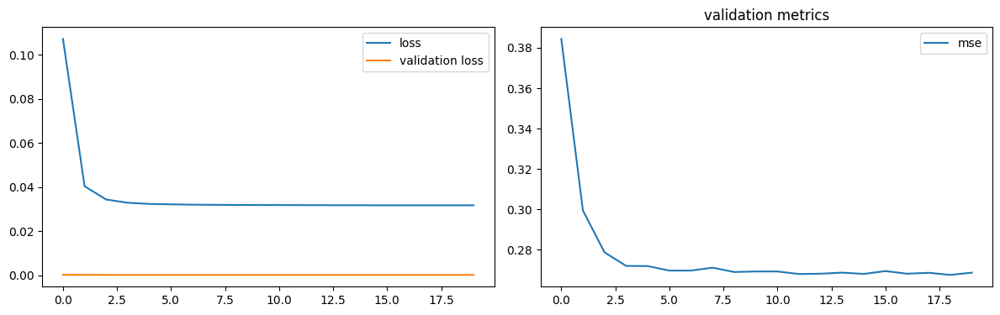

num of dropped: 1
Test: loss: 0.267323762178421, avg metrics: (0.2677644729614258,)
dropping feature: (38, 'neuron38')


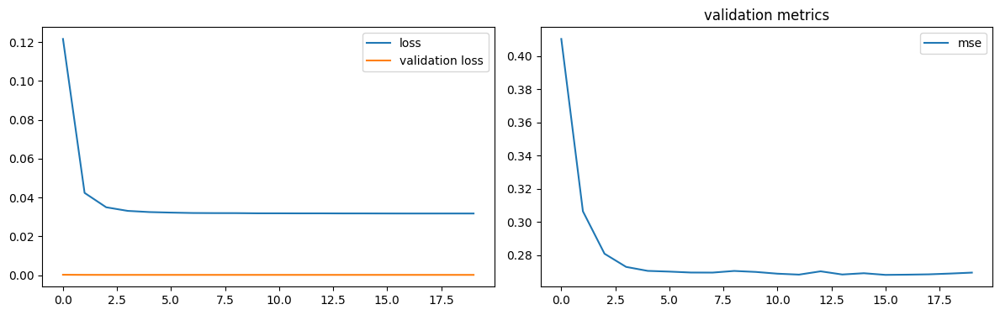

num of dropped: 2
Test: loss: 0.26840996742248535, avg metrics: (0.26810498237609864,)
dropping feature: (28, 'neuron28')


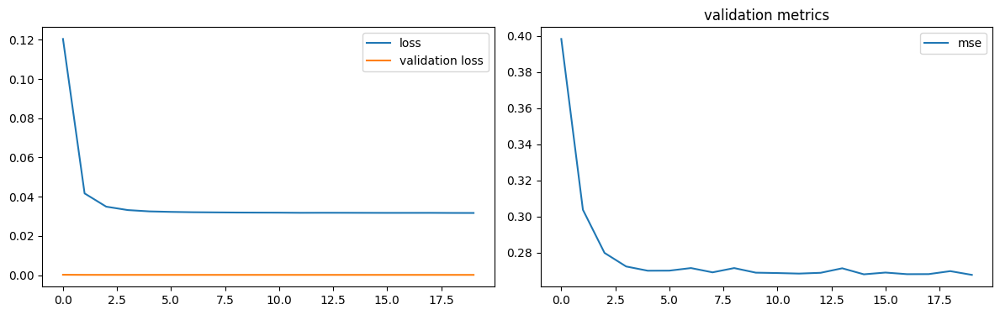

num of dropped: 3
Test: loss: 0.26706767082214355, avg metrics: (0.2673646807670593,)
dropping feature: (47, 'neuron49')


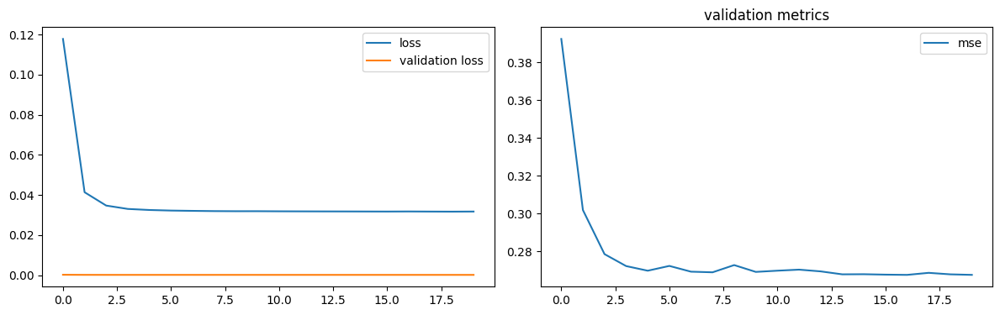

num of dropped: 4
Test: loss: 0.2671508491039276, avg metrics: (0.26734482645988467,)
dropping feature: (54, 'neuron58')


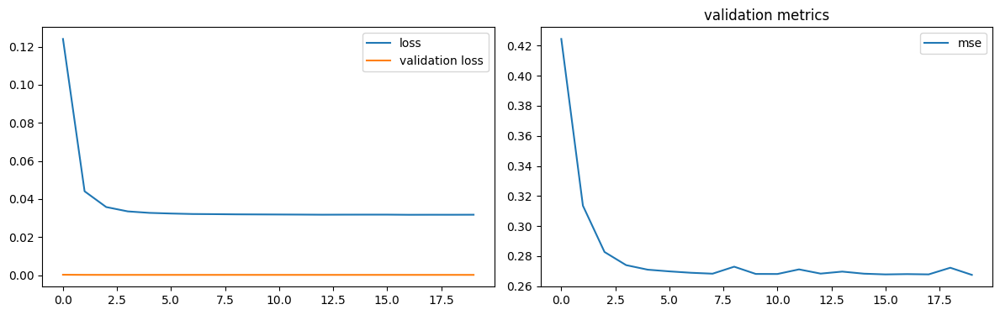

num of dropped: 5
Test: loss: 0.2672124207019806, avg metrics: (0.26747695207595823,)
dropping feature: (10, 'neuron10')


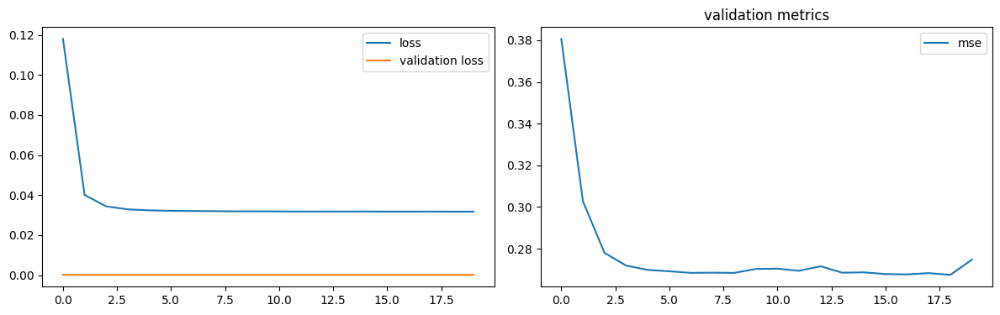

num of dropped: 6
Test: loss: 0.27218765020370483, avg metrics: (0.26892164945602415,)
dropping feature: (46, 'neuron50')


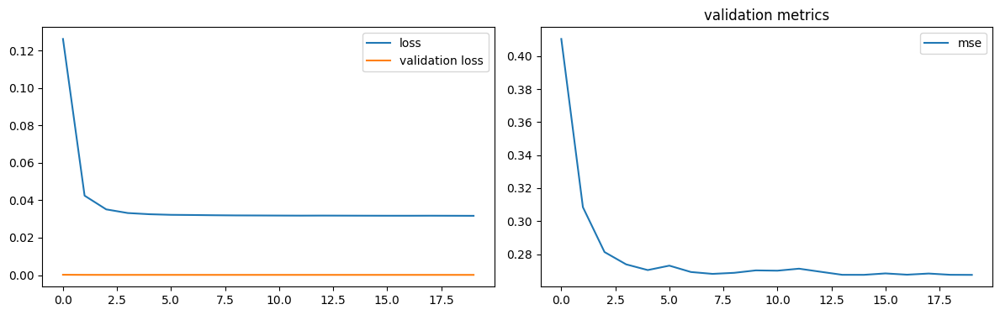

num of dropped: 7
Test: loss: 0.2669461667537689, avg metrics: (0.26753007173538207,)
dropping feature: (13, 'neuron14')


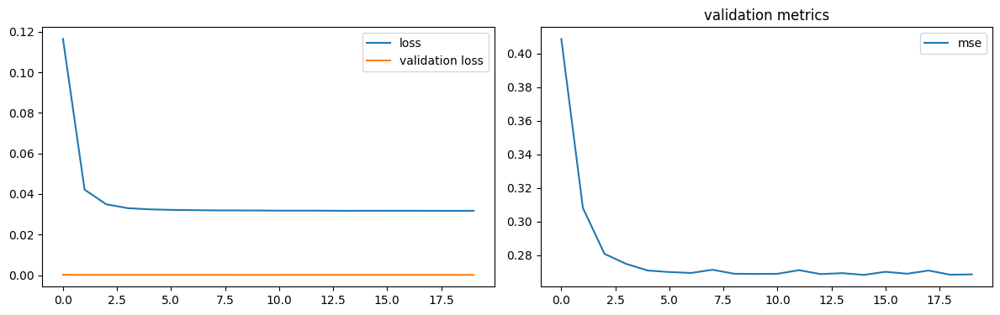

num of dropped: 8
Test: loss: 0.2672138214111328, avg metrics: (0.26770238280296327,)
dropping feature: (45, 'neuron51')


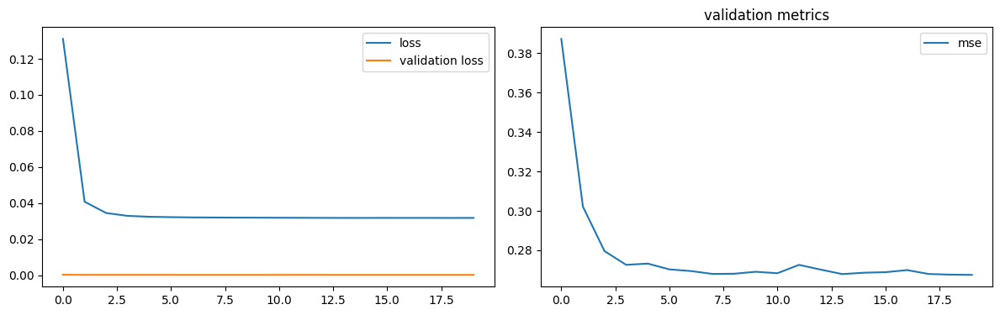

num of dropped: 9
Test: loss: 0.2671903073787689, avg metrics: (0.2678458094596863,)
dropping feature: (12, 'neuron13')


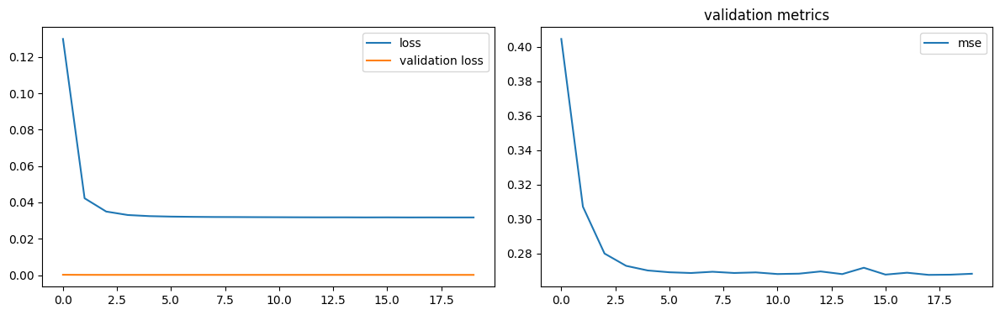

num of dropped: 10
Test: loss: 0.267631471157074, avg metrics: (0.26811336278915404,)
dropping feature: (51, 'neuron61')


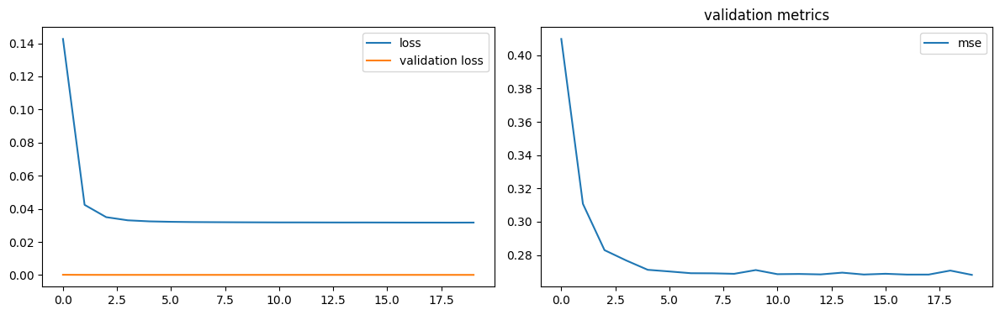

num of dropped: 11
Test: loss: 0.2688435912132263, avg metrics: (0.26918808817863465,)
dropping feature: (30, 'neuron34')


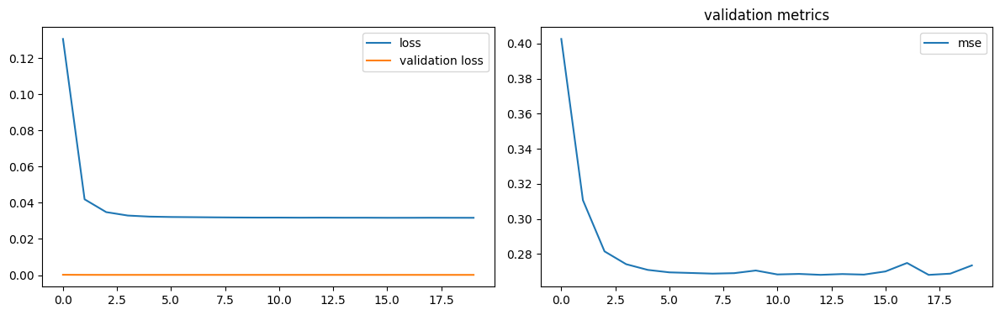

num of dropped: 12
Test: loss: 0.27079951763153076, avg metrics: (0.2692757844924927,)
dropping feature: (51, 'neuron63')


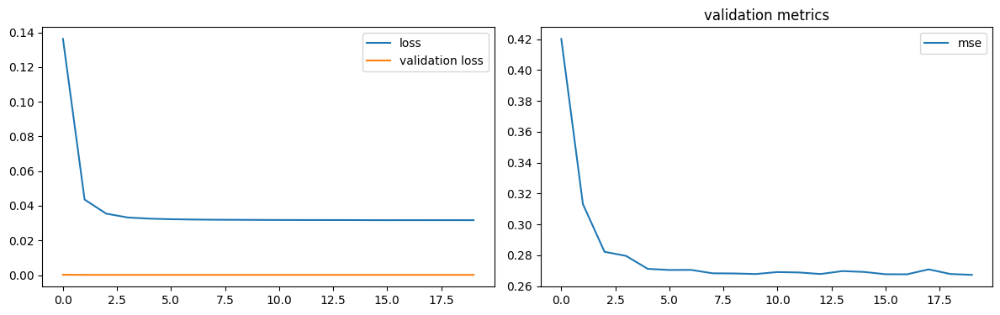

num of dropped: 13
Test: loss: 0.2672657370567322, avg metrics: (0.2679348886013031,)
dropping feature: (43, 'neuron52')


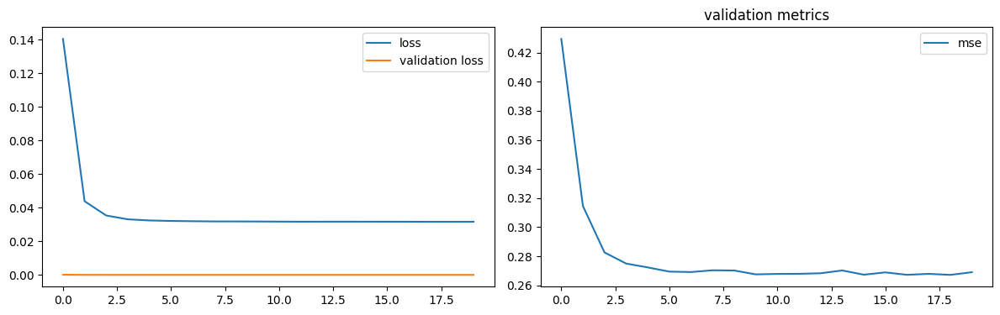

num of dropped: 14
Test: loss: 0.26749613881111145, avg metrics: (0.2676315248012543,)
dropping feature: (10, 'neuron11')


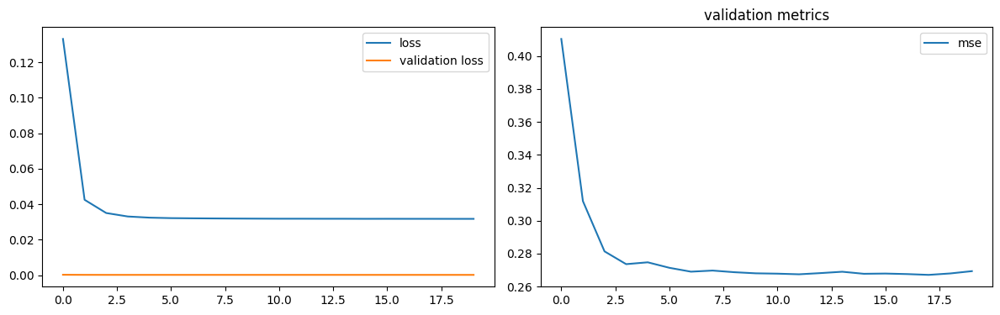

num of dropped: 15
Test: loss: 0.2678748667240143, avg metrics: (0.267861407995224,)
dropping feature: (2, 'neuron2')


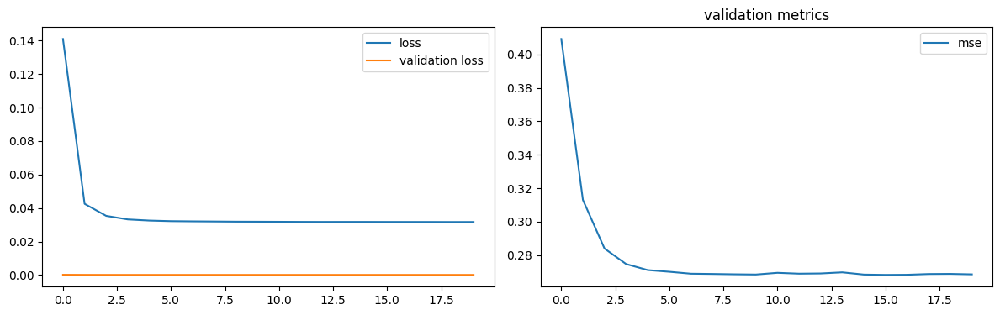

num of dropped: 16
Test: loss: 0.2677757441997528, avg metrics: (0.2676406383514404,)
dropping feature: (45, 'neuron59')


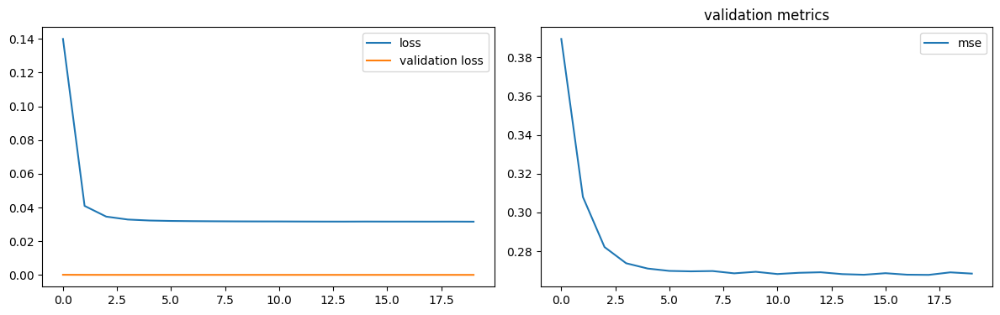

num of dropped: 17
Test: loss: 0.2689860463142395, avg metrics: (0.2679563045501709,)
dropping feature: (31, 'neuron39')


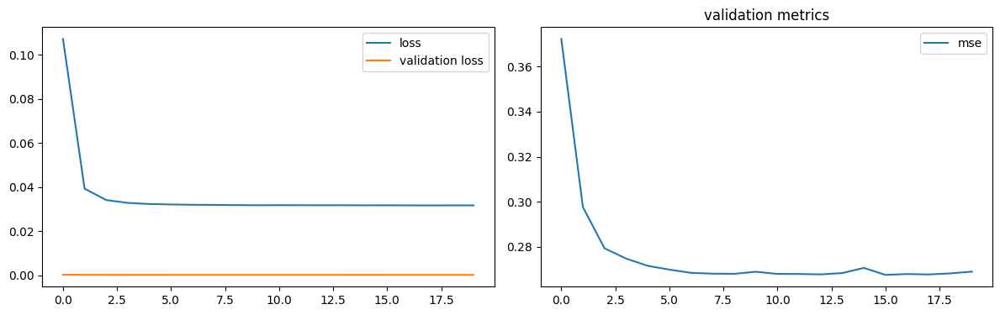

num of dropped: 18
Test: loss: 0.2680436670780182, avg metrics: (0.2675300478935242,)
dropping feature: (23, 'neuron29')


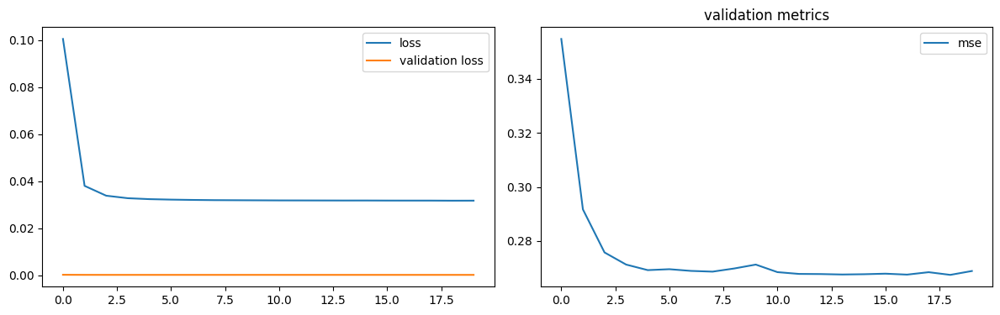

num of dropped: 19
Test: loss: 0.26745596528053284, avg metrics: (0.26715928316116333,)
dropping feature: (4, 'neuron5')


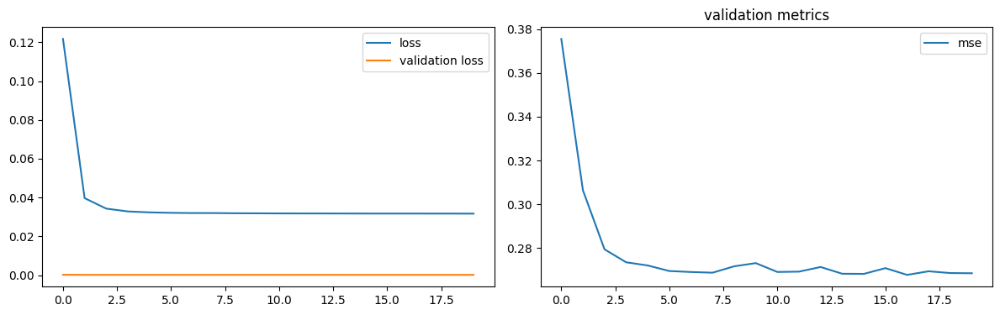

num of dropped: 20
Test: loss: 0.26704245805740356, avg metrics: (0.26733253598213197,)
dropping feature: (12, 'neuron18')


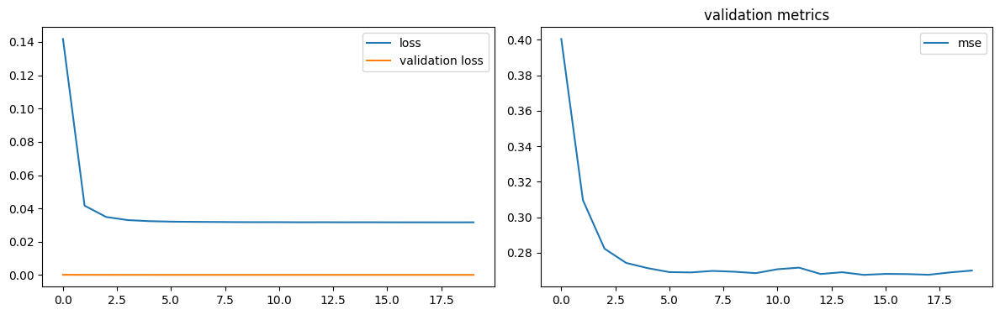

num of dropped: 21
Test: loss: 0.2679058015346527, avg metrics: (0.2674072027206421,)
dropping feature: (5, 'neuron7')


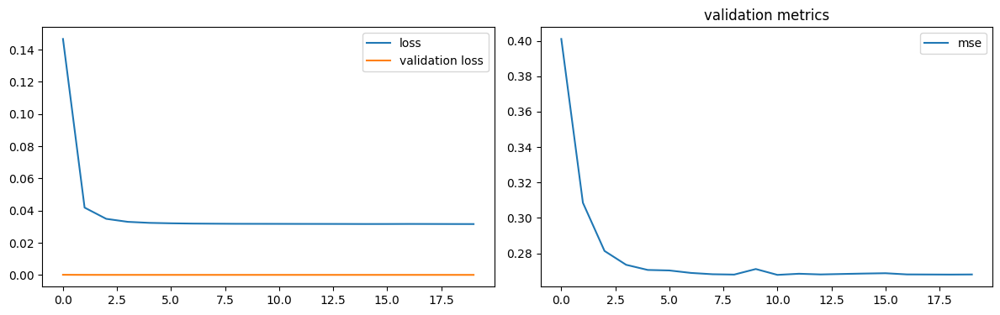

num of dropped: 22
Test: loss: 0.2679508924484253, avg metrics: (0.2683470010757446,)
dropping feature: (31, 'neuron44')


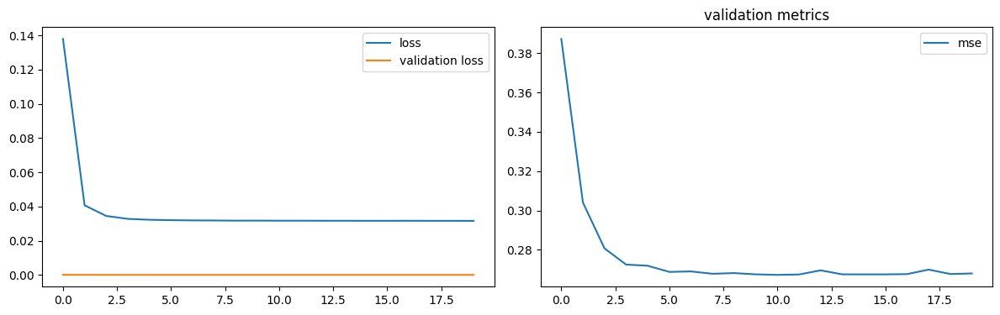

num of dropped: 23
Test: loss: 0.2681739926338196, avg metrics: (0.26740790009498594,)
dropping feature: (11, 'neuron19')


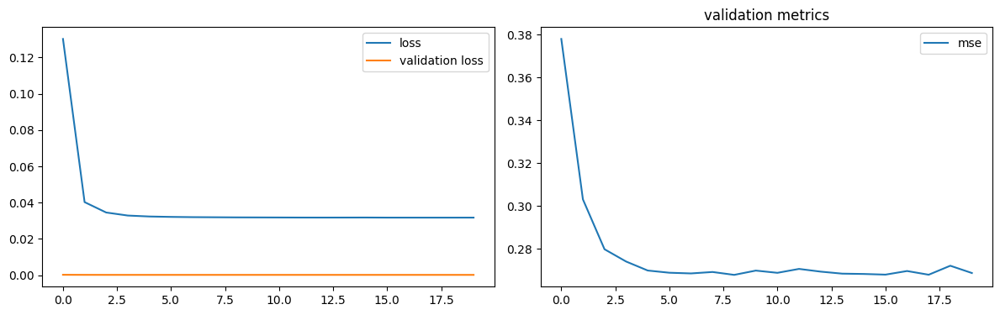

num of dropped: 24
Test: loss: 0.26901790499687195, avg metrics: (0.26758529543876647,)
dropping feature: (16, 'neuron25')


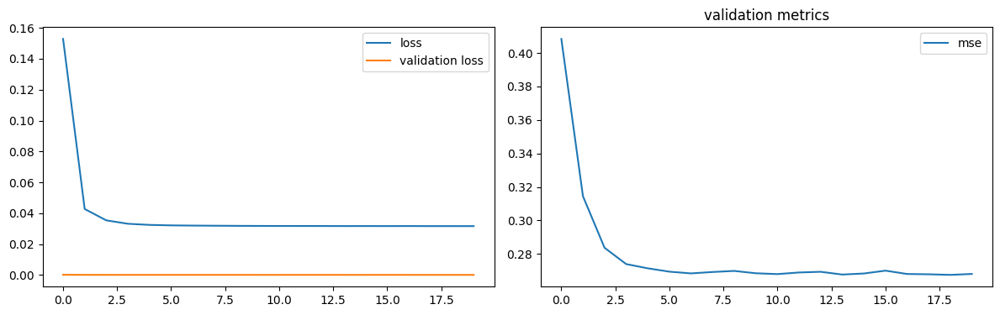

num of dropped: 25
Test: loss: 0.26756376028060913, avg metrics: (0.26765828132629393,)
dropping feature: (14, 'neuron23')


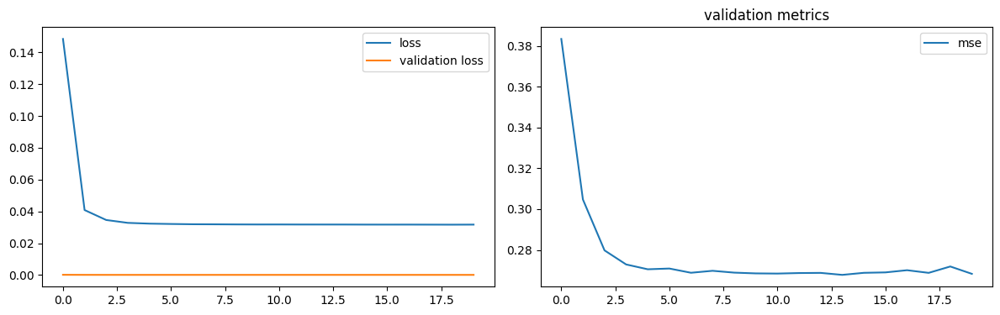

num of dropped: 26
Test: loss: 0.2671789526939392, avg metrics: (0.26725504398345945,)
dropping feature: (37, 'neuron62')


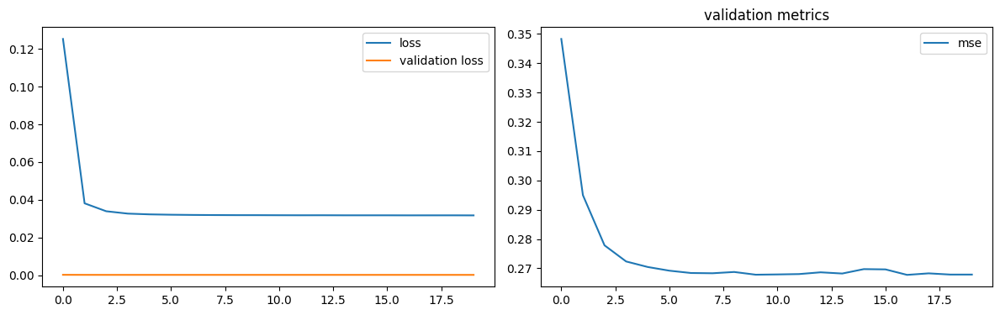

num of dropped: 27
Test: loss: 0.2669660747051239, avg metrics: (0.26733405590057374,)
dropping feature: (23, 'neuron37')


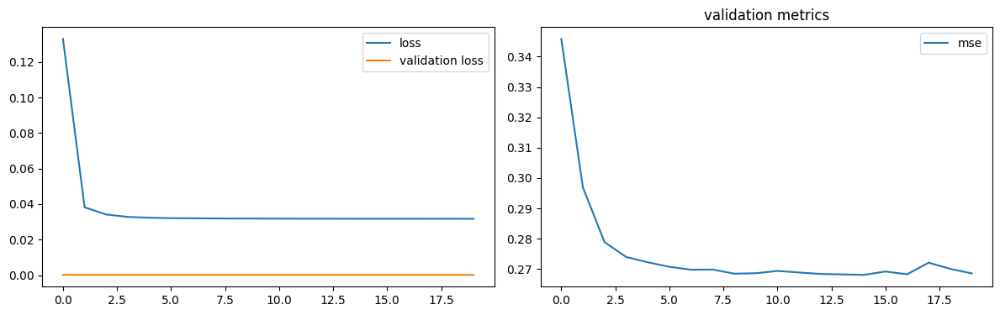

num of dropped: 28
Test: loss: 0.2673274576663971, avg metrics: (0.2675556778907776,)
dropping feature: (12, 'neuron21')


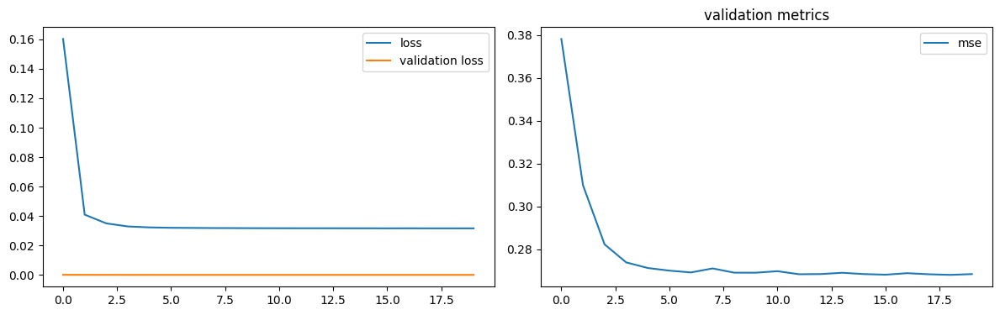

num of dropped: 29
Test: loss: 0.2683890461921692, avg metrics: (0.26772714257240293,)
dropping feature: (12, 'neuron22')


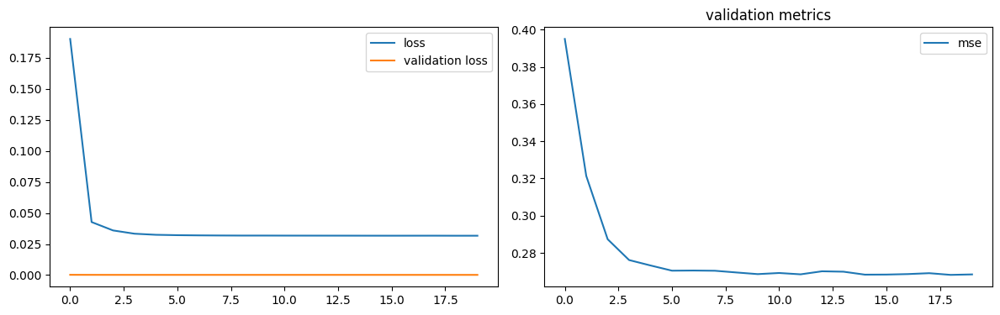

num of dropped: 30
Test: loss: 0.2674112915992737, avg metrics: (0.26761220693588256,)
dropping feature: (26, 'neuron46')


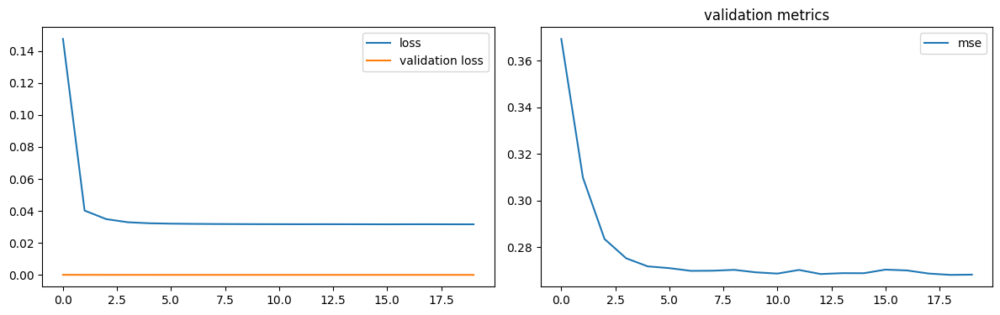

num of dropped: 31
Test: loss: 0.26788264513015747, avg metrics: (0.2676793456077576,)
dropping feature: (2, 'neuron3')


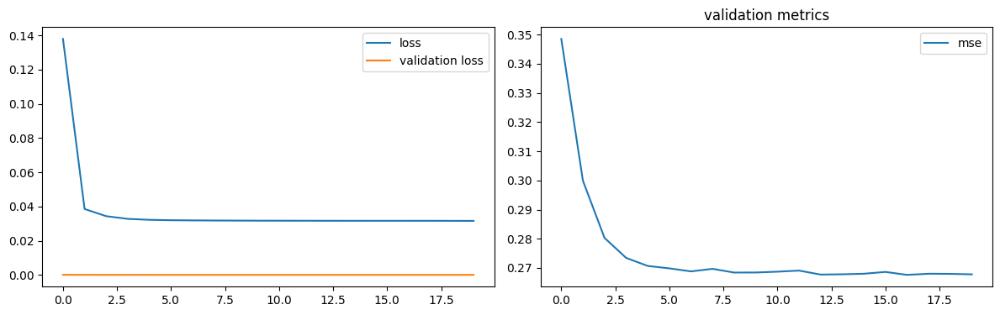

num of dropped: 32
Test: loss: 0.26719826459884644, avg metrics: (0.2674819529056549,)
dropping feature: (1, 'neuron1')


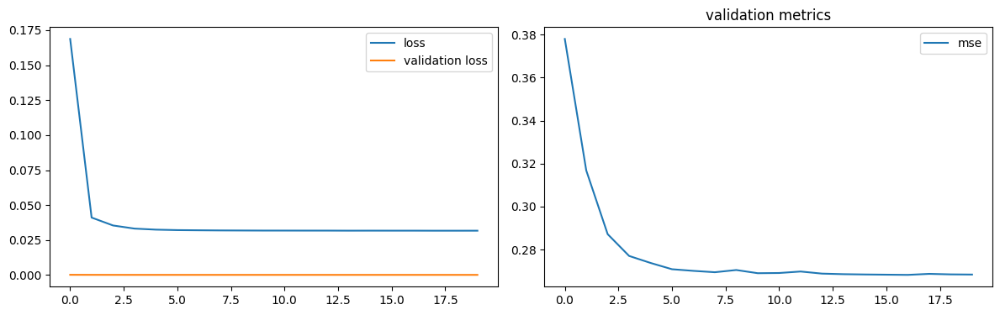

num of dropped: 33
Test: loss: 0.2674011290073395, avg metrics: (0.2675636768341064,)
dropping feature: (6, 'neuron15')


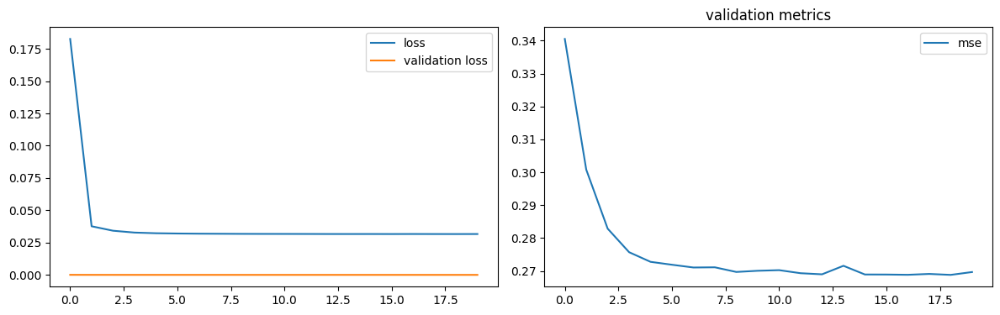

num of dropped: 34
Test: loss: 0.2680826187133789, avg metrics: (0.2680955171585083,)
dropping feature: (19, 'neuron41')


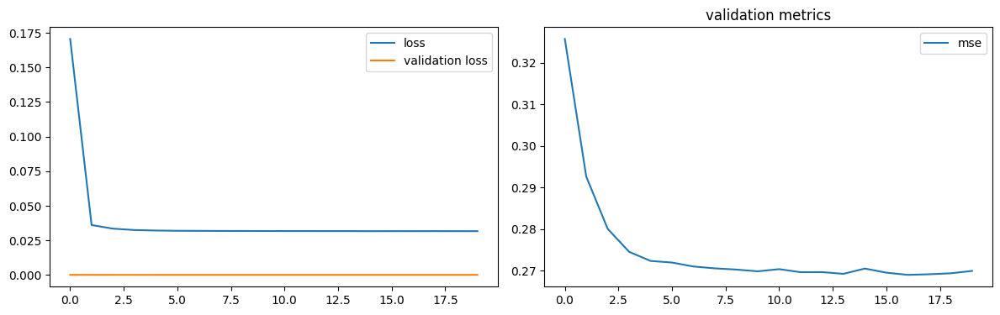

num of dropped: 35
Test: loss: 0.26845601201057434, avg metrics: (0.2685316026210785,)
dropping feature: (6, 'neuron16')


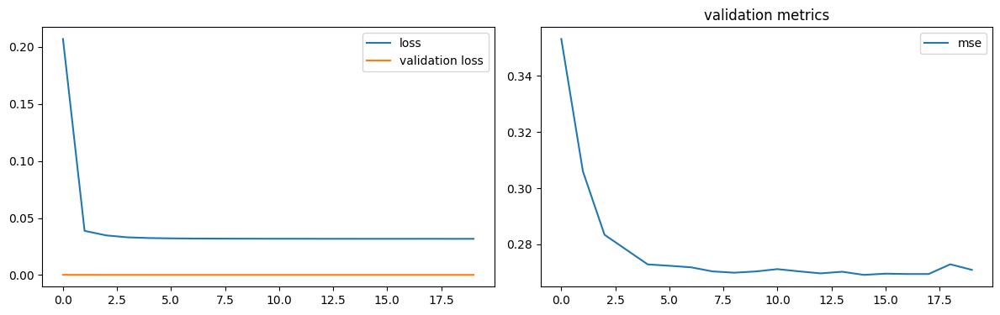

num of dropped: 36
Test: loss: 0.2685719132423401, avg metrics: (0.2683742105960846,)
dropping feature: (3, 'neuron8')


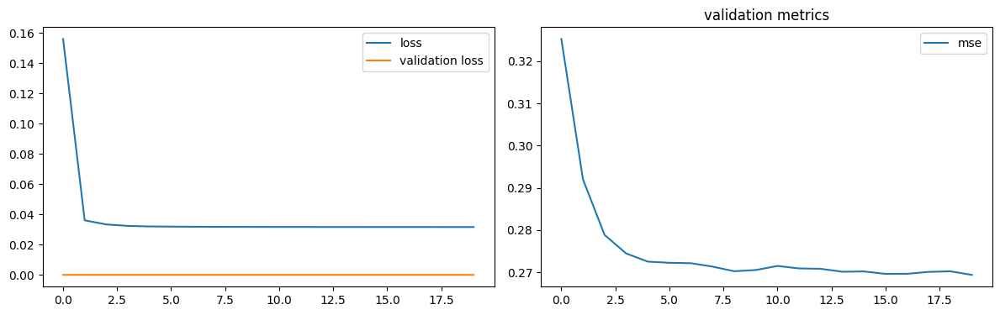

num of dropped: 37
Test: loss: 0.26815909147262573, avg metrics: (0.2685537219047546,)
dropping feature: (1, 'neuron4')


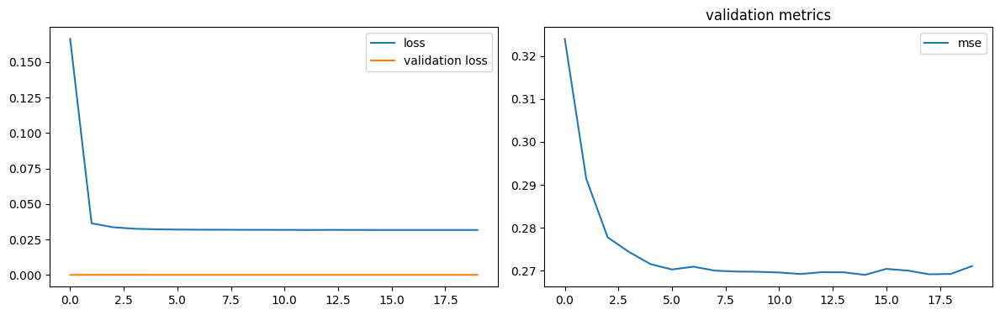

num of dropped: 38
Test: loss: 0.268978476524353, avg metrics: (0.2684799075126648,)
dropping feature: (25, 'neuron60')


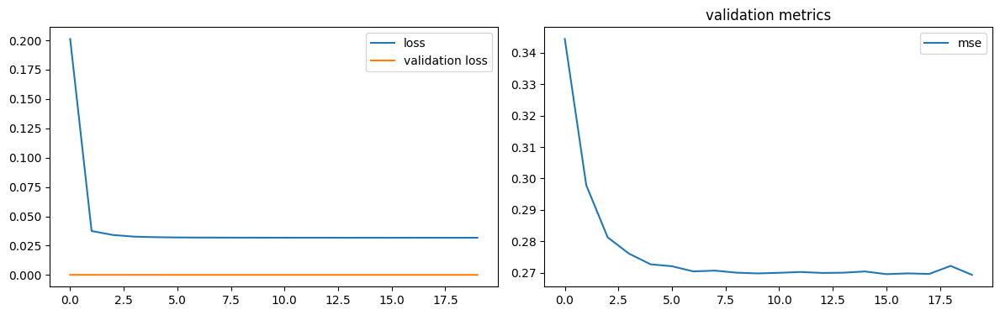

num of dropped: 39
Test: loss: 0.26837101578712463, avg metrics: (0.2686927139759064,)
dropping feature: (9, 'neuron30')


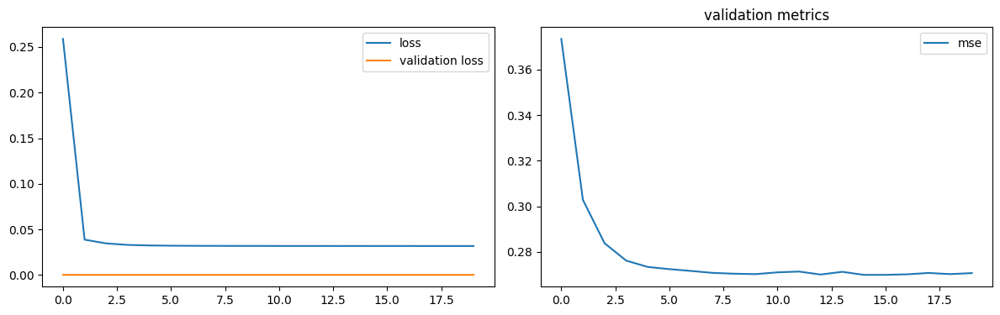

num of dropped: 40
Test: loss: 0.2689182460308075, avg metrics: (0.2685777425765991,)
dropping feature: (5, 'neuron20')


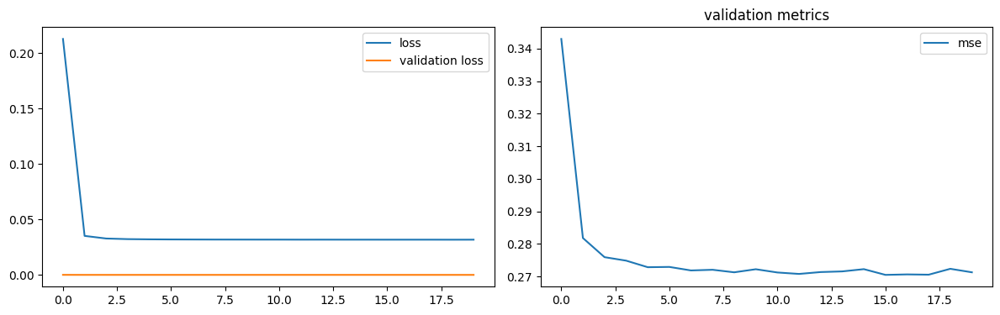

num of dropped: 41
Test: loss: 0.2687136232852936, avg metrics: (0.2686716437339783,)
dropping feature: (8, 'neuron31')


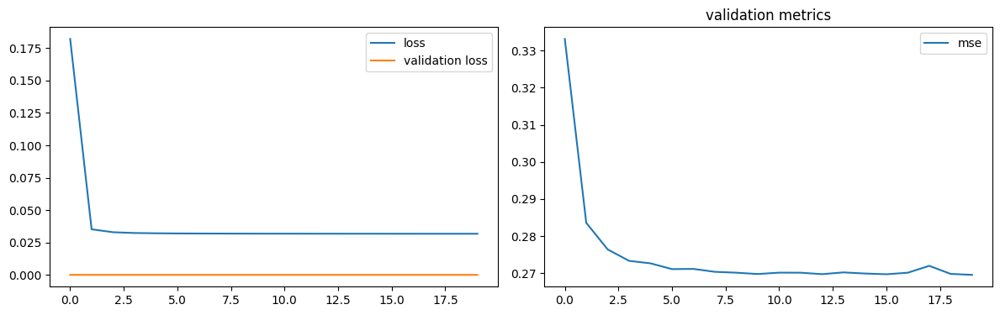

num of dropped: 42
Test: loss: 0.2682610750198364, avg metrics: (0.268488872051239,)
dropping feature: (2, 'neuron9')


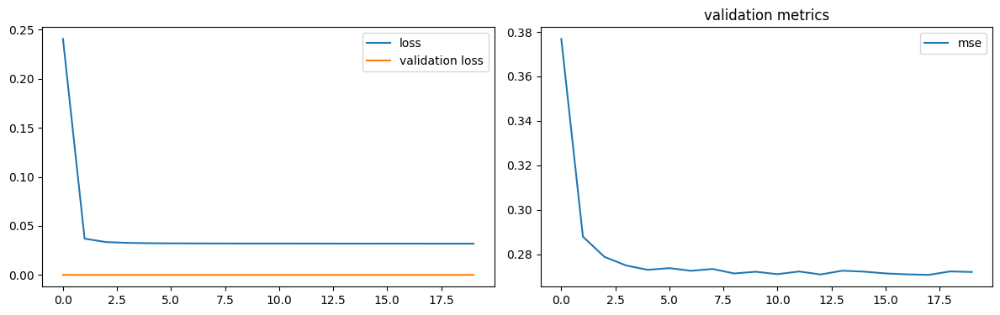

num of dropped: 43
Test: loss: 0.2691713571548462, avg metrics: (0.26891841292381286,)
dropping feature: (13, 'neuron43')


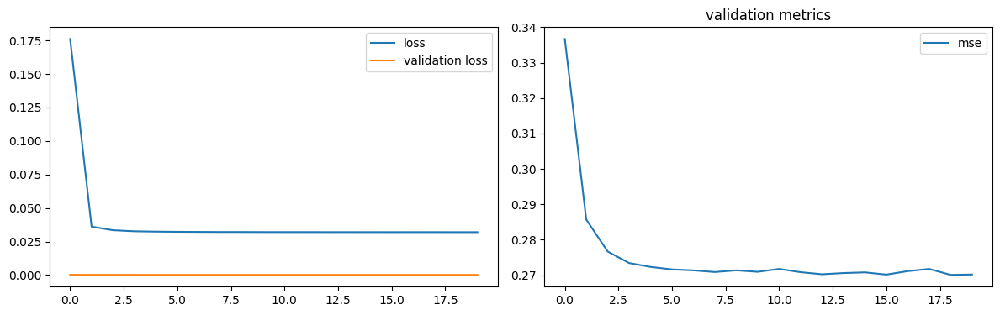

num of dropped: 44
Test: loss: 0.2684679329395294, avg metrics: (0.2684320330619812,)
dropping feature: (5, 'neuron26')


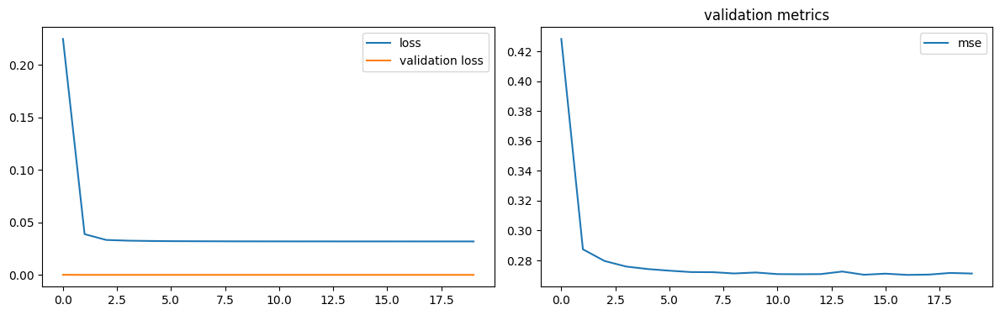

num of dropped: 45
Test: loss: 0.2684364914894104, avg metrics: (0.26846320629119874,)
dropping feature: (16, 'neuron54')


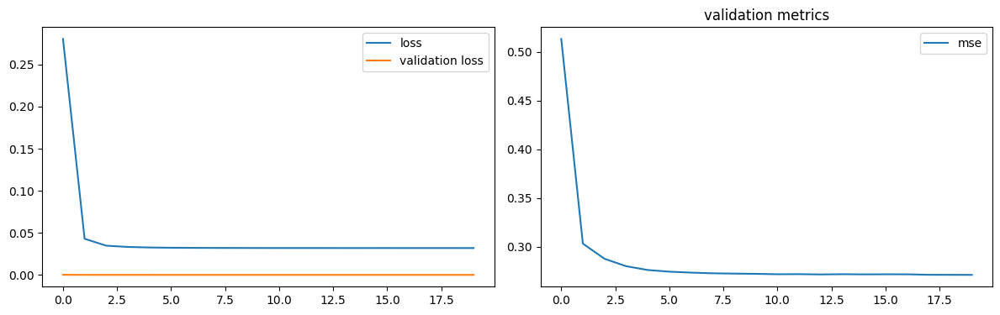

num of dropped: 46
Test: loss: 0.26912564039230347, avg metrics: (0.2690811216831207,)
dropping feature: (8, 'neuron35')


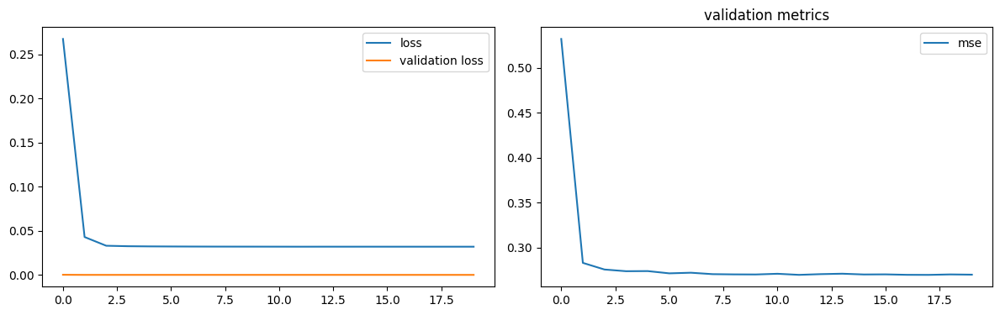

num of dropped: 47
Test: loss: 0.26874732971191406, avg metrics: (0.268783712387085,)
dropping feature: (5, 'neuron27')


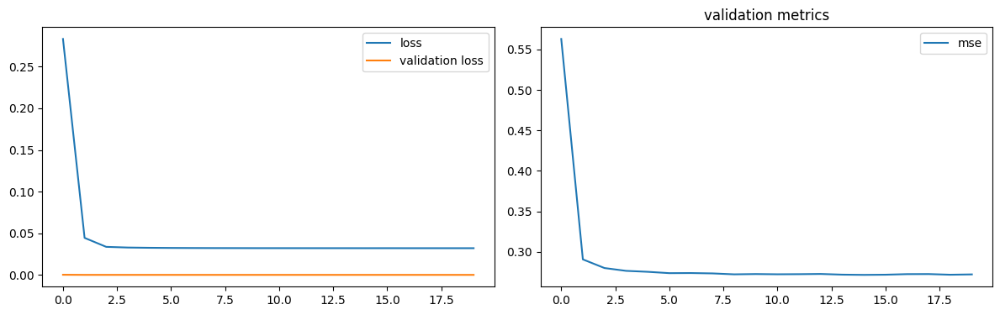

num of dropped: 48
Test: loss: 0.2691819369792938, avg metrics: (0.26919994354248045,)
dropping feature: (10, 'neuron45')


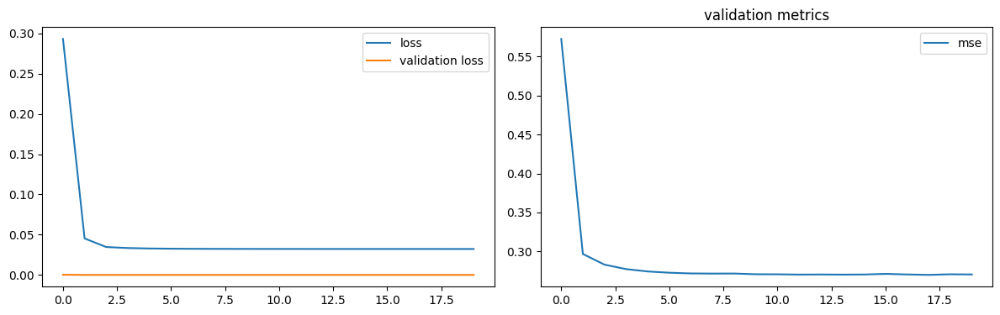

num of dropped: 49
Test: loss: 0.2684212625026703, avg metrics: (0.26855345964431765,)
dropping feature: (0, 'neuron0')


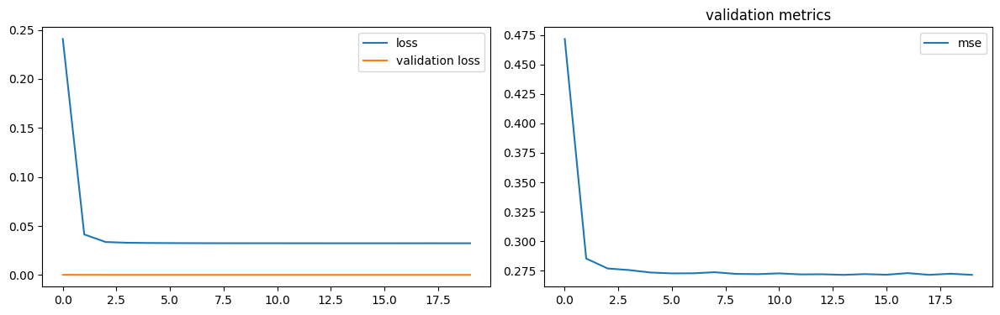

num of dropped: 50
Test: loss: 0.26945552229881287, avg metrics: (0.26933367252349855,)
dropping feature: (8, 'neuron42')


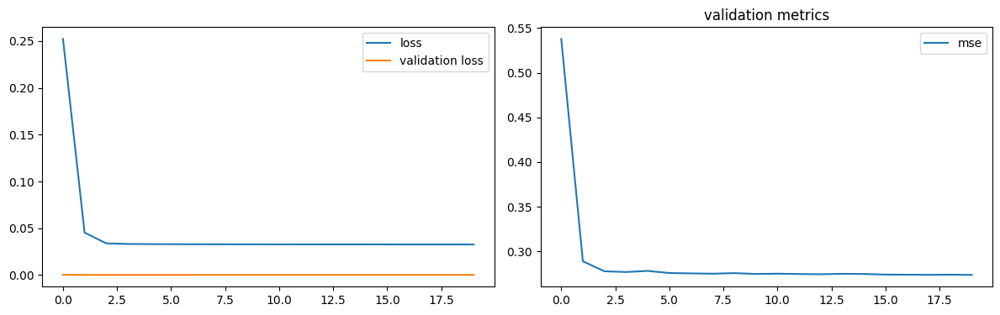

num of dropped: 51
Test: loss: 0.2694145441055298, avg metrics: (0.2694982349872589,)
dropping feature: (0, 'neuron6')


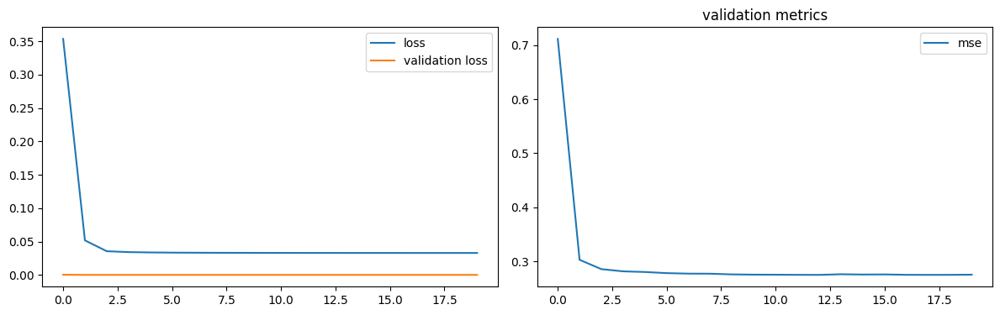

num of dropped: 52
Test: loss: 0.272016316652298, avg metrics: (0.2718810498714447,)
dropping feature: (7, 'neuron47')


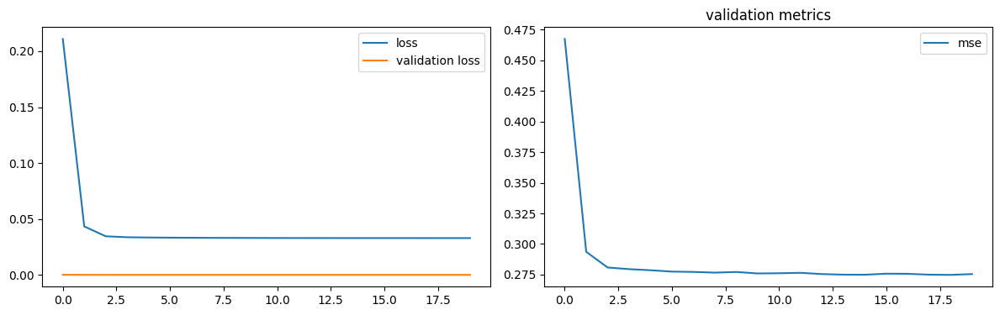

num of dropped: 53
Test: loss: 0.2723369300365448, avg metrics: (0.2724019825458527,)
dropping feature: (4, 'neuron33')


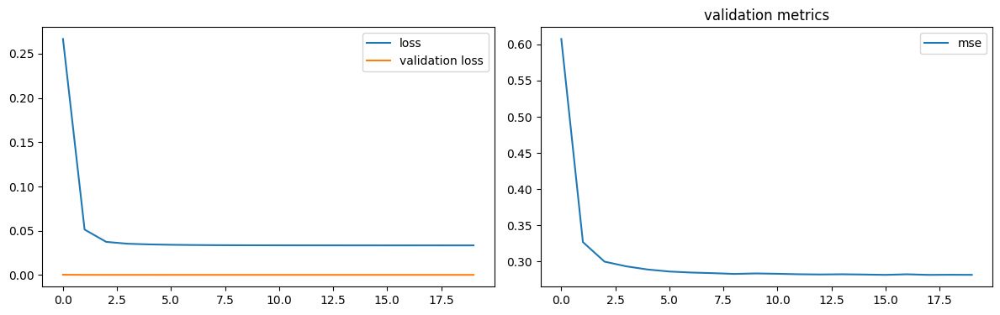

num of dropped: 54
Test: loss: 0.279218465089798, avg metrics: (0.2794006705284119,)
dropping feature: (9, 'neuron57')


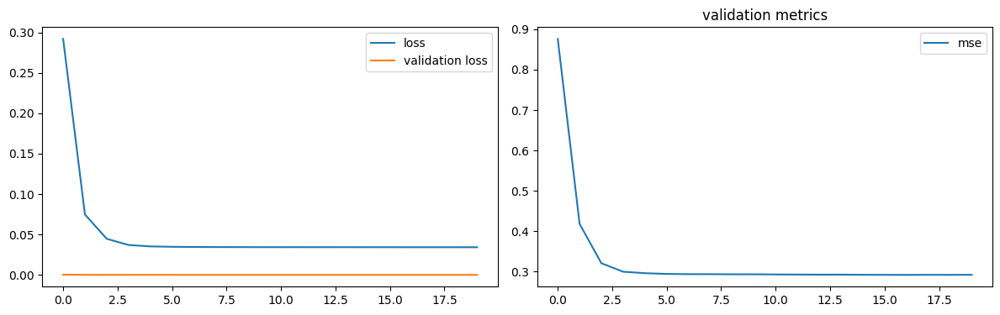

num of dropped: 55
Test: loss: 0.2847031056880951, avg metrics: (0.28488720655441285,)
dropping feature: (4, 'neuron36')


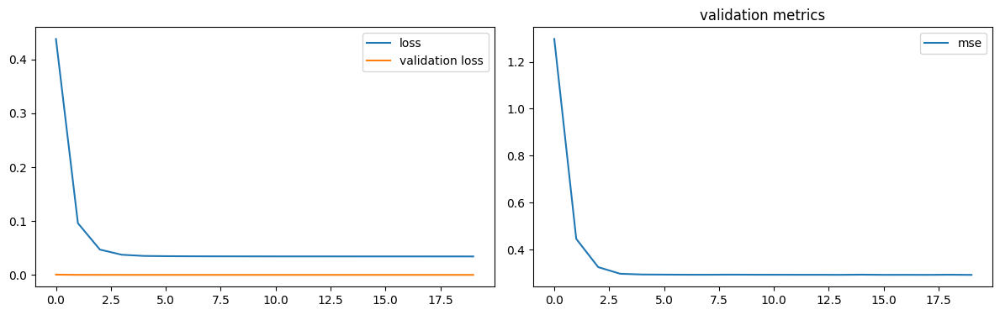

num of dropped: 56
Test: loss: 0.2846800982952118, avg metrics: (0.2848622500896454,)
dropping feature: (7, 'neuron56')


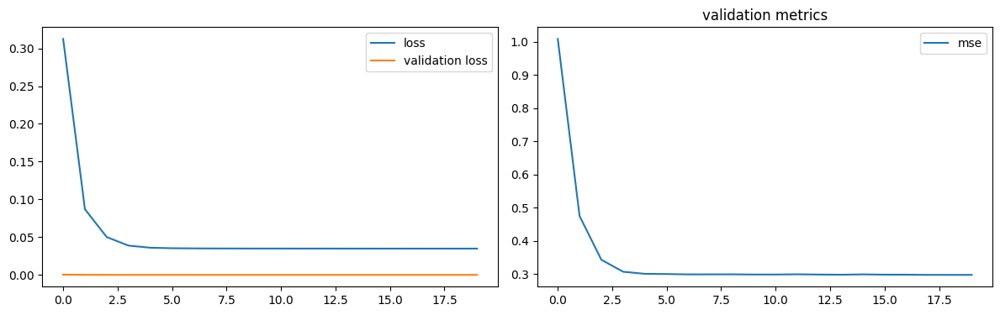

num of dropped: 57
Test: loss: 0.2881115674972534, avg metrics: (0.28818119764328004,)
dropping feature: (2, 'neuron24')


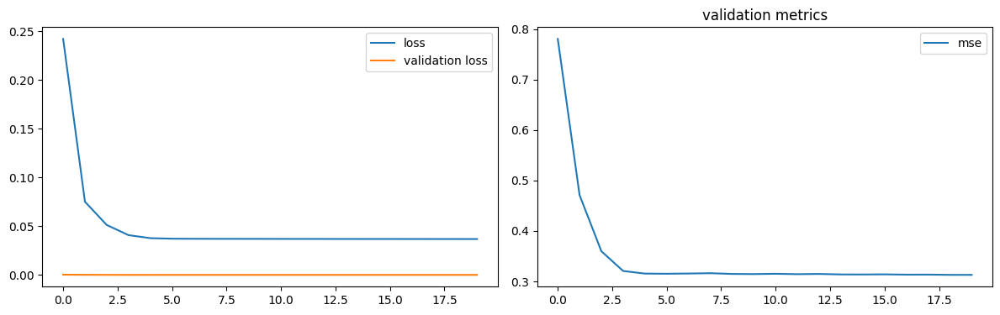

num of dropped: 58
Test: loss: 0.3027926981449127, avg metrics: (0.3027582824230194,)
dropping feature: (4, 'neuron48')


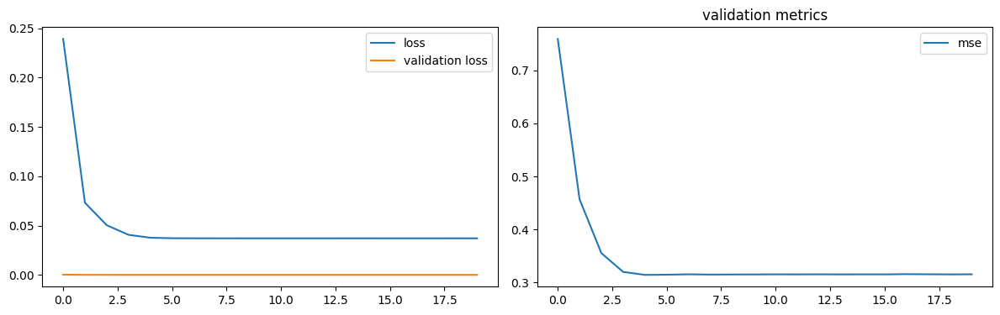

num of dropped: 59
Test: loss: 0.30292659997940063, avg metrics: (0.30298508405685426,)
dropping feature: (1, 'neuron17')


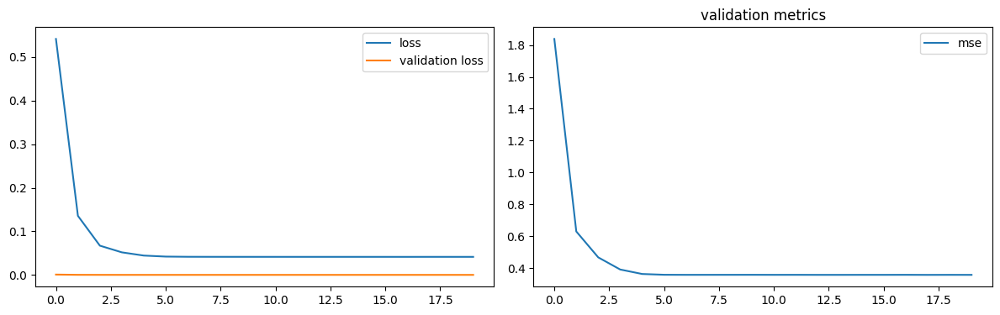

num of dropped: 60
Test: loss: 0.34034794569015503, avg metrics: (0.3404079437255859,)
dropping feature: (3, 'neuron53')


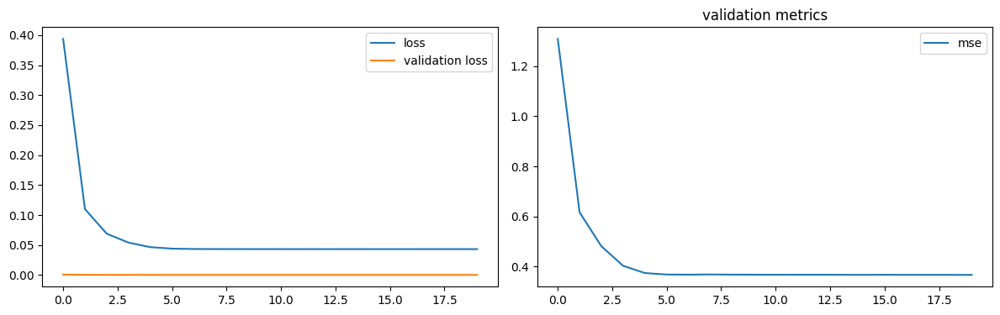

num of dropped: 61
Test: loss: 0.3554946184158325, avg metrics: (0.3550314962863922,)
dropping feature: (0, 'neuron12')


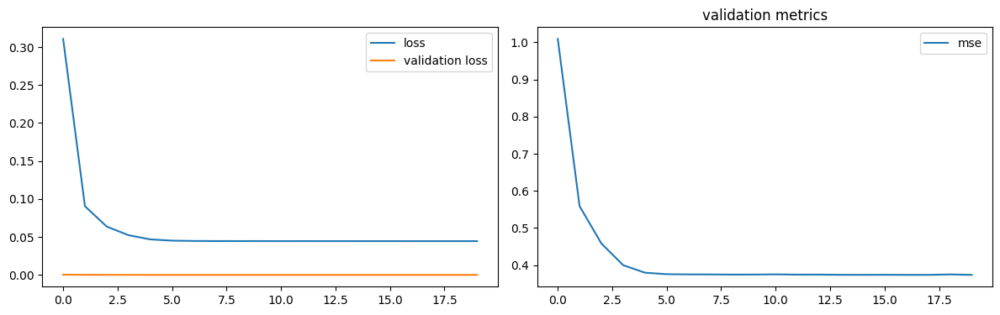

num of dropped: 62
Test: loss: 0.3663528263568878, avg metrics: (0.3657028317451477,)
dropping feature: (1, 'neuron40')


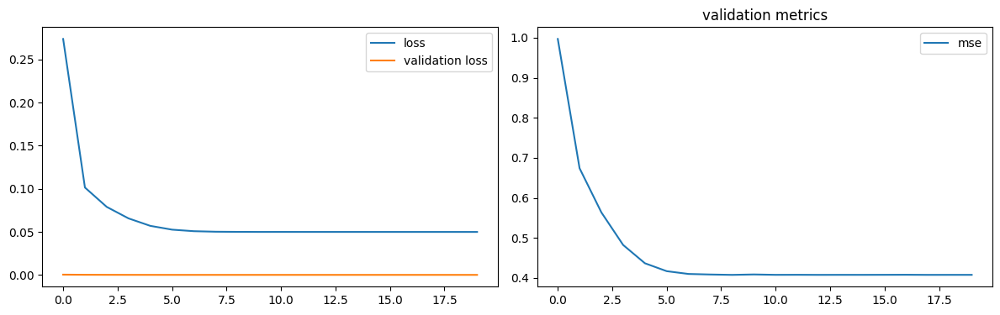

num of dropped: 63
Test: loss: 0.40669214725494385, avg metrics: (0.406236058473587,)


In [37]:
torch.manual_seed(2024)

headers = [f"neuron{i}" for i in range(64)]


def model_factory(size):
    model = CaliforniaNN(1, (1, size))
    model.layer1 = nn.Identity()
    model.layer2 = nn.Identity()
    return model


test_metrics, dropped, models = prune(
    datasets, headers, analyze_dgsm,
    model_factory, optimizer_factory, criterion, score_outputs, 20,
    labels, "", None
)

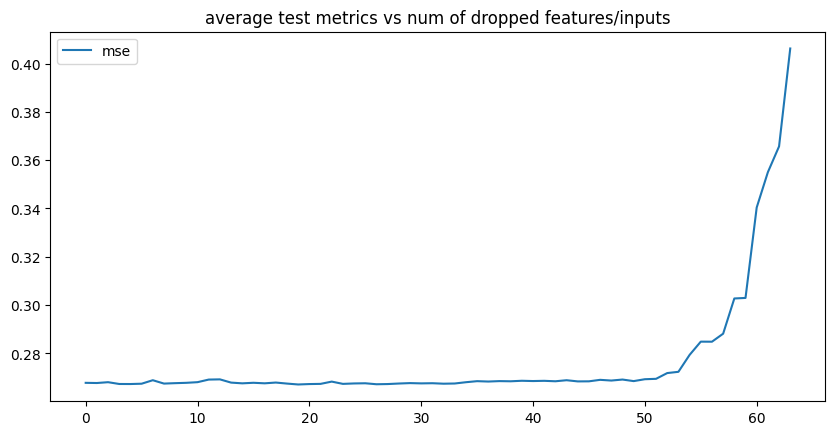

In [38]:
plot_dropping_metrics(test_metrics, labels)

In [39]:
num_drop_neurons = 49

save_models("california", "fast-layer3", models, dropped)

reduced_datasets, reduced_headers = reduce_datasets(datasets, headers, dropped, num_drop_neurons)
layer = models[num_drop_neurons].out

best_model.out = layer
best_model.layer2[0] = reduce_linear(best_model.layer2[0], dropped, num_drop_neurons)

features left [15]:  ['neuron0', 'neuron6', 'neuron12', 'neuron17', 'neuron24', 'neuron32', 'neuron33', 'neuron36', 'neuron40', 'neuron42', 'neuron47', 'neuron48', 'neuron53', 'neuron56', 'neuron57']


### pruned

In [40]:
best_model

CaliforniaNN(
  (layer1): Sequential(
    (0): Linear(in_features=6, out_features=29, bias=True)
    (1): ReLU()
  )
  (layer2): Sequential(
    (0): Linear(in_features=29, out_features=15, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
  )
  (out): Linear(in_features=15, out_features=1, bias=True)
)

In [41]:
with torch.no_grad():
    inputs, targets = fast_dataset["test"][:]
    outputs = best_model(inputs)

    test_metrics = score_outputs(outputs, targets)

print(f"test {labels}: {test_metrics}")

test mse: (0.2684212625026703,)


test: mse: (0.2866418659687042,)


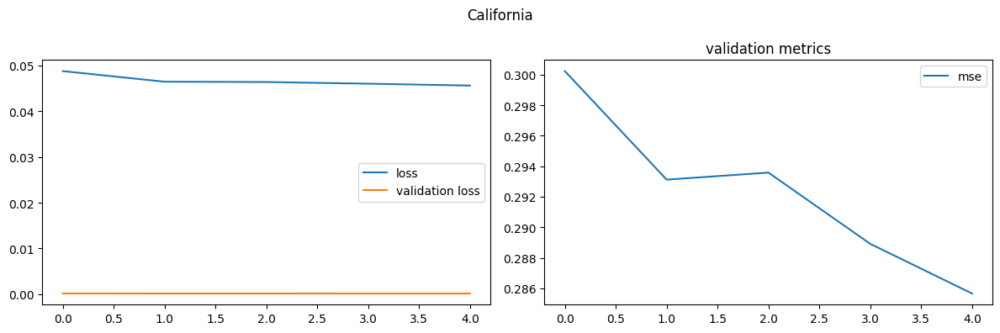

In [42]:
optimizer = optimizer_factory(best_model)
metrics = model_train(fast_dataset, best_model, optimizer, criterion, score_outputs, 5)

with torch.no_grad():
    inputs, targets = fast_dataset["test"][:]
    outputs = best_model(inputs)

    test_metrics = score_outputs(outputs, targets)

print(f"test: {labels}: {test_metrics}")
plot_metrics('California', metrics, labels)

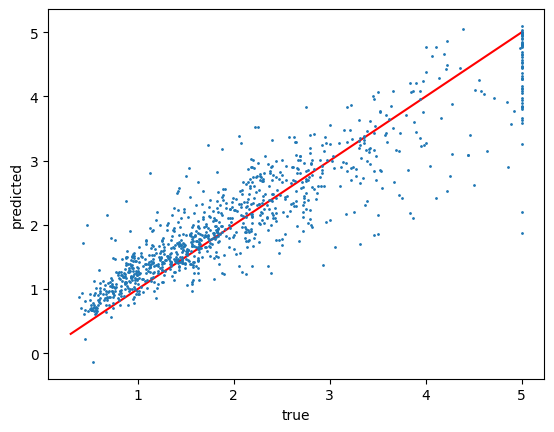

In [43]:
plt.plot([0.3, 5], [0.3, 5], c='r')
plt.plot(datasets["test"].tensors[1][:1000], outputs[:1000], '.', ms=2)
plt.xlabel("true")
plt.ylabel("predicted")
plt.show()

In [44]:
save_models("california", "fast-prunned", [best_model], None)